<a href="https://colab.research.google.com/github/ace26597/Acea-Smart-Water-Analytics/blob/main/acea_all.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as pl
from pylab import rcParams
import statsmodels.api as sm
import plotly.express as px
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit
plt.style.use('seaborn-whitegrid')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Import Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Aquifer_Auser = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Auser.csv')
Aquifer_Doganella = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Doganella.csv')
Aquifer_Luco = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Luco.csv')
Aquifer_Petrignano = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Petrignano.csv')
Lake_Bilancino = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Lake_Bilancino.csv')
River_Arno  = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/River_Arno.csv')
Water_Spring_Amiata = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Amiata.csv')
Water_Spring_Lupa = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Lupa.csv')
Water_Spring_Madonna_di_Canneto = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Madonna_di_Canneto.csv')


Aquifer_Auser['Date'] = pd.to_datetime(Aquifer_Auser['Date'], dayfirst=True)
Aquifer_Doganella['Date'] = pd.to_datetime(Aquifer_Doganella['Date'], dayfirst=True)
Aquifer_Luco['Date'] = pd.to_datetime(Aquifer_Luco['Date'], dayfirst=True)
Aquifer_Petrignano['Date'] = pd.to_datetime(Aquifer_Petrignano['Date'], dayfirst=True)
Lake_Bilancino['Date'] = pd.to_datetime(Lake_Bilancino['Date'], dayfirst=True)
River_Arno['Date'] = pd.to_datetime(River_Arno['Date'], dayfirst=True)
Water_Spring_Amiata['Date'] = pd.to_datetime(Water_Spring_Amiata['Date'], dayfirst=True)
Water_Spring_Lupa['Date'] = pd.to_datetime(Water_Spring_Lupa['Date'], dayfirst=True)
Water_Spring_Madonna_di_Canneto['Date'] = pd.to_datetime(Water_Spring_Madonna_di_Canneto['Date'], dayfirst=True)



Aquifer_Auser_target = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Aquifer_Doganella_target = ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2','Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4','Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6','Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8','Depth_to_Groundwater_Pozzo_9']
Aquifer_Luco_target = ['Depth_to_Groundwater_Podere_Casetta']
Aquifer_Petrignano_target = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Lake_Bilancino_target = ['Lake_Level', 'Flow_Rate']
River_Arno_target = ['Hydrometry_Nave_di_Rosano']
Water_Spring_Amiata_target = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Water_Spring_Lupa_target = ['Flow_Rate_Lupa']
Water_Spring_Madonna_di_Canneto_target = ['Flow_Rate_Madonna_di_Canneto']
#Aquifer_Doganella = Aquifer_Doganella.set_index('Date')

all_data = [Aquifer_Auser,Aquifer_Doganella,Aquifer_Luco,Aquifer_Petrignano,Lake_Bilancino,River_Arno,Water_Spring_Amiata,Water_Spring_Lupa,Water_Spring_Madonna_di_Canneto]
all_data_target = [Aquifer_Auser_target,Aquifer_Doganella_target,Aquifer_Luco_target,Aquifer_Petrignano_target,Lake_Bilancino_target,River_Arno_target,Water_Spring_Amiata_target,Water_Spring_Lupa_target,Water_Spring_Madonna_di_Canneto_target]

# Aquifer_Doganella

## Data Exploration

In [ ]:
Aquifer_Doganella.head()

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
0,2004-01-01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.30,8.60
1,2004-01-02,0.2,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.70,6.25
2,2004-01-03,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.40,9.80
3,2004-01-04,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.35,5.95
4,2004-01-05,0.2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,5.85


In [ ]:
Aquifer_Doganella.tail()

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
6021,2020-06-26,0.0,0.0,-50.32,-100.35,-100.880,-101.49,-104.31,-97.94,-96.59,-97.74,-90.62,1516.104,3883.932,2526.516,3867.876,7949.304,2684.412,3911.832,3450.132,21.05,23.39
6022,2020-06-27,0.0,0.0,-50.32,-100.56,-100.840,-101.59,-104.30,-97.96,-96.44,-97.78,-90.54,1491.408,3884.724,2871.864,3867.300,7590.564,2681.280,3899.772,3449.088,22.18,24.44
6023,2020-06-28,0.0,0.0,-50.32,-100.56,-100.920,-101.59,-104.30,-98.46,-96.44,-97.78,-90.54,1485.756,3885.228,2858.400,3869.352,7944.660,2962.980,3901.032,3449.808,23.06,25.43
6024,2020-06-29,0.0,0.0,-50.32,-100.56,-101.190,-101.59,-104.30,-98.46,-96.10,-97.78,-90.83,1479.636,3888.684,2499.444,3873.096,7947.684,2653.884,3904.776,3129.336,22.03,24.22
6025,2020-06-30,0.0,0.0,-50.78,-100.56,-101.235,-101.59,-104.30,-98.47,-96.10,-97.78,-90.83,1470.096,3875.328,2812.356,3870.864,7941.996,2964.168,3901.932,3448.440,21.90,23.97


In [ ]:
Aquifer_Doganella.describe()

,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
count,5399.000000,5374.000000,2537.000000,2736.000000,2774.000000,2374.000000,2508.000000,2428.000000,2311.000000,2551.000000,2339.000000,1356.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,4564.000000,4383.000000
mean,2.893758,3.159732,-36.929137,-94.746188,-111.638928,-98.223934,-102.552596,-91.672955,-95.819225,-95.845370,-94.709701,1529.376211,3433.485746,3208.114931,3527.627374,7178.560713,2491.400685,3660.482101,3239.807765,13.458457,15.574038
std,8.624455,8.913341,10.179111,3.891286,3.809581,2.391763,3.711563,2.216446,1.686417,2.523905,3.778746,1154.952073,772.564645,1084.939228,700.013152,1607.944298,671.378069,813.007457,730.314145,6.763101,6.352674
min,0.000000,0.000000,-59.500000,-112.500000,-117.800000,-108.660000,-109.890000,-99.480000,-97.430000,-107.500000,-105.940000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.620000,-0.270000
25%,0.000000,0.000000,-45.250000,-98.460000,-115.077500,-100.500000,-104.450000,-92.947500,-97.350000,-97.840000,-95.565000,484.695000,3521.215000,2730.862500,3596.372500,7272.557500,2282.235000,3795.562500,3110.930000,8.085000,10.365000
50%,0.000000,0.000000,-34.900000,-93.280000,-111.805000,-97.970000,-101.815000,-91.500000,-96.570000,-95.320000,-94.270000,1408.860000,3591.810000,3215.880000,3667.210000,7854.750000,2677.160000,3894.375000,3378.455000,13.050000,15.150000
75%,0.600000,0.600000,-28.510000,-91.290000,-108.030000,-96.050000,-99.867500,-90.027500,-94.020000,-93.595000,-92.360000,2546.995000,3845.600000,3734.505000,3864.400000,7999.130000,2917.105000,3988.800000,3466.797500,18.992500,20.725000
max,112.600000,106.600000,-20.310000,-89.670000,-100.590000,-94.000000,-96.220000,-88.600000,-91.640000,-92.470000,-87.960000,4171.280000,4030.270000,5378.800000,4076.100000,8360.210000,3427.420000,4341.710000,4336.780000,30.400000,31.900000


In [ ]:
Aquifer_Doganella.isnull().sum()

Date                               0
Rainfall_Monteporzio             627
Rainfall_Velletri                652
Depth_to_Groundwater_Pozzo_1    3489
Depth_to_Groundwater_Pozzo_2    3290
Depth_to_Groundwater_Pozzo_3    3252
Depth_to_Groundwater_Pozzo_4    3652
Depth_to_Groundwater_Pozzo_5    3518
Depth_to_Groundwater_Pozzo_6    3598
Depth_to_Groundwater_Pozzo_7    3715
Depth_to_Groundwater_Pozzo_8    3475
Depth_to_Groundwater_Pozzo_9    3687
Volume_Pozzo_1                  4670
Volume_Pozzo_2                  4666
Volume_Pozzo_3                  4666
Volume_Pozzo_4                  4666
Volume_Pozzo_5+6                4666
Volume_Pozzo_7                  4666
Volume_Pozzo_8                  4666
Volume_Pozzo_9                  4666
Temperature_Monteporzio         1462
Temperature_Velletri            1643
dtype: int64

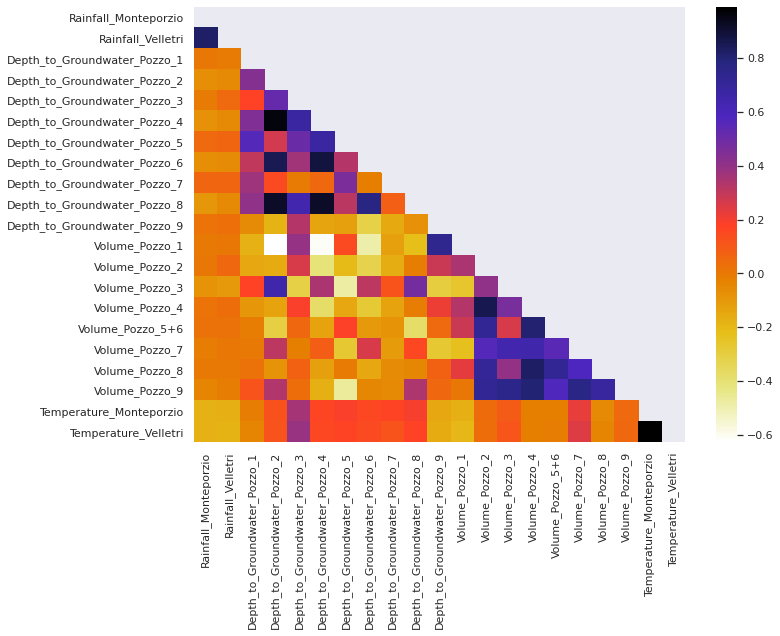

In [ ]:
mask = np.triu(np.ones_like(Aquifer_Doganella.corr(), dtype = bool))
sns.set(rc={'figure.figsize':(11,8)})
sns.heatmap(Aquifer_Doganella.corr(),mask=mask, fmt='', cmap='CMRmap_r')

In [ ]:
Aquifer_Doganella.shape

(6026, 22)

In [ ]:
Aquifer_Doganella.index

RangeIndex(start=0, stop=6026, step=1)

In [ ]:
Aquifer_Doganella.head()

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
0,2004-01-01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.30,8.60
1,2004-01-02,0.2,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.70,6.25
2,2004-01-03,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.40,9.80
3,2004-01-04,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.35,5.95
4,2004-01-05,0.2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,5.85


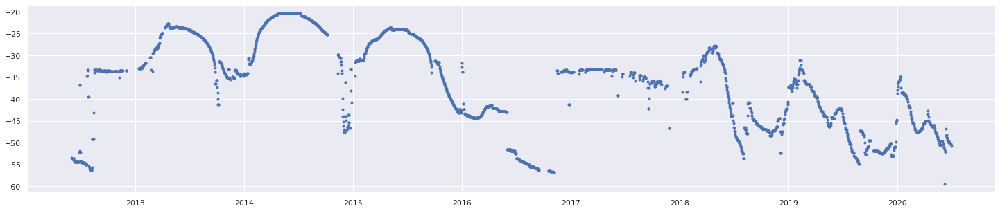

In [ ]:
plt.figure(figsize=(25,5))
plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella['Depth_to_Groundwater_Pozzo_1'],'b.')
plt.show()

Index(['Date', 'Rainfall_Gallicano', 'Rainfall_Pontetetto',
       'Rainfall_Monte_Serra', 'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano',
       'Rainfall_Piaggione', 'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione'],
      dtype='object')
['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
0   1998-03-05
1   1998-03-06
2   1998-03-07
Name: Date, dtype: datetime64[ns]
8151   2020-06-28
8152   2020-06-29
8153   2020-06-30
Name: Date, dtype: datetime6

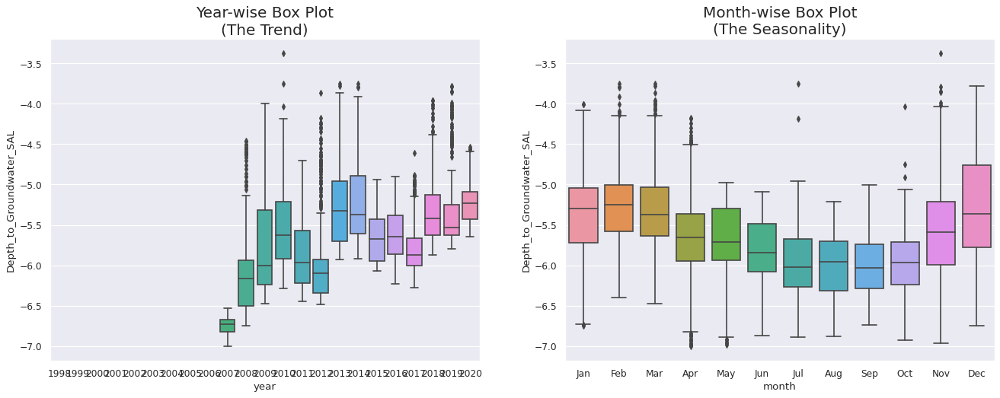

Index(['Date', 'Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri'],
      dtype='object')
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
0   2004-01-01
1   2004-01-02
2   2004-01-03
Name: Date, dtype: datetime64[ns]
6023   2

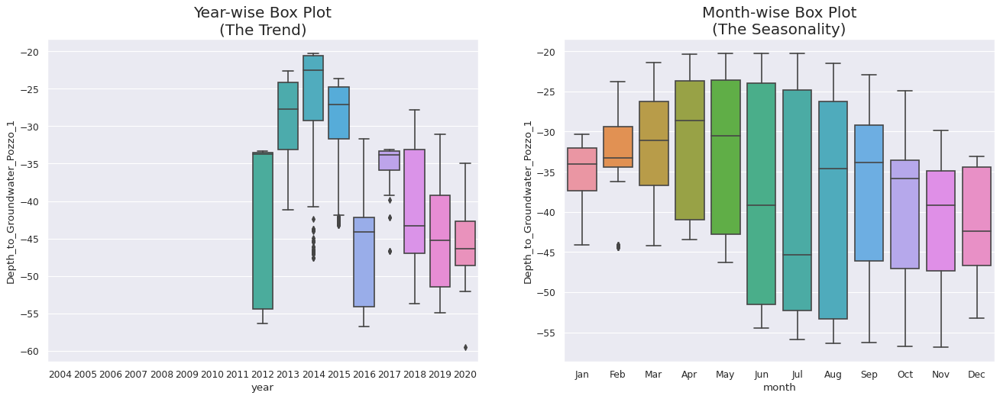

Index(['Date', 'Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4'],
      dtype='object')
['Depth_to_Groundwater_Podere_Casetta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 22)


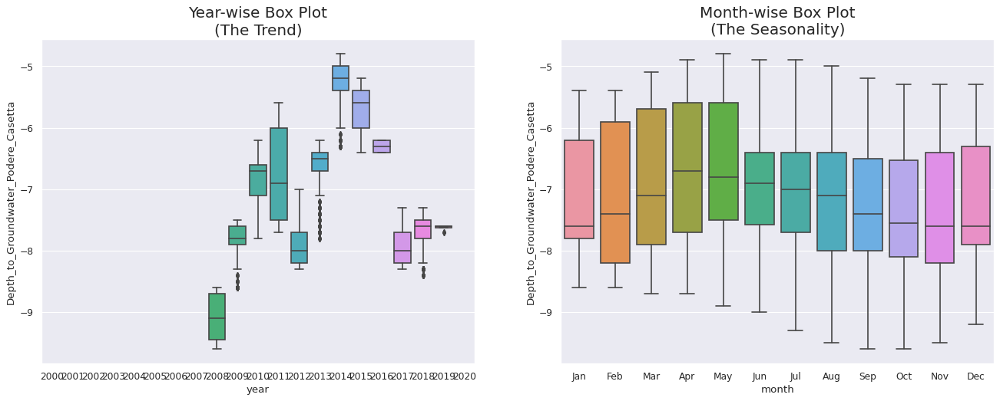

Index(['Date', 'Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano'],
      dtype='object')
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
0   2006-03-14
1   2006-03-15
2   2006-03-16
Name: Date, dtype: datetime64[ns]
5220   2020-06-28
5221   2020-06-29
5222   2020-06-30
Name: Date, dtype: datetime64[ns]
(5223, 8)


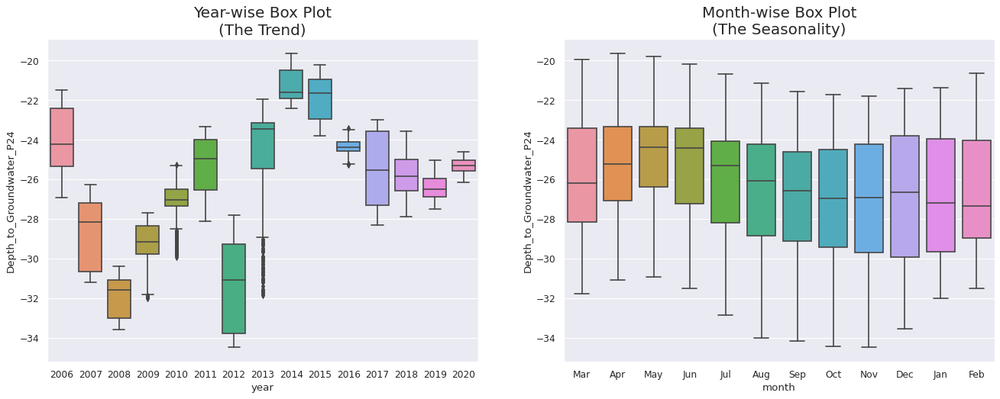

Index(['Date', 'Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate'],
      dtype='object')
['Lake_Level', 'Flow_Rate']
0   2002-06-03
1   2002-06-04
2   2002-06-05
Name: Date, dtype: datetime64[ns]
6600   2020-06-28
6601   2020-06-29
6602   2020-06-30
Name: Date, dtype: datetime64[ns]
(6603, 9)


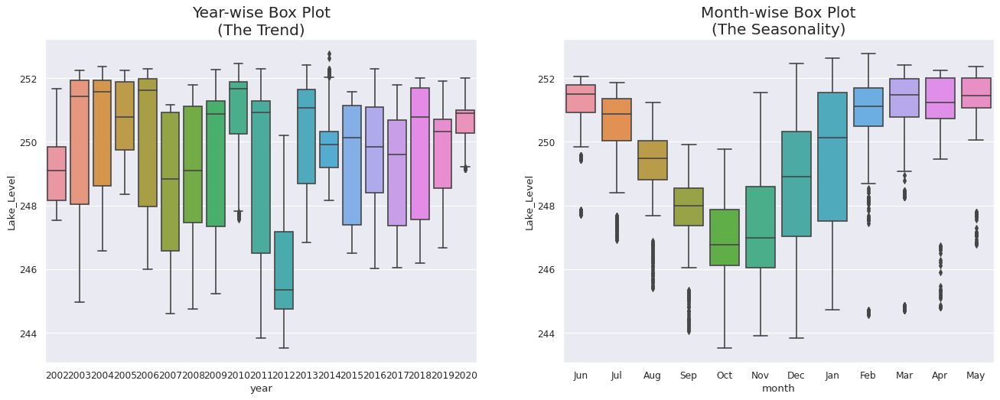

Index(['Date', 'Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano'],
      dtype='object')
['Hydrometry_Nave_di_Rosano']
0   1998-01-01
1   1998-01-02
2   1998-01-03
Name: Date, dtype: datetime64[ns]
8214   2020-06-28
8215   2020-06-29
8216   2020-06-30
Name: Date, dtype: datetime64[ns]
(8217, 17)


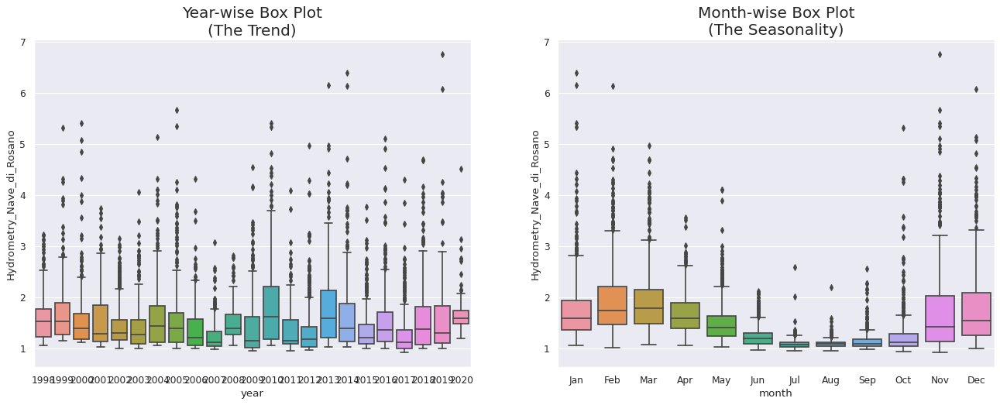

Index(['Date', 'Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta'],
      dtype='object')
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 16)


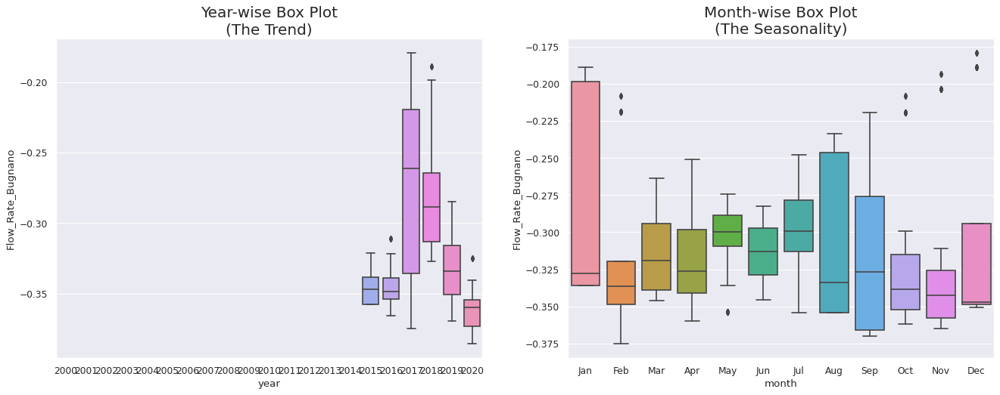

Index(['Date', 'Rainfall_Terni', 'Flow_Rate_Lupa'], dtype='object')
['Flow_Rate_Lupa']
0   2009-01-01
1   2009-01-02
2   2009-01-03
Name: Date, dtype: datetime64[ns]
4196   2020-06-28
4197   2020-06-29
4198   2020-06-30
Name: Date, dtype: datetime64[ns]
(4199, 3)


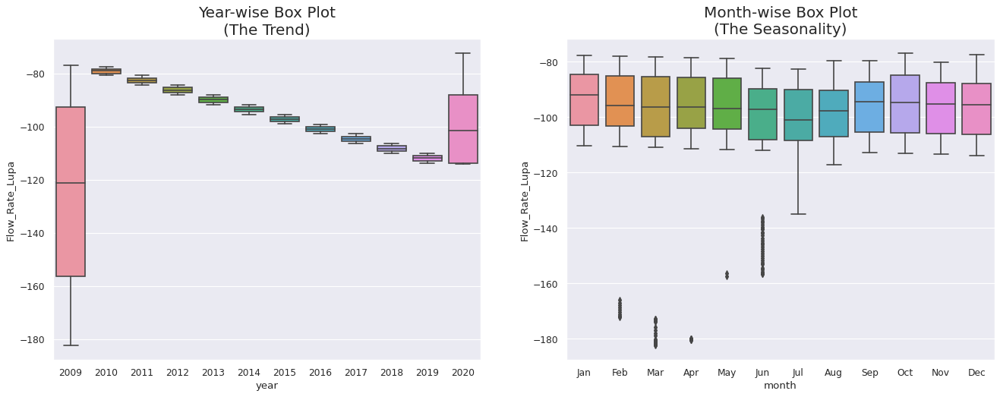

Index(['Date', 'Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto'],
      dtype='object')
['Flow_Rate_Madonna_di_Canneto']
0   2012-01-01
1   2012-01-02
2   2012-01-03
Name: Date, dtype: datetime64[ns]
3110   NaT
3111   NaT
3112   NaT
Name: Date, dtype: datetime64[ns]
(3113, 4)


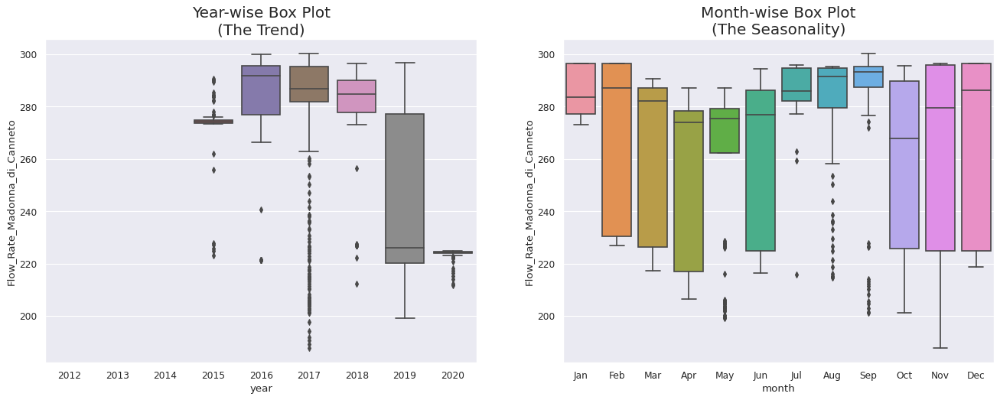

In [ ]:
def box_plot(acea_df,acea_df_target):
  acea_df.replace(0, np.nan, inplace=True)
  acea_df.dropna(subset=['Date'],inplace=True)
  acea_df['year'] = [d.year for d in acea_df.Date]
  acea_df['month'] = [d.strftime('%b') for d in acea_df.Date]
  years = acea_df['year'].unique()
  for target in acea_df_target:
    fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
    sns.boxplot(x='year', y=target, data=acea_df, ax=axes[0])
    sns.boxplot(x='month', y=target, data=acea_df.loc[~acea_df.year.isin([1998, 2020]), :])
    # Set Title
    axes[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize=18)
    plt.show()
    return acea_df

for i,(acea_df,acea_df_target) in enumerate(zip(all_data,all_data_target)):
    print(acea_df.columns)
    print(acea_df_target)
    print(acea_df.Date.head(3))
    print(acea_df.Date.tail(3))
    print(acea_df.shape)
    all_data[i] = box_plot(acea_df,acea_df_target)


In [ ]:
year_to_select =  [2006,2012,2008,2006,2002,1998,2015,2009,2015]

Index(['Date', 'Rainfall_Gallicano', 'Rainfall_Pontetetto',
       'Rainfall_Monte_Serra', 'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano',
       'Rainfall_Piaggione', 'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
0   1998-03-05
1   1998-03-06
2   1998-03-07
Name: Date, dtype: datetime64[ns]
8151   2020-06-28
8152   2020-06-29
8153   2020-06-30
Name: Date,

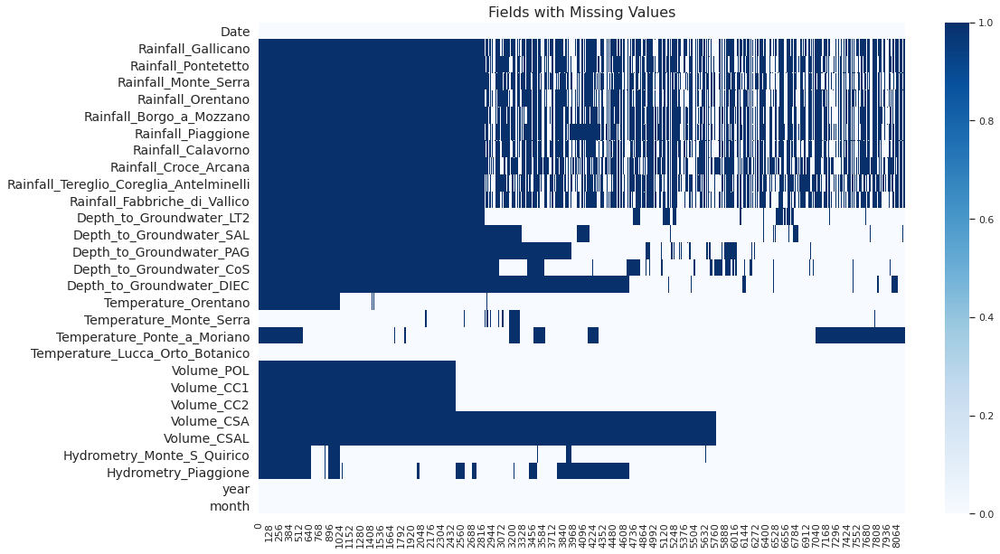

Index(['Date', 'Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
0   2004-01-01
1   2004-01-02
2   2004-01-03
Name: Date, dtype: dateti

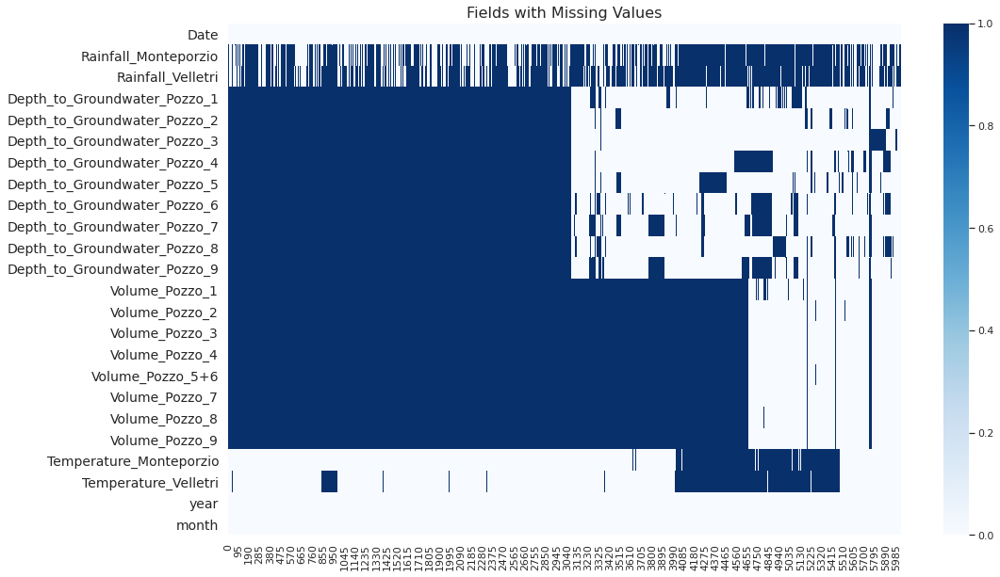

Index(['Date', 'Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_Podere_Casetta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 24)


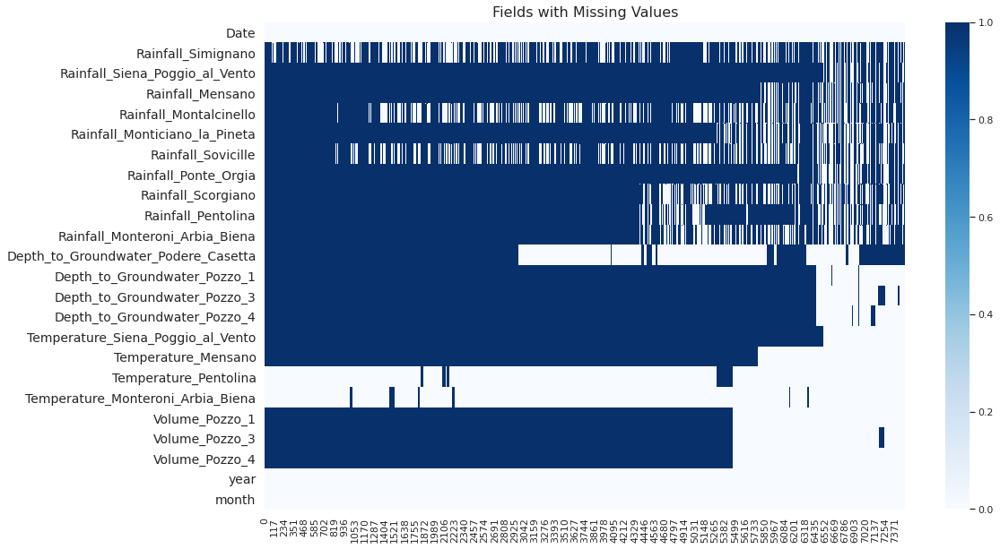

Index(['Date', 'Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
0   2006-03-14
1   2006-03-15
2   2006-03-16
Name: Date, dtype: datetime64[ns]
5220   2020-06-28
5221   2020-06-29
5222   2020-06-30
Name: Date, dtype: datetime64[ns]
(5223, 10)


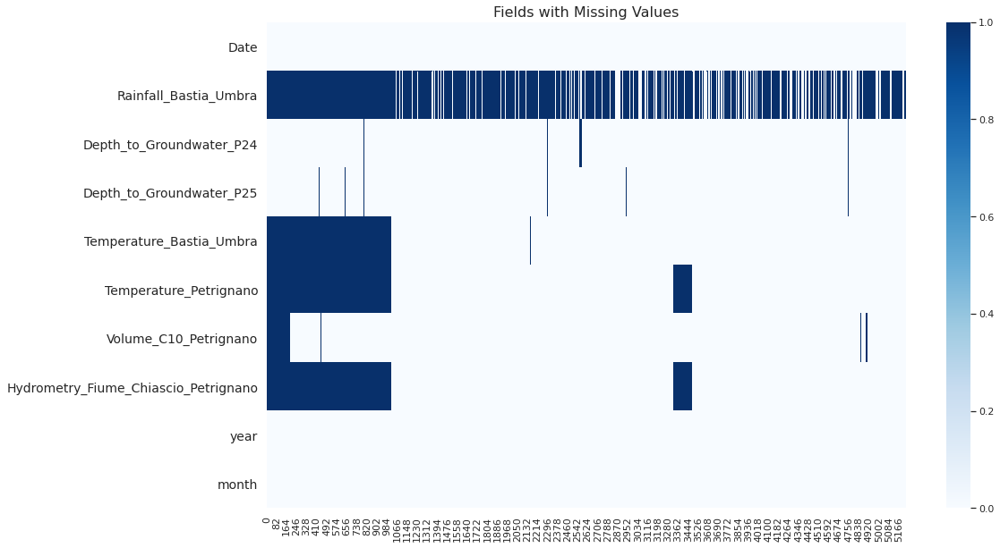

Index(['Date', 'Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate', 'year', 'month'],
      dtype='object')
['Lake_Level', 'Flow_Rate']
0   2002-06-03
1   2002-06-04
2   2002-06-05
Name: Date, dtype: datetime64[ns]
6600   2020-06-28
6601   2020-06-29
6602   2020-06-30
Name: Date, dtype: datetime64[ns]
(6603, 11)


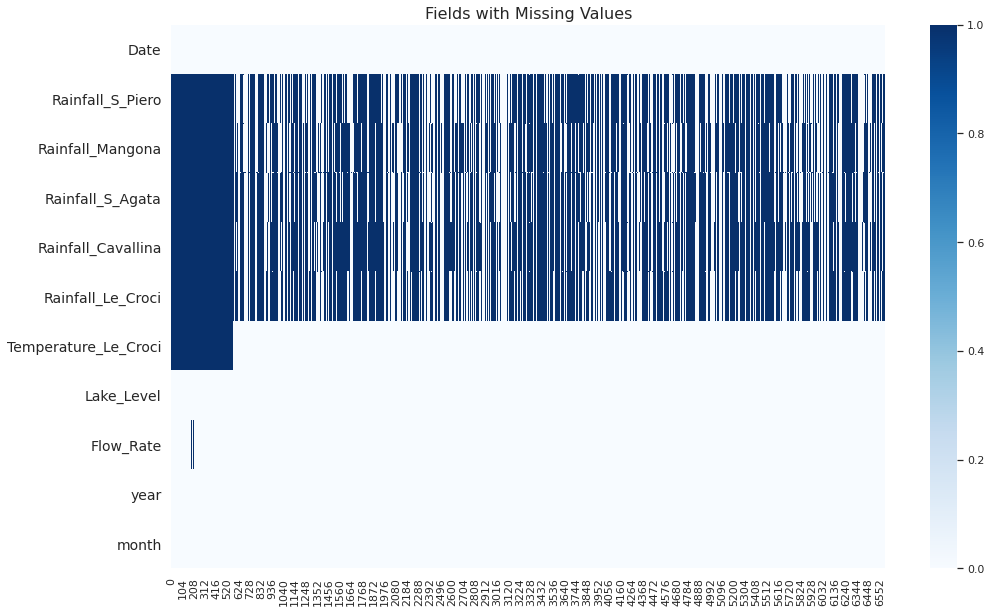

Index(['Date', 'Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano', 'year', 'month'],
      dtype='object')
['Hydrometry_Nave_di_Rosano']
0   1998-01-01
1   1998-01-02
2   1998-01-03
Name: Date, dtype: datetime64[ns]
8214   2020-06-28
8215   2020-06-29
8216   2020-06-30
Name: Date, dtype: datetime64[ns]
(8217, 19)


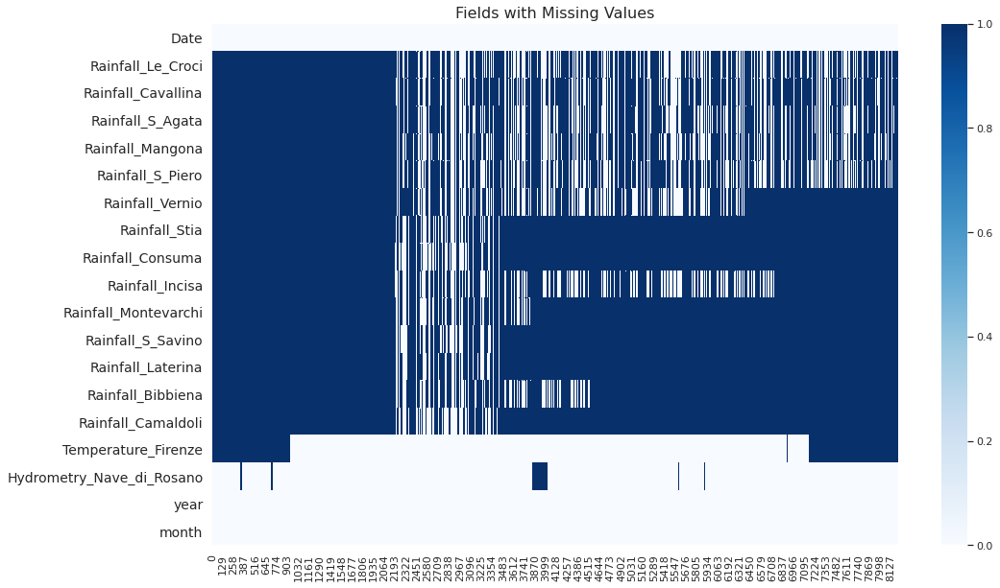

Index(['Date', 'Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta', 'year', 'month'],
      dtype='object')
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 18)


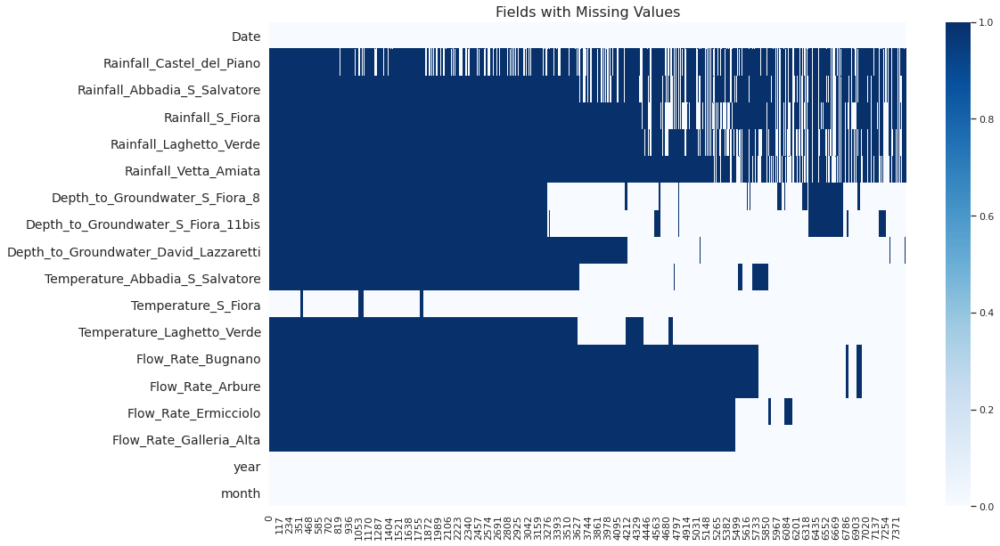

Index(['Date', 'Rainfall_Terni', 'Flow_Rate_Lupa', 'year', 'month'], dtype='object')
['Flow_Rate_Lupa']
0   2009-01-01
1   2009-01-02
2   2009-01-03
Name: Date, dtype: datetime64[ns]
4196   2020-06-28
4197   2020-06-29
4198   2020-06-30
Name: Date, dtype: datetime64[ns]
(4199, 5)


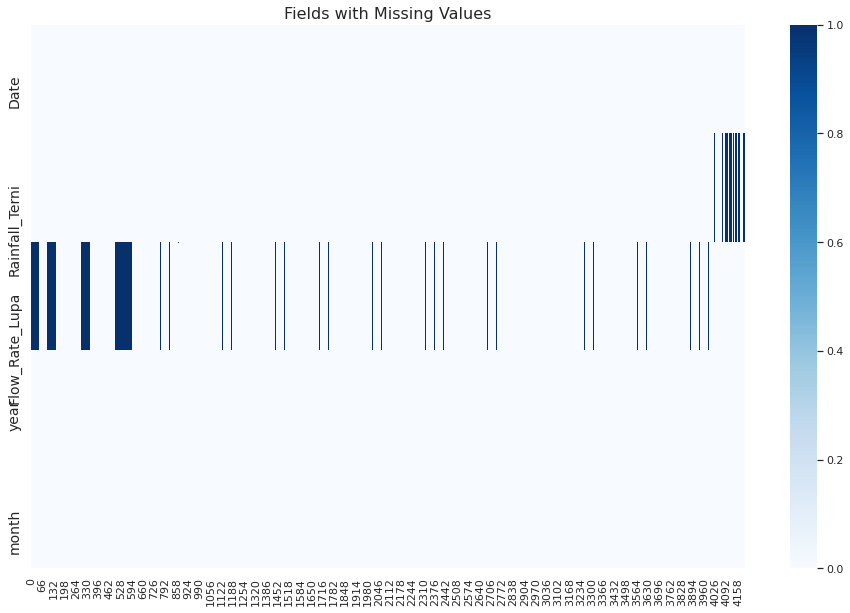

Index(['Date', 'Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto', 'year', 'month'],
      dtype='object')
['Flow_Rate_Madonna_di_Canneto']
0   2012-01-01
1   2012-01-02
2   2012-01-03
Name: Date, dtype: datetime64[ns]
3101   2020-06-28
3102   2020-06-29
3103   2020-06-30
Name: Date, dtype: datetime64[ns]
(3104, 6)


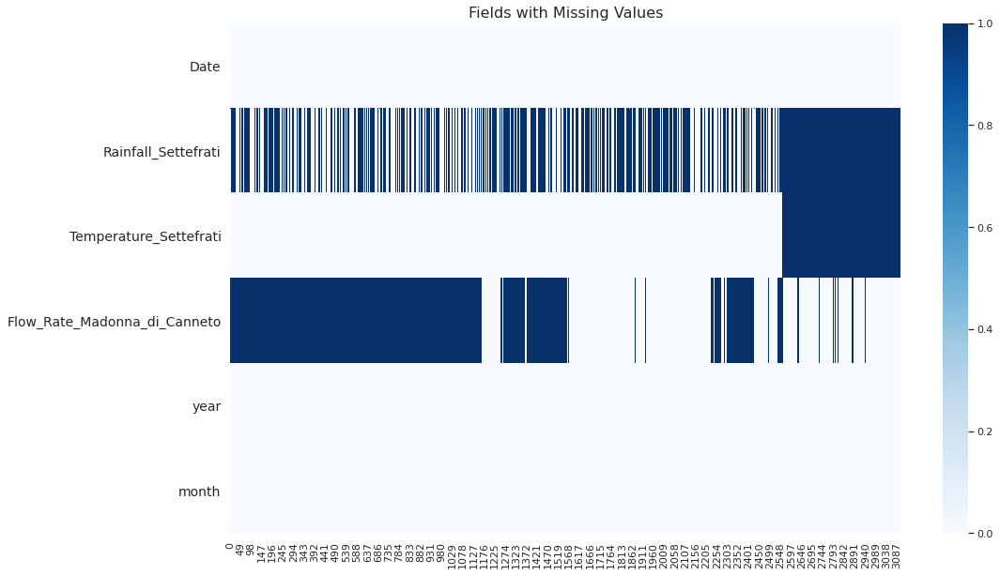

In [ ]:
def nagraph(acea_df):
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,10))
    sns.heatmap(acea_df.T.isna(), cmap='Blues')
    ax.set_title('Fields with Missing Values', fontsize=16)
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(14)
    plt.show()
    
for acea_df,acea_df_target in zip(all_data,all_data_target):
    print(acea_df.columns)
    print(acea_df_target)
    print(acea_df.Date.head(3))
    print(acea_df.Date.tail(3))
    print(acea_df.shape)
    nagraph(acea_df)

## Data Preprocessing

In [ ]:
all_data[1]

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri,year,month
0,2004-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.30,8.60,2004,Jan
1,2004-01-02,0.2,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.70,6.25,2004,Jan
2,2004-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.40,9.80,2004,Jan
3,2004-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.35,5.95,2004,Jan
4,2004-01-05,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,5.85,2004,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6021,2020-06-26,NaN,NaN,-50.32,-100.35,-100.880,-101.49,-104.31,-97.94,-96.59,-97.74,-90.62,1516.104,3883.932,2526.516,3867.876,7949.304,2684.412,3911.832,3450.132,21.05,23.39,2020,Jun
6022,2020-06-27,NaN,NaN,-50.32,-100.56,-100.840,-101.59,-104.30,-97.96,-96.44,-97.78,-90.54,1491.408,3884.724,2871.864,3867.300,7590.564,2681.280,3899.772,3449.088,22.18,24.44,2020,Jun
6023,2020-06-28,NaN,NaN,-50.32,-100.56,-100.920,-101.59,-104.30,-98.46,-96.44,-97.78,-90.54,1485.756,3885.228,2858.400,3869.352,7944.660,2962.980,3901.032,3449.808,23.06,25.43,2020,Jun
6024,2020-06-29,NaN,NaN,-50.32,-100.56,-101.190,-101.59,-104.30,-98.46,-96.10,-97.78,-90.83,1479.636,3888.684,2499.444,3873.096,7947.684,2653.884,3904.776,3129.336,22.03,24.22,2020,Jun


In [ ]:
def select_dates(acea_df,year):
    acea_df['year'] = pd.DatetimeIndex(acea_df['Date']).year 
    acea_df = acea_df[acea_df.year>year-1]
    print(acea_df.head())
    return acea_df

for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  all_data[i] = select_dates(acea_df,year)

           Date  Rainfall_Gallicano  ...  year  month
2859 2006-01-01                37.2  ...  2006    Jan
2860 2006-01-02                 3.2  ...  2006    Jan
2861 2006-01-03                 0.2  ...  2006    Jan
2862 2006-01-04                 NaN  ...  2006    Jan
2863 2006-01-05                 NaN  ...  2006    Jan

[5 rows x 29 columns]
           Date  Rainfall_Monteporzio  ...  year  month
2922 2012-01-01                   NaN  ...  2012    Jan
2923 2012-01-02                   1.8  ...  2012    Jan
2924 2012-01-03                  11.0  ...  2012    Jan
2925 2012-01-04                   1.0  ...  2012    Jan
2926 2012-01-05                   0.2  ...  2012    Jan

[5 rows x 24 columns]
           Date  Rainfall_Simignano  ...  year  month
2922 2008-01-01                 NaN  ...  2008    Jan
2923 2008-01-02                 NaN  ...  2008    Jan
2924 2008-01-03                 NaN  ...  2008    Jan
2925 2008-01-04                 4.0  ...  2008    Jan
2926 2008-01-05         

### Feature Selection

In [ ]:
!pip install shap

In [ ]:
def data_impute(acea_df):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_absolute_error
    import lightgbm as lgb


    features_to_fill = acea_df.columns[:-2]

    temp_df = acea_df[features_to_fill].copy()

    # Create time related features
    temp_df['year'] = pd.DatetimeIndex(temp_df['Date']).year 

    temp_df['month'] = pd.DatetimeIndex(temp_df['Date']).month 
    month_in_year = 12
    temp_df['month_sin'] = np.sin(2*np.pi*temp_df.month/month_in_year)
    temp_df['month_cos'] = np.cos(2*np.pi*temp_df.month/month_in_year)

    temp_df['season'] = temp_df.month%12 // 3 + 1

    temp_df['day_of_year'] = pd.DatetimeIndex(temp_df['Date']).dayofyear
    days_in_year = 365.25
    temp_df['day_of_year_sin'] = np.sin(2*np.pi*temp_df.day_of_year/days_in_year)
    temp_df['day_of_year_cos'] = np.cos(2*np.pi*temp_df.day_of_year/days_in_year)

    temp_df['week_of_year'] = pd.DatetimeIndex(temp_df['Date']).weekofyear
    weeks_in_year = 52.1429
    temp_df['week_of_year_sin'] = np.sin(2*np.pi*temp_df.week_of_year/weeks_in_year)
    temp_df['week_of_year_cos'] = np.cos(2*np.pi*temp_df.week_of_year/weeks_in_year)
    
    features = ['month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos', 'week_of_year_sin', 'week_of_year_cos', 'year', 'season']
    temp_df.drop(['month'],axis=1,inplace=True)
    for attribute in features_to_fill[1:]:
          target = attribute
          X = temp_df[temp_df[attribute].notna()][features]#.reset_index(drop=True)
          y = temp_df[temp_df[attribute].notna()][target]#.reset_index(drop=True)
          print(X.shape)
          print(y.shape)
          X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

          X_test = temp_df[features]#.reset_index(drop=True)
          # Model
          params = {'num_leaves': 32,
                    'objective': 'regression_l1',
                    'max_depth': 8,
                    'learning_rate': 0.05,
                    "metric": 'mae',
                    'seed' : 42
                  }

          dtrain = lgb.Dataset(X_train, y_train)
          dvalid = lgb.Dataset(X_valid, y_valid)

          clf = lgb.train(params, dtrain, 10000, valid_sets = [dtrain, dvalid], verbose_eval=False,  early_stopping_rounds=100)

          y_pred_valid = clf.predict(X_valid)
          
          old = temp_df[attribute].copy()
          y_pred = clf.predict(X_test)
          #replacing of actual null values here
          acea_df[attribute] = np.where(acea_df[attribute].isna(), y_pred, acea_df[attribute])

          f, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 3))

          sns.lineplot(x=acea_df.Date, y=acea_df[attribute], color='red',label='predicted')
          sns.lineplot(x=acea_df.Date, y=old.fillna(np.inf), color='blue', label = 'original')
          plt.show()
          """ax.set_title('Fill NaN by Prediction', fontsize=14)
          ax.set_ylabel(ylabel=attribute, fontsize=14)
          ax.set_xlim([date(1998, 1, 1), date(2020, 6, 30)])
          plt.show()"""
    try:
        acea_df.drop(['Date','month'],axis=1,inplace=True)
    except:
        acea_df.drop(['Date'],axis=1,inplace=True)
    return acea_df

# LSTM

# Models

In [ ]:
#!pip install tensorflow==2.2.1

In [ ]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import shap

2.2.1


In [ ]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

In [ ]:
def get_model(trainX):
        model = Sequential()
        model.add(LSTM(50, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2])))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

In [ ]:
def forecast(acea_df,acea_df_target):
    dataset = acea_df.copy()
    print(dataset.columns)
    values = dataset.values
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    print(scaler.min_[0],scaler.scale_[0])
    
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    cols_to_drop = [len(acea_df.columns) + acea_df.columns.get_loc(c) for c in acea_df if c not in acea_df_target]
    reframed.drop(reframed.columns[cols_to_drop], axis=1, inplace=True)
    print(reframed.columns)
    values = reframed.values

    train_size = int(len(values) * 0.7)
    test_size = len(values) - train_size

    train, test = values[0:train_size,:], values[train_size:len(values),:]
    scale = MinMaxScaler(feature_range=(0, 1))
    scale.min_,scale.scale_ = scaler.min_[0],scaler.scale_[0]

    for i in range(1,len(acea_df.columns)-len(cols_to_drop)+1):
        trainX, trainY = train[:, :len(acea_df.columns)], train[:, -i]
        testX, testY = test[:, :len(acea_df.columns)], test[:, -i]

        print(len(train), len(test))

        trainX = trainX.reshape((trainX.shape[0], 1, trainX.shape[1]))
        testX = testX.reshape((testX.shape[0], 1, testX.shape[1]))

        print(trainX.shape, trainY.shape, testX.shape, testY.shape)

        model = get_model(testX)
        grads = gradient_importance(trainX, model)
        print(grads)
        print('Mean:', np.mean(grads))
        print('Standard Deviation:', np.std(grads))
        plt.figure(figsize=(20,10))
        plt.bar(acea_df.columns,grads)
        plt.xticks(acea_df.columns, rotation=90)
        plt.show()
        #|
        idx = np.nonzero((grads > 0.02) | (grads < -0.02))
        print("Selected Features - " + str(idx))

        foo = trainX[:,:,idx]
        print("foo shape - "+ str(foo.shape))
        trainX = np.squeeze(foo, axis=(1,))
        print("Train reshape - " + str(trainX.shape))
        foo = testX[:,:,idx]
        print("foo shape - "+ str(foo.shape))
        testX = np.squeeze(foo, axis=(1,))
        print("Test reshape - " + str(testX.shape))  

        model = get_model(trainX)
        history = model.fit(trainX, trainY, epochs=100, validation_data=(testX, testY), verbose=2, shuffle=False)

        yhat = model.predict(testX)
        testX = testX.reshape((testX.shape[0], testX.shape[2]))
        print(testX.shape)

        inv_yhat = np.concatenate((yhat, testX[:, 1:]), axis=1)
        inv_yhat = scale.inverse_transform(inv_yhat)
        inv_yhat = inv_yhat[:,0]

        testY = testY.reshape((len(testY), 1))
        inv_y = np.concatenate((testY, testX[:, 1:]), axis=1)
        inv_y = scale.inverse_transform(inv_y)
        inv_y = inv_y[:,0]

        rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
        print('Test RMSE: %.3f' % rmse)
        plt.plot(inv_yhat)
        plt.plot(inv_y)
        plt.show()
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='test')
        plt.legend()
        plt.show()

In [ ]:
for acea_df,acea_df_target in zip(all_data,all_data_target):
    print(acea_df_target)

['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
['Depth_to_Groundwater_Podere_Casetta']
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
['Lake_Level', 'Flow_Rate']
['Hydrometry_Nave_di_Rosano']
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
['Flow_Rate_Lupa']
['Flow_Rate_Madonna_di_Canneto']


In [ ]:
def gradient_importance(seq, model):
    seq = tf.Variable(seq, dtype=tf.float32)
    with tf.GradientTape() as tape:
        predictions = model(seq)
    grads = tape.gradient(predictions, seq)
    grads = tf.reduce_mean(grads, axis=1).numpy()[0]
    return grads

In [ ]:
!pip install matplotlib

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


(4096, 8)
(4096,)


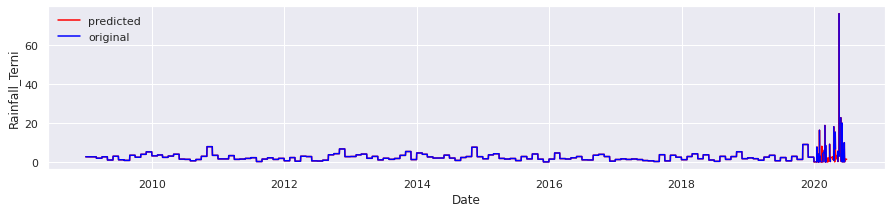

(3816, 8)
(3816,)


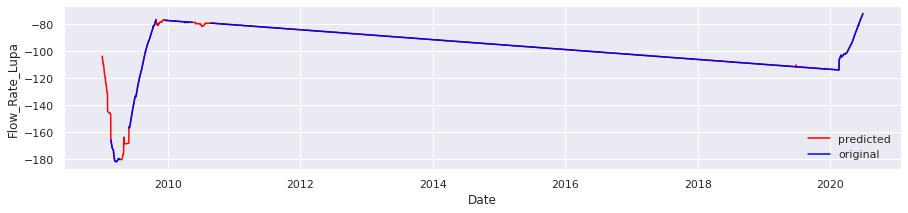

Index(['Rainfall_Terni', 'Flow_Rate_Lupa', 'year'], dtype='object')
-0.0024269284 0.013189828
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var2(t)'], dtype='object')
2938 1260
(2938, 1, 3) (2938,) (1260, 1, 3) (1260,)
[-0.04109783  0.00437759  0.04632896]
Mean: 0.0032029052
Standard Deviation: 0.035701502


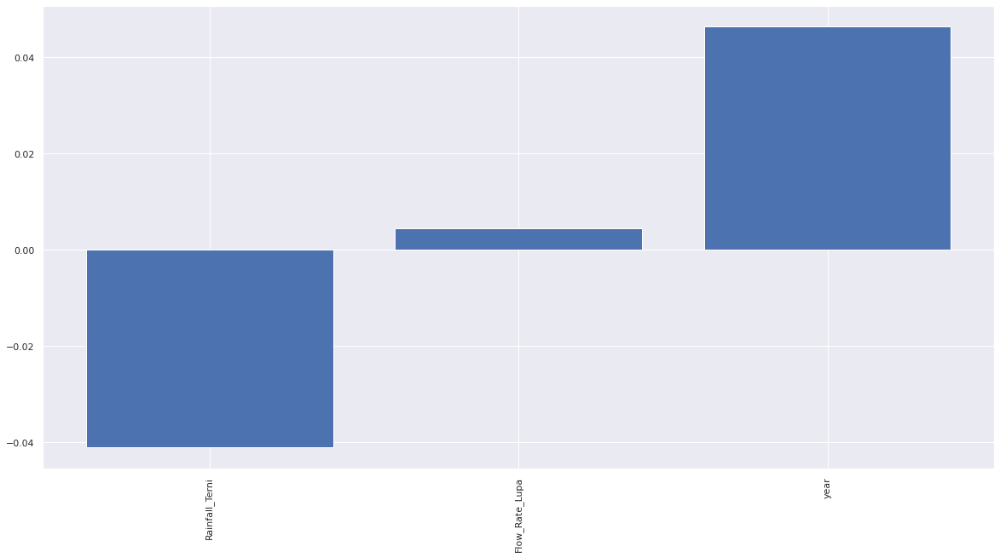

Selected Features - (array([0, 2]),)
foo shape - (2938, 1, 1, 2)
Train reshape - (2938, 1, 2)
foo shape - (1260, 1, 1, 2)
Test reshape - (1260, 1, 2)
Epoch 1/100
92/92 - 0s - loss: 0.4266 - val_loss: 0.0190
Epoch 2/100
92/92 - 0s - loss: 0.1128 - val_loss: 0.0959
Epoch 3/100
92/92 - 0s - loss: 0.0557 - val_loss: 0.0859
Epoch 4/100
92/92 - 0s - loss: 0.0498 - val_loss: 0.0672
Epoch 5/100
92/92 - 0s - loss: 0.0447 - val_loss: 0.0515
Epoch 6/100
92/92 - 0s - loss: 0.0411 - val_loss: 0.0402
Epoch 7/100
92/92 - 0s - loss: 0.0383 - val_loss: 0.0306
Epoch 8/100
92/92 - 0s - loss: 0.0364 - val_loss: 0.0232
Epoch 9/100
92/92 - 0s - loss: 0.0352 - val_loss: 0.0173
Epoch 10/100
92/92 - 0s - loss: 0.0345 - val_loss: 0.0129
Epoch 11/100
92/92 - 0s - loss: 0.0340 - val_loss: 0.0098
Epoch 12/100
92/92 - 0s - loss: 0.0337 - val_loss: 0.0076
Epoch 13/100
92/92 - 0s - loss: 0.0335 - val_loss: 0.0060
Epoch 14/100
92/92 - 0s - loss: 0.0334 - val_loss: 0.0051
Epoch 15/100
92/92 - 0s - loss: 0.0332 - val_lo

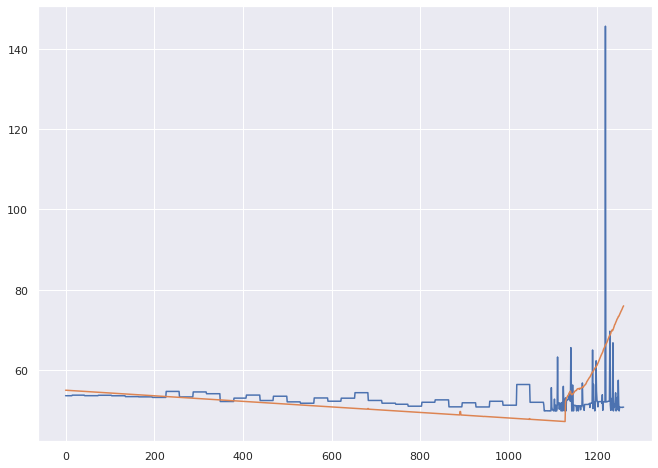

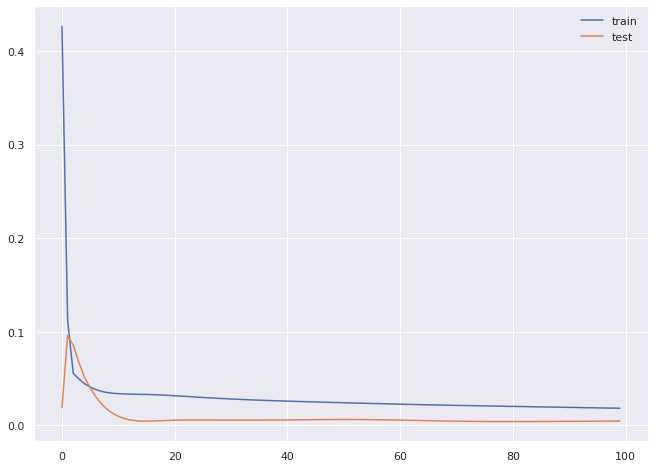

In [ ]:
acea_df = data_impute(Water_Spring_Lupa)
forecast(acea_df,Water_Spring_Lupa_target)

Dataset for imputation -            Date  Rainfall_Gallicano  ...  year  month
2859 2006-01-01                37.2  ...  2006    Jan
2860 2006-01-02                 3.2  ...  2006    Jan
2861 2006-01-03                 0.2  ...  2006    Jan
2862 2006-01-04                 NaN  ...  2006    Jan
2863 2006-01-05                 NaN  ...  2006    Jan
...         ...                 ...  ...   ...    ...
8149 2020-06-26                 NaN  ...  2020    Jun
8150 2020-06-27                 NaN  ...  2020    Jun
8151 2020-06-28                 NaN  ...  2020    Jun
8152 2020-06-29                 NaN  ...  2020    Jun
8153 2020-06-30                 NaN  ...  2020    Jun

[5295 rows x 29 columns]
(2085, 8)
(2085,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


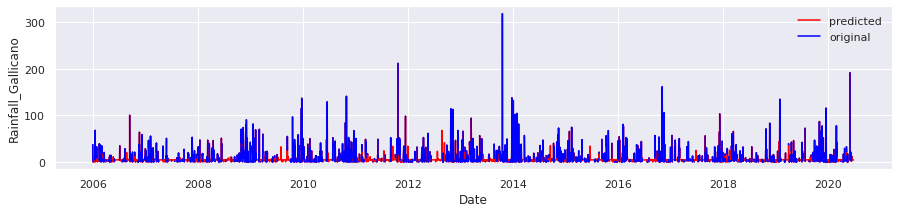

(1945, 8)
(1945,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


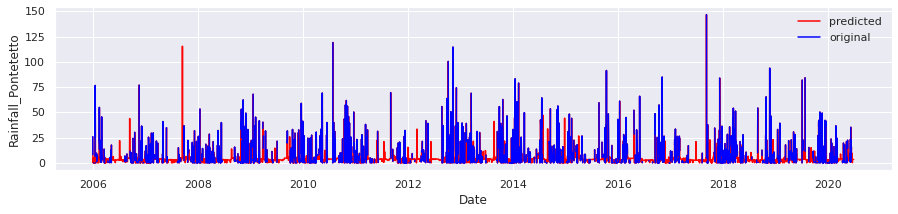

(2143, 8)
(2143,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


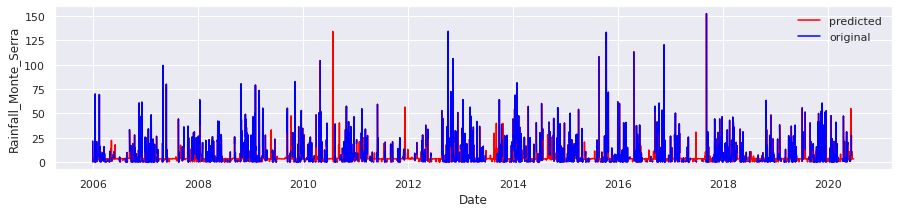

(2108, 8)
(2108,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


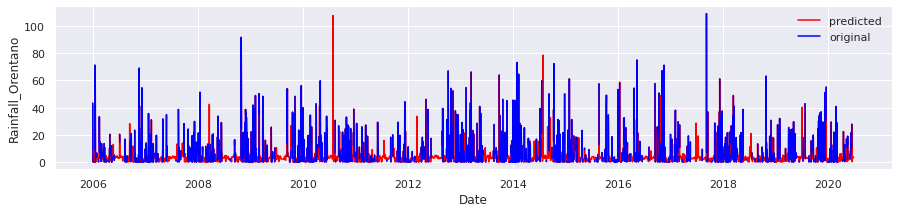

(2002, 8)
(2002,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


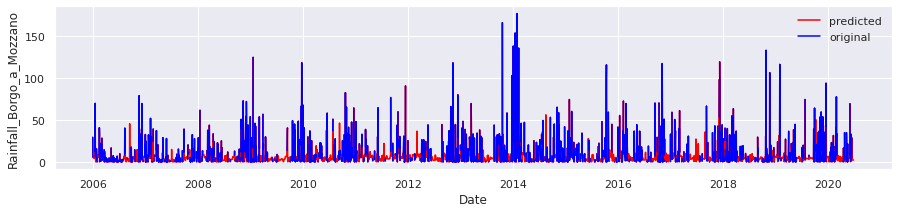

(1726, 8)
(1726,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


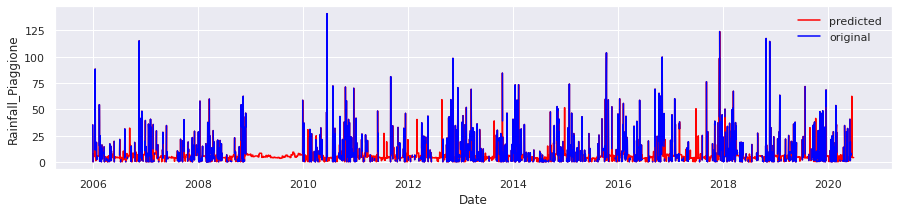

(2204, 8)
(2204,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


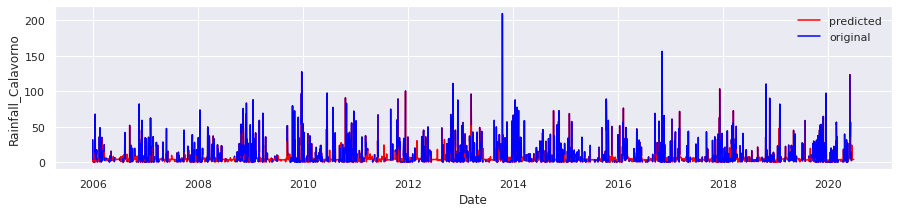

(2061, 8)
(2061,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


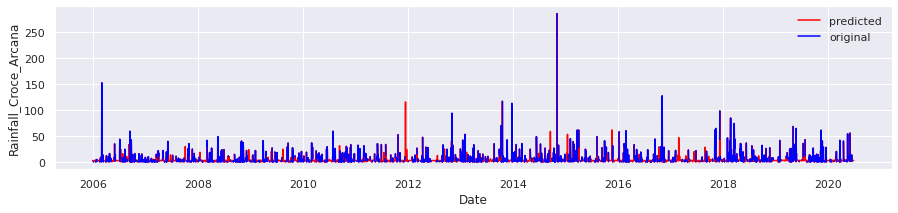

(2154, 8)
(2154,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


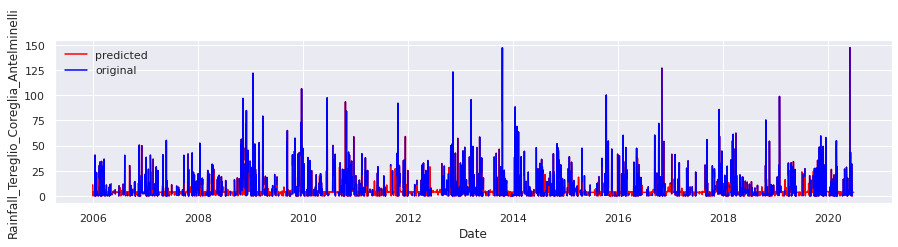

(2269, 8)
(2269,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


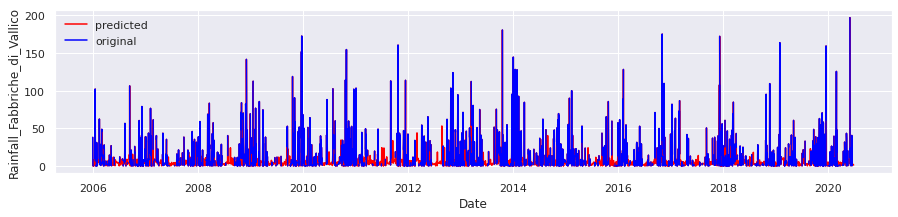

(4800, 8)
(4800,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


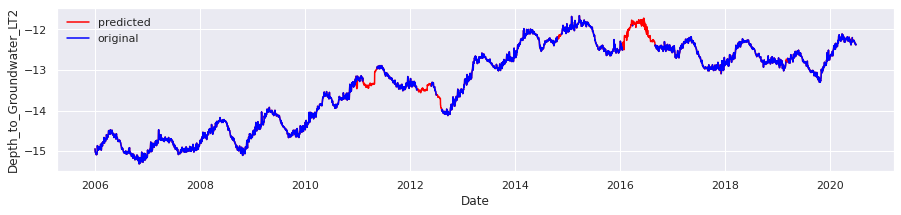

(4535, 8)
(4535,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


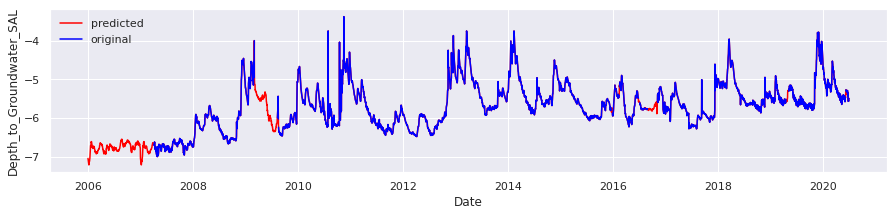

(3807, 8)
(3807,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


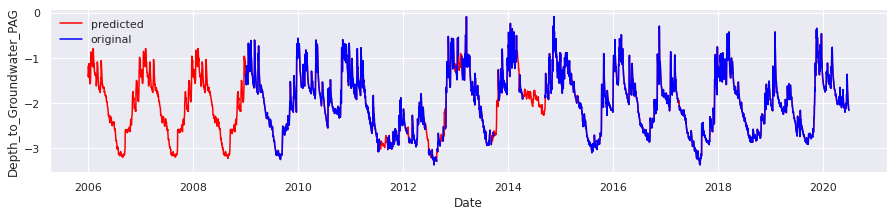

(4311, 8)
(4311,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


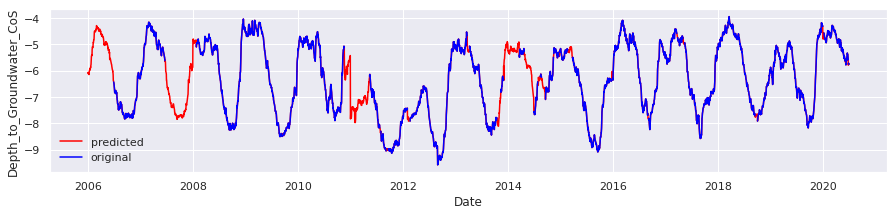

(3270, 8)
(3270,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


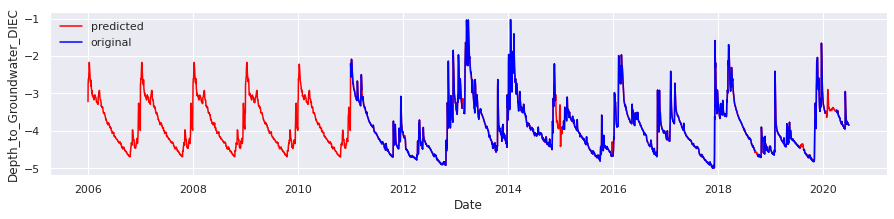

(5294, 8)
(5294,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


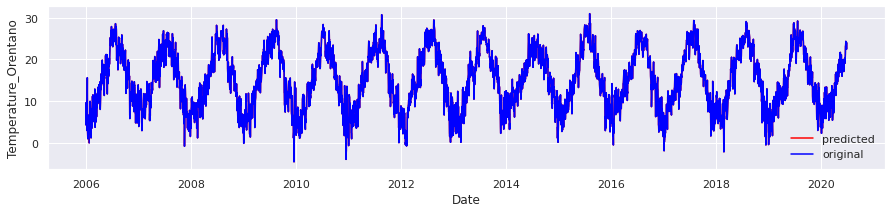

(5059, 8)
(5059,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


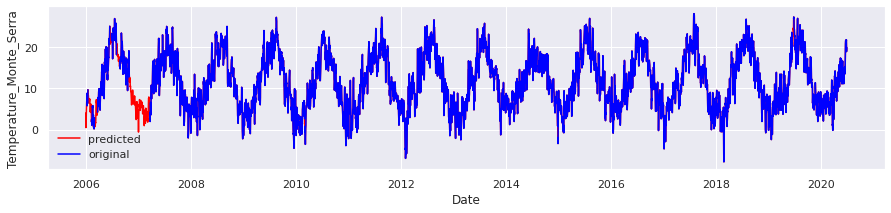

(3756, 8)
(3756,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


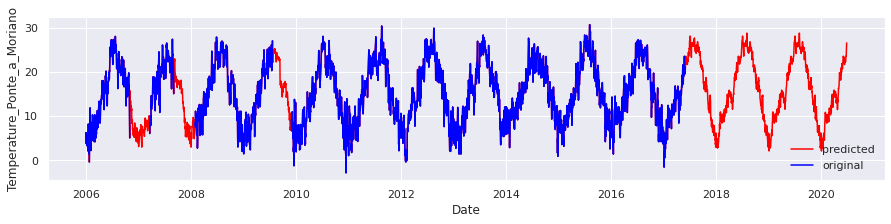

(5294, 8)
(5294,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


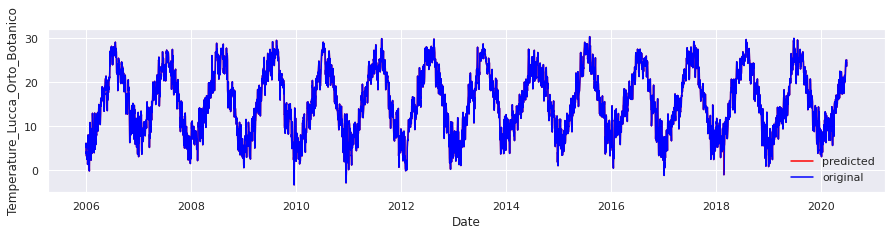

(5295, 8)
(5295,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


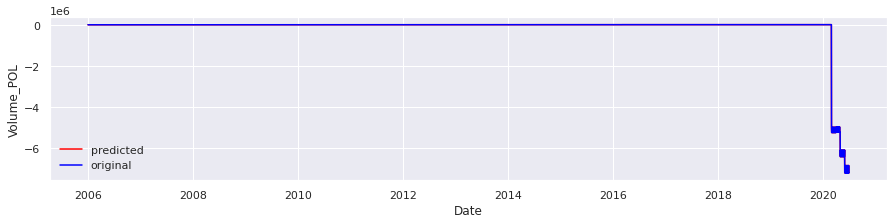

(5295, 8)
(5295,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


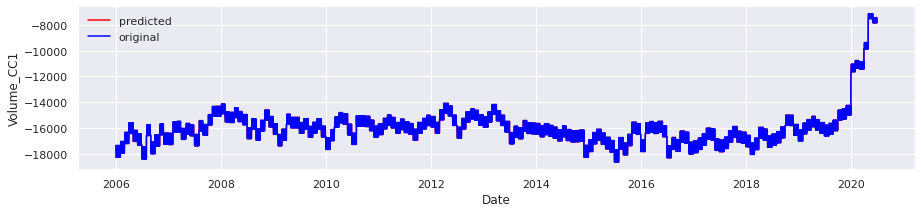

(5295, 8)
(5295,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


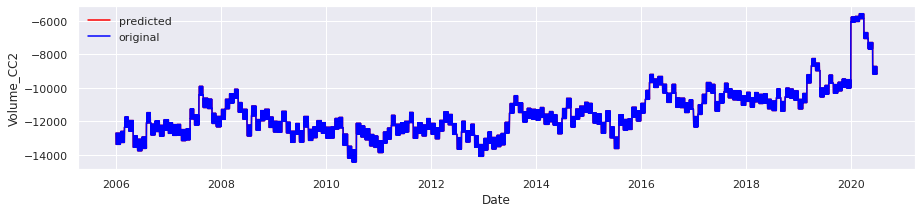

(2373, 8)
(2373,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


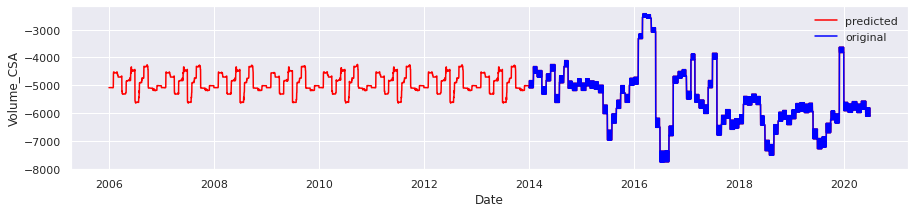

(2373, 8)
(2373,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


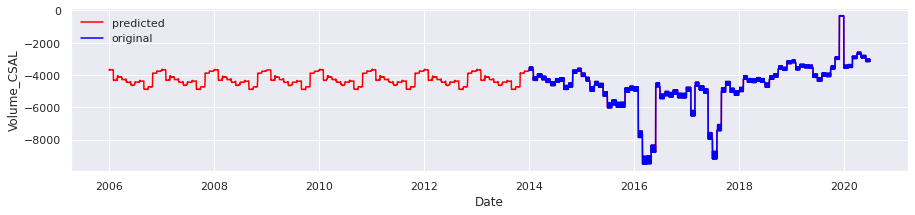

(5203, 8)
(5203,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


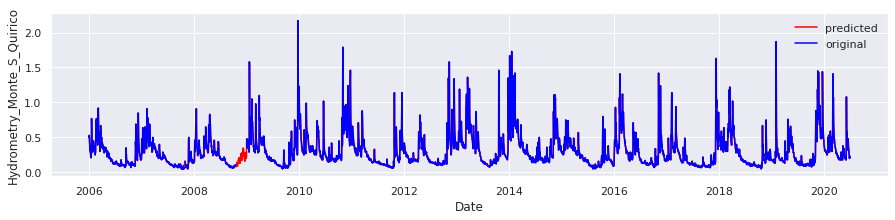

(4249, 8)
(4249,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


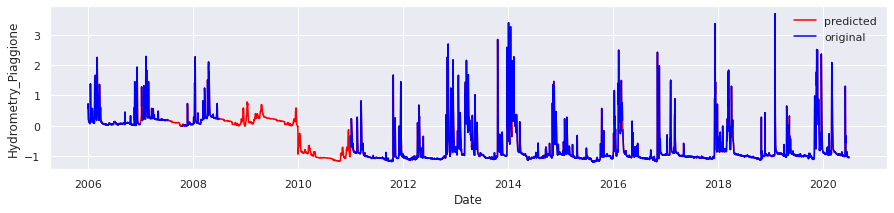


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Index(['Rainfall_Gallicano', 'Rainfall_Pontetetto', 'Rainfall_Monte_Serra',
       'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano', 'Rainfall_Piaggione',
       'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione', 'year'],
      dtype='object')
-0.00062774646 0.0031387322
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-

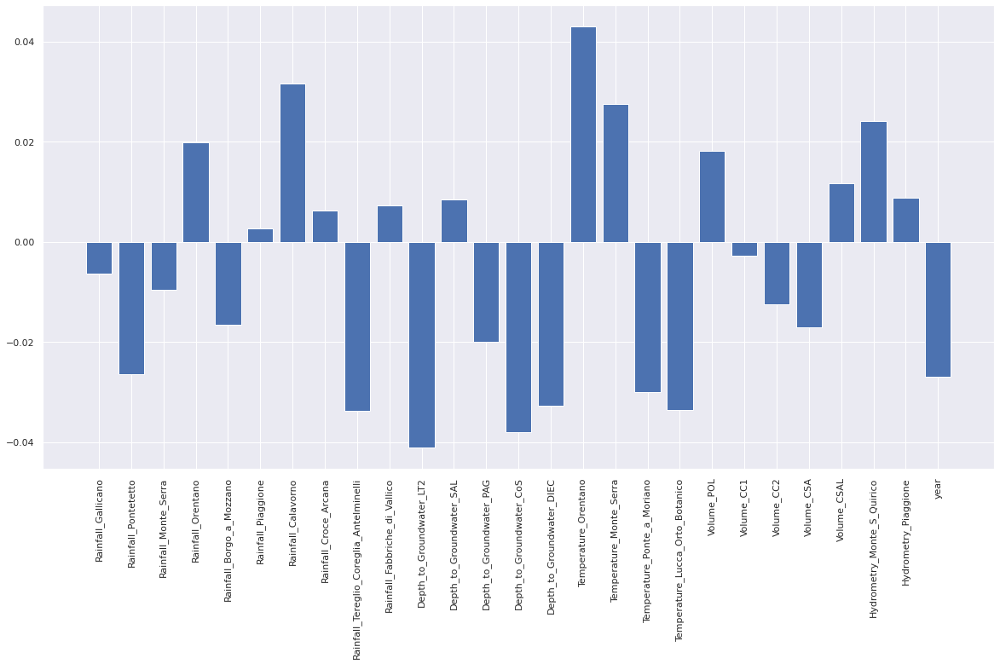

Selected Features - (array([ 1,  6,  8, 10, 12, 13, 14, 15, 16, 17, 18, 24, 26]),)
foo shape - (3705, 1, 1, 13)
Train reshape - (3705, 1, 13)
foo shape - (1589, 1, 1, 13)
Test reshape - (1589, 1, 13)
Epoch 1/100
116/116 - 0s - loss: 0.1472 - val_loss: 0.0373
Epoch 2/100
116/116 - 0s - loss: 0.0292 - val_loss: 0.0153
Epoch 3/100
116/116 - 0s - loss: 0.0129 - val_loss: 0.0113
Epoch 4/100
116/116 - 0s - loss: 0.0086 - val_loss: 0.0100
Epoch 5/100
116/116 - 0s - loss: 0.0066 - val_loss: 0.0086
Epoch 6/100
116/116 - 0s - loss: 0.0053 - val_loss: 0.0074
Epoch 7/100
116/116 - 0s - loss: 0.0042 - val_loss: 0.0060
Epoch 8/100
116/116 - 0s - loss: 0.0034 - val_loss: 0.0048
Epoch 9/100
116/116 - 0s - loss: 0.0027 - val_loss: 0.0037
Epoch 10/100
116/116 - 0s - loss: 0.0021 - val_loss: 0.0030
Epoch 11/100
116/116 - 0s - loss: 0.0016 - val_loss: 0.0025
Epoch 12/100
116/116 - 0s - loss: 0.0012 - val_loss: 0.0020
Epoch 13/100
116/116 - 0s - loss: 9.5293e-04 - val_loss: 0.0016
Epoch 14/100
116/116 - 0s

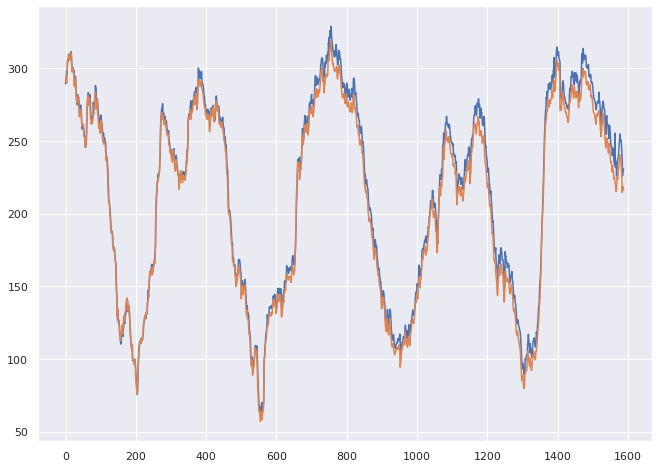

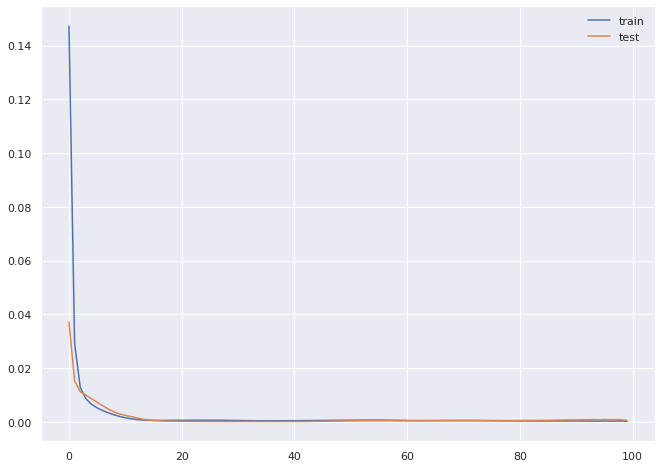

3705 1589
(3705, 1, 27) (3705,) (1589, 1, 27) (1589,)
[ 2.0245662e-02 -3.1618311e-03 -1.0741306e-03  7.4989041e-03
  4.2123753e-03 -3.4396641e-02 -1.6093198e-05 -5.2406383e-03
  1.5870197e-02  1.3651264e-02 -8.3007077e-03  3.0254105e-03
  5.7450653e-04  9.3263090e-03  2.8901055e-02 -6.0303193e-03
 -1.3356994e-02  1.5357193e-02 -4.1173924e-02 -2.3503728e-02
  2.1922356e-02  1.7447360e-02  6.4546318e-04  2.1564087e-02
  1.8532911e-02  6.3429512e-02  1.4628840e-02]
Mean: 0.0052066077
Standard Deviation: 0.020131111


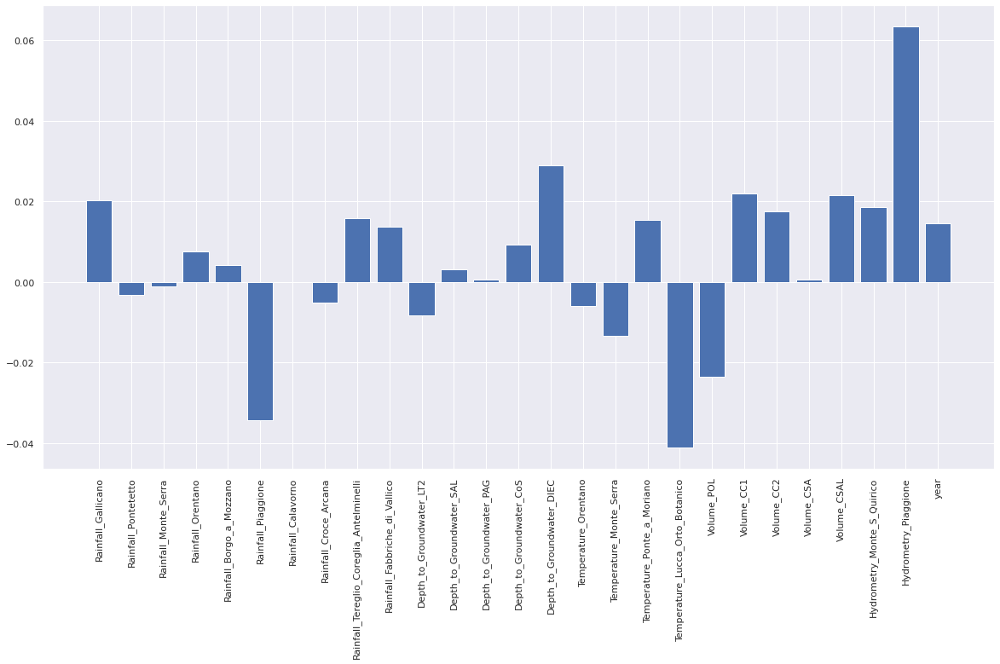

Selected Features - (array([ 0,  5, 14, 18, 19, 20, 23, 25]),)
foo shape - (3705, 1, 1, 8)
Train reshape - (3705, 1, 8)
foo shape - (1589, 1, 1, 8)
Test reshape - (1589, 1, 8)
Epoch 1/100
116/116 - 0s - loss: 0.0201 - val_loss: 0.0081
Epoch 2/100
116/116 - 0s - loss: 0.0341 - val_loss: 0.0069
Epoch 3/100
116/116 - 0s - loss: 0.0331 - val_loss: 0.0062
Epoch 4/100
116/116 - 0s - loss: 0.0321 - val_loss: 0.0058
Epoch 5/100
116/116 - 0s - loss: 0.0314 - val_loss: 0.0054
Epoch 6/100
116/116 - 0s - loss: 0.0307 - val_loss: 0.0052
Epoch 7/100
116/116 - 0s - loss: 0.0301 - val_loss: 0.0051
Epoch 8/100
116/116 - 0s - loss: 0.0296 - val_loss: 0.0051
Epoch 9/100
116/116 - 0s - loss: 0.0291 - val_loss: 0.0050
Epoch 10/100
116/116 - 0s - loss: 0.0287 - val_loss: 0.0051
Epoch 11/100
116/116 - 0s - loss: 0.0283 - val_loss: 0.0051
Epoch 12/100
116/116 - 0s - loss: 0.0279 - val_loss: 0.0052
Epoch 13/100
116/116 - 0s - loss: 0.0275 - val_loss: 0.0053
Epoch 14/100
116/116 - 0s - loss: 0.0272 - val_loss: 

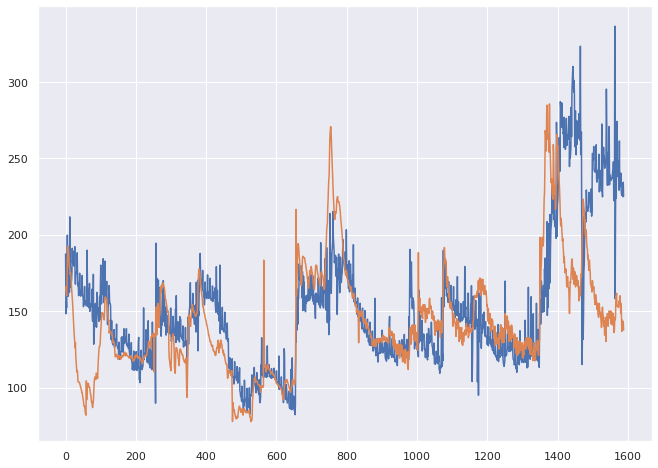

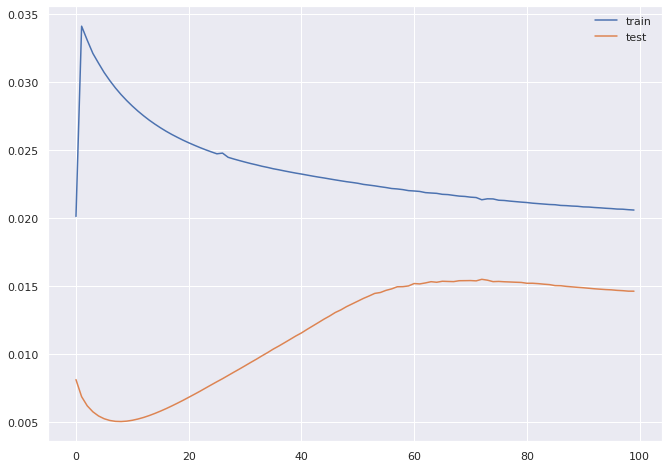

3705 1589
(3705, 1, 27) (3705,) (1589, 1, 27) (1589,)
[-0.01006497 -0.01263908  0.0132372  -0.00615168  0.01213215 -0.00307453
  0.01745383  0.0130895   0.03721604  0.00672325  0.02273286 -0.00839743
  0.00733534  0.005472   -0.01394249  0.02303851  0.02456314 -0.00168539
 -0.00330655 -0.01365052  0.00791146 -0.01154349  0.03506414 -0.00721876
 -0.00165985  0.01027355 -0.02139936]
Mean: 0.004500329
Standard Deviation: 0.015194408


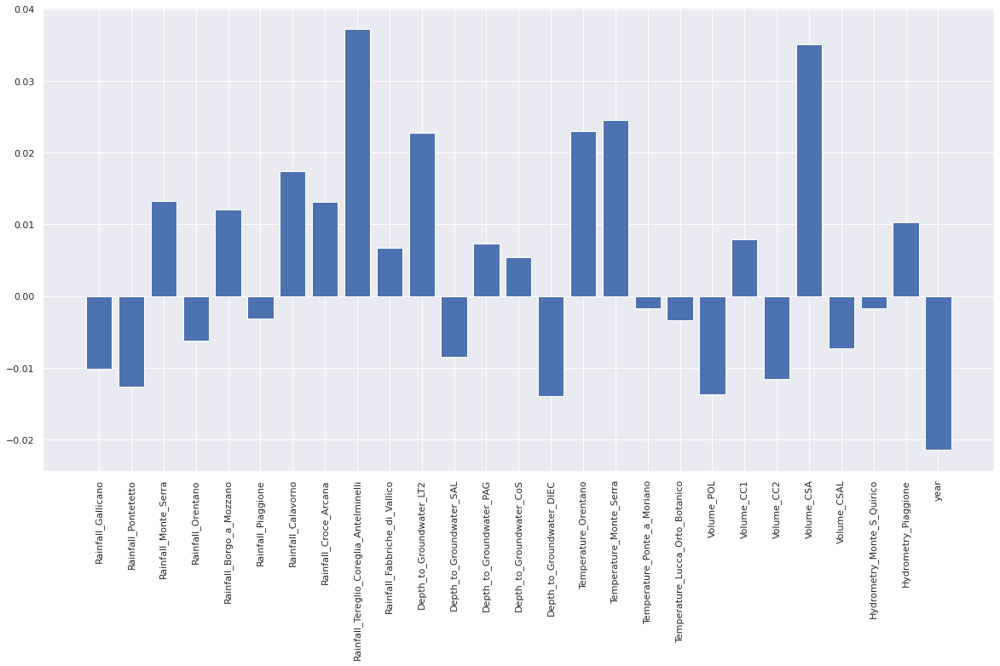

Selected Features - (array([ 8, 10, 15, 16, 22, 26]),)
foo shape - (3705, 1, 1, 6)
Train reshape - (3705, 1, 6)
foo shape - (1589, 1, 1, 6)
Test reshape - (1589, 1, 6)
Epoch 1/100
116/116 - 0s - loss: 0.0146 - val_loss: 0.0309
Epoch 2/100
116/116 - 0s - loss: 0.0299 - val_loss: 0.0303
Epoch 3/100
116/116 - 0s - loss: 0.0156 - val_loss: 0.0300
Epoch 4/100
116/116 - 0s - loss: 0.0075 - val_loss: 0.0291
Epoch 5/100
116/116 - 0s - loss: 0.0040 - val_loss: 0.0271
Epoch 6/100
116/116 - 0s - loss: 0.0028 - val_loss: 0.0245
Epoch 7/100
116/116 - 0s - loss: 0.0024 - val_loss: 0.0221
Epoch 8/100
116/116 - 0s - loss: 0.0022 - val_loss: 0.0199
Epoch 9/100
116/116 - 0s - loss: 0.0021 - val_loss: 0.0179
Epoch 10/100
116/116 - 0s - loss: 0.0020 - val_loss: 0.0160
Epoch 11/100
116/116 - 0s - loss: 0.0019 - val_loss: 0.0143
Epoch 12/100
116/116 - 0s - loss: 0.0018 - val_loss: 0.0128
Epoch 13/100
116/116 - 0s - loss: 0.0017 - val_loss: 0.0113
Epoch 14/100
116/116 - 0s - loss: 0.0016 - val_loss: 0.0101
E

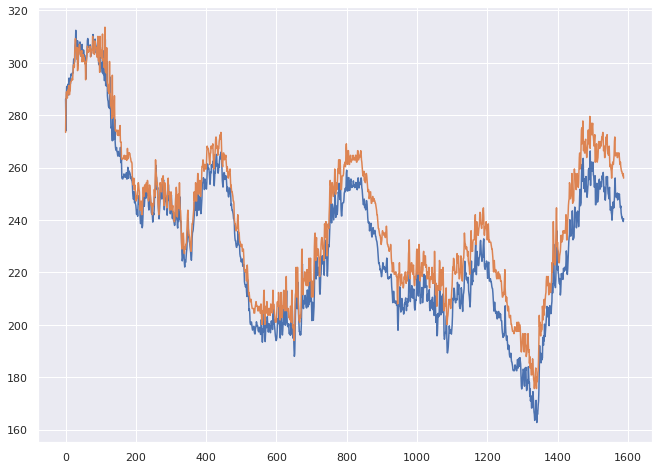

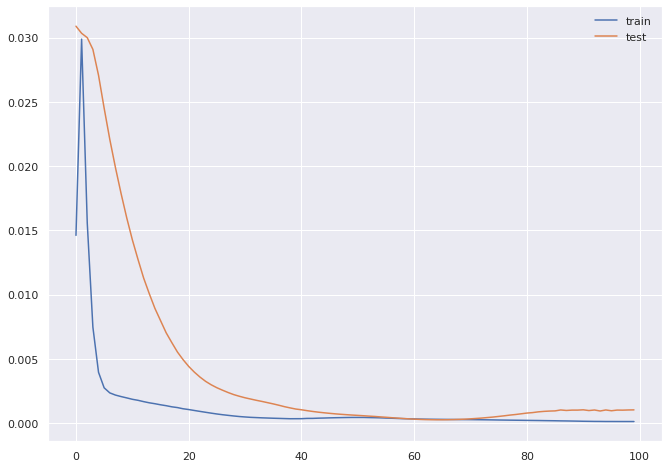

Dataset for imputation -            Date  Rainfall_Monteporzio  ...  year  month
2922 2012-01-01                   NaN  ...  2012    Jan
2923 2012-01-02                   1.8  ...  2012    Jan
2924 2012-01-03                  11.0  ...  2012    Jan
2925 2012-01-04                   1.0  ...  2012    Jan
2926 2012-01-05                   0.2  ...  2012    Jan
...         ...                   ...  ...   ...    ...
6021 2020-06-26                   NaN  ...  2020    Jun
6022 2020-06-27                   NaN  ...  2020    Jun
6023 2020-06-28                   NaN  ...  2020    Jun
6024 2020-06-29                   NaN  ...  2020    Jun
6025 2020-06-30                   NaN  ...  2020    Jun

[3104 rows x 24 columns]
(869, 8)
(869,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


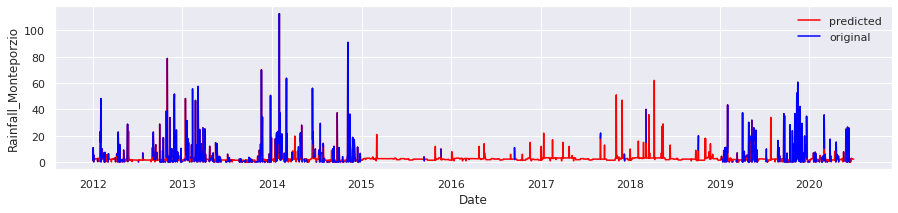

(707, 8)
(707,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


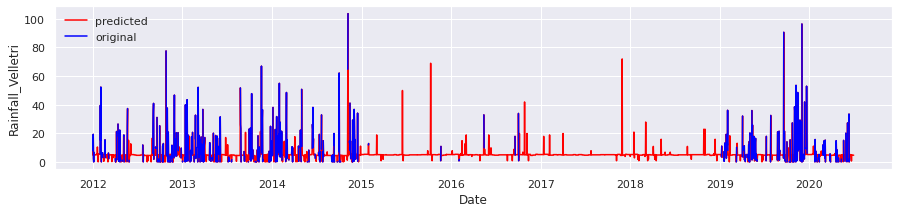

(2537, 8)
(2537,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


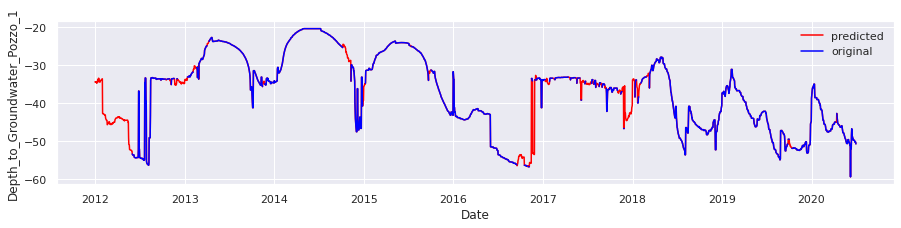

(2736, 8)
(2736,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


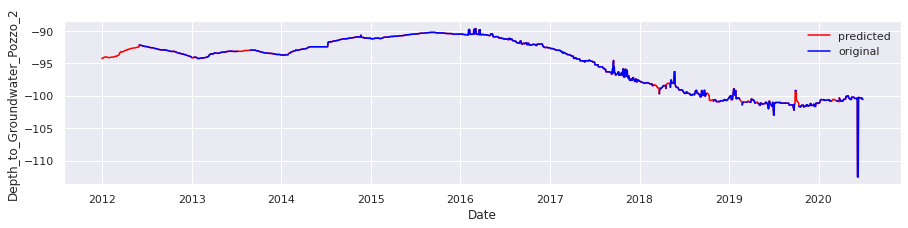

(2774, 8)
(2774,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


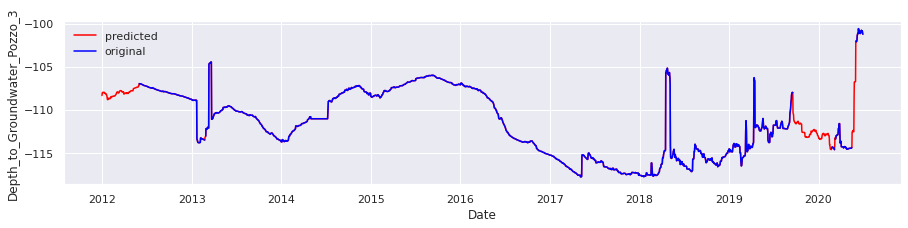

(2374, 8)
(2374,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


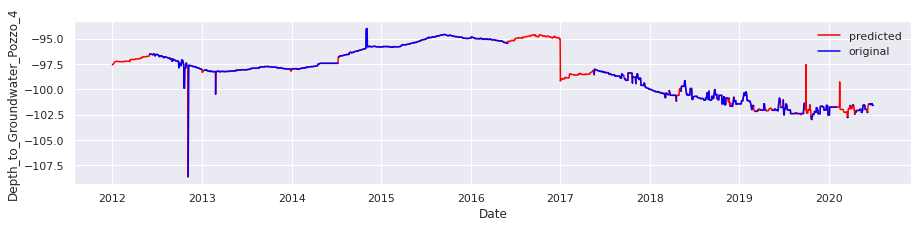

(2508, 8)
(2508,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


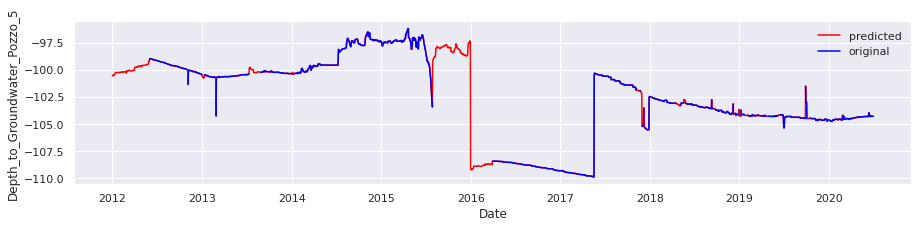

(2428, 8)
(2428,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


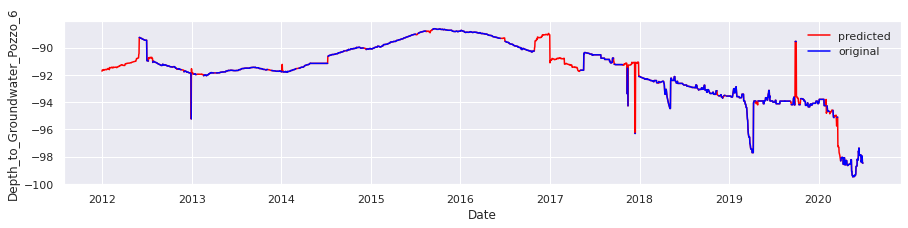

(2311, 8)
(2311,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


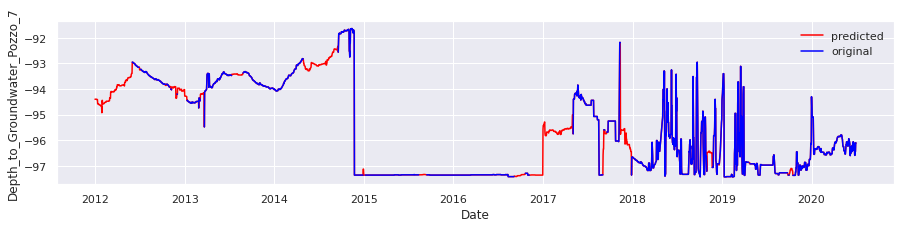

(2551, 8)
(2551,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


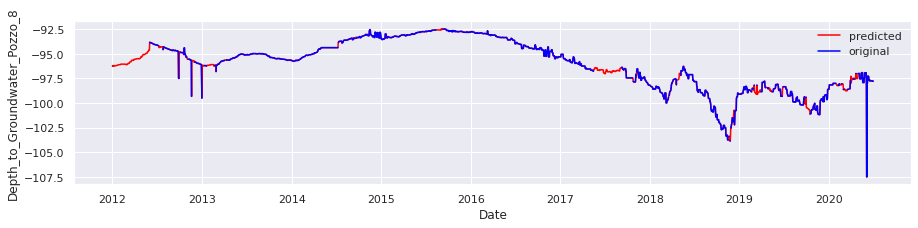

(2339, 8)
(2339,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


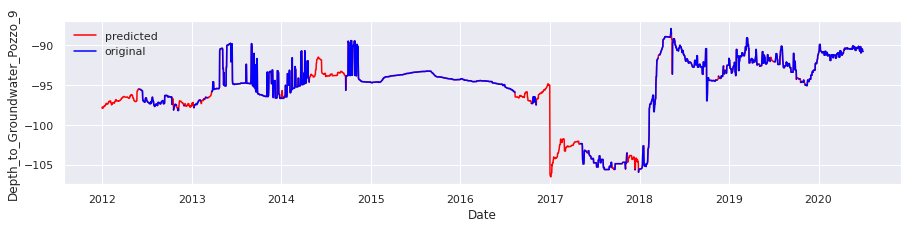

(1260, 8)
(1260,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


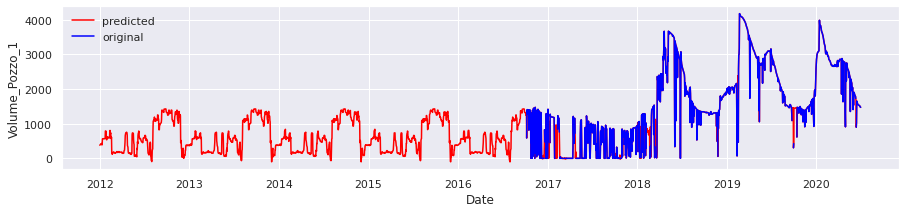

(1328, 8)
(1328,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


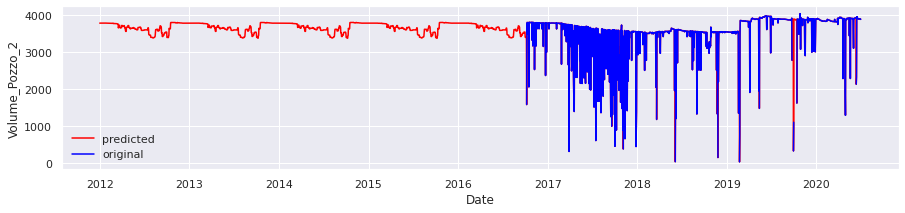

(1331, 8)
(1331,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


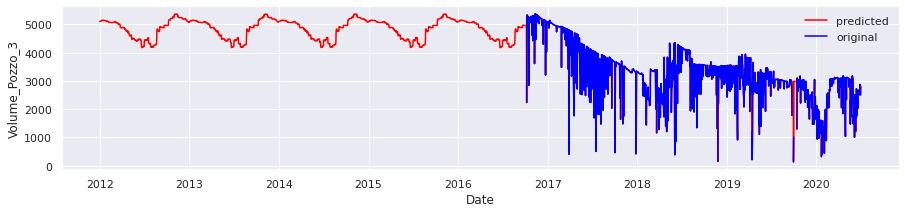

(1332, 8)
(1332,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


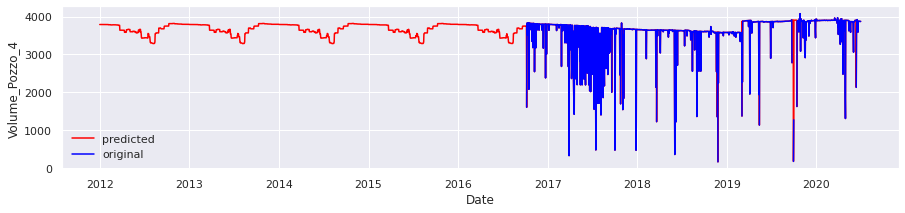

(1331, 8)
(1331,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


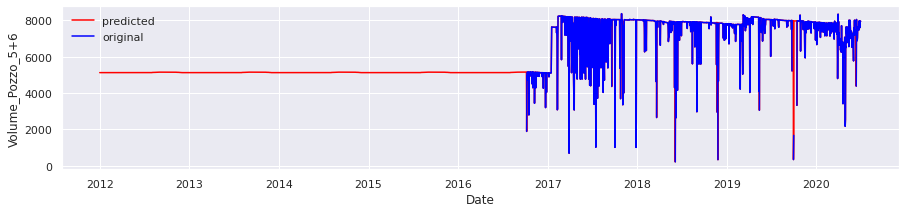

(1330, 8)
(1330,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


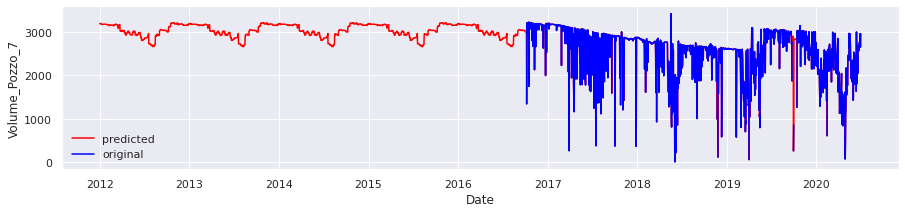

(1331, 8)
(1331,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


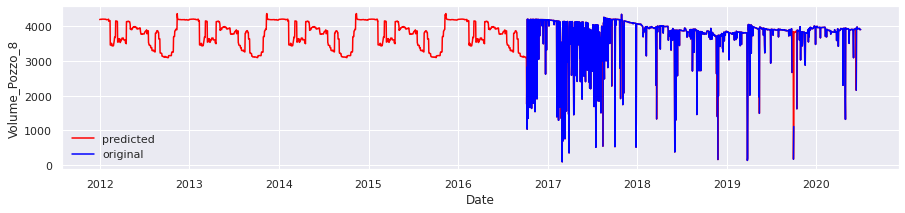

(1333, 8)
(1333,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


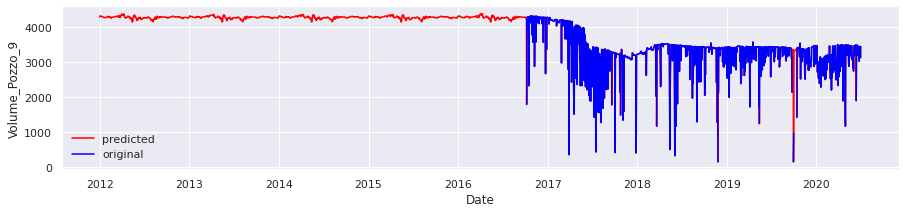

(1647, 8)
(1647,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


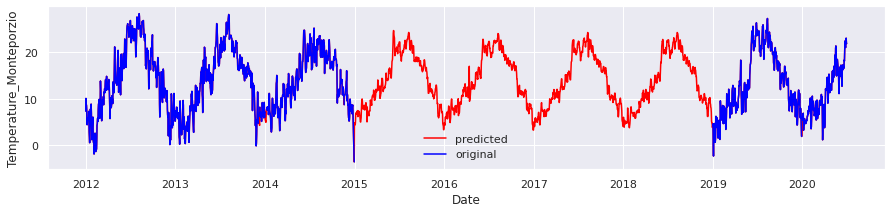

(1642, 8)
(1642,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


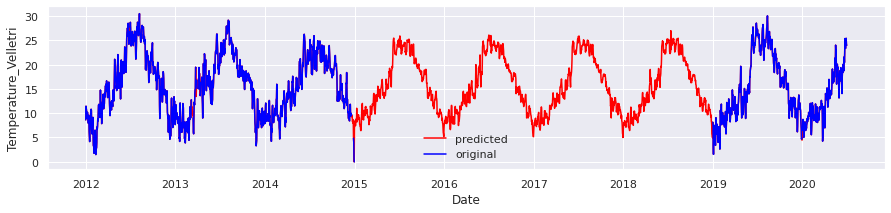


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
Index(['Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri', 'year'],
      dtype='object')
-0.0017793594 0.008896797
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-

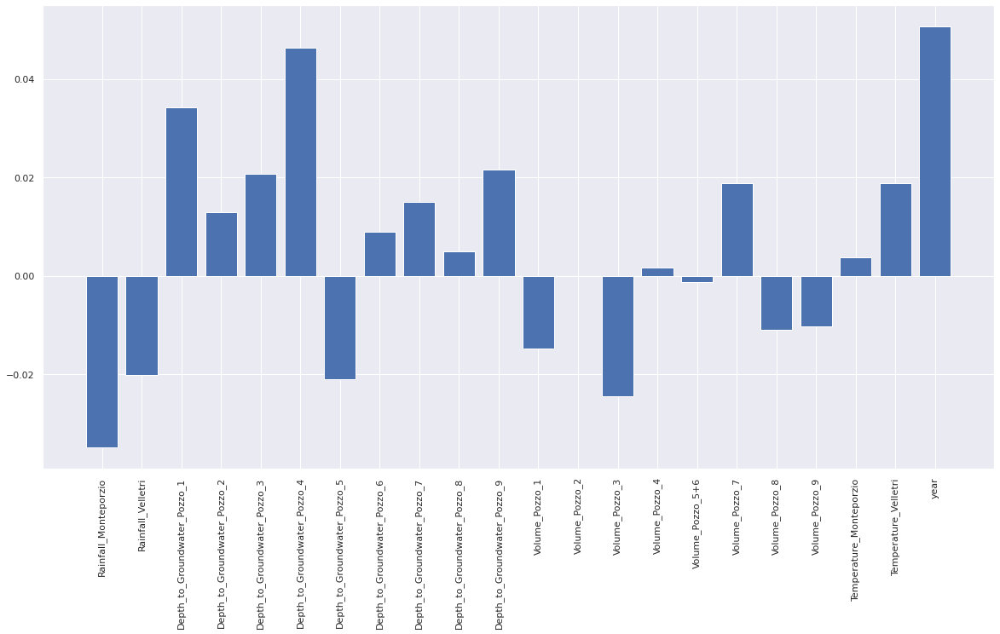

Selected Features - (array([ 0,  1,  2,  4,  5,  6, 10, 13, 21]),)
foo shape - (2172, 1, 1, 9)
Train reshape - (2172, 1, 9)
foo shape - (931, 1, 1, 9)
Test reshape - (931, 1, 9)
Epoch 1/100
68/68 - 0s - loss: 0.1598 - val_loss: 0.1039
Epoch 2/100
68/68 - 0s - loss: 0.0218 - val_loss: 0.0827
Epoch 3/100
68/68 - 0s - loss: 0.0189 - val_loss: 0.0867
Epoch 4/100
68/68 - 0s - loss: 0.0167 - val_loss: 0.0900
Epoch 5/100
68/68 - 0s - loss: 0.0145 - val_loss: 0.0923
Epoch 6/100
68/68 - 0s - loss: 0.0126 - val_loss: 0.0939
Epoch 7/100
68/68 - 0s - loss: 0.0108 - val_loss: 0.0963
Epoch 8/100
68/68 - 0s - loss: 0.0093 - val_loss: 0.0948
Epoch 9/100
68/68 - 0s - loss: 0.0078 - val_loss: 0.0924
Epoch 10/100
68/68 - 0s - loss: 0.0065 - val_loss: 0.0901
Epoch 11/100
68/68 - 0s - loss: 0.0055 - val_loss: 0.0868
Epoch 12/100
68/68 - 0s - loss: 0.0046 - val_loss: 0.0830
Epoch 13/100
68/68 - 0s - loss: 0.0038 - val_loss: 0.0801
Epoch 14/100
68/68 - 0s - loss: 0.0032 - val_loss: 0.0789
Epoch 15/100
68/68 

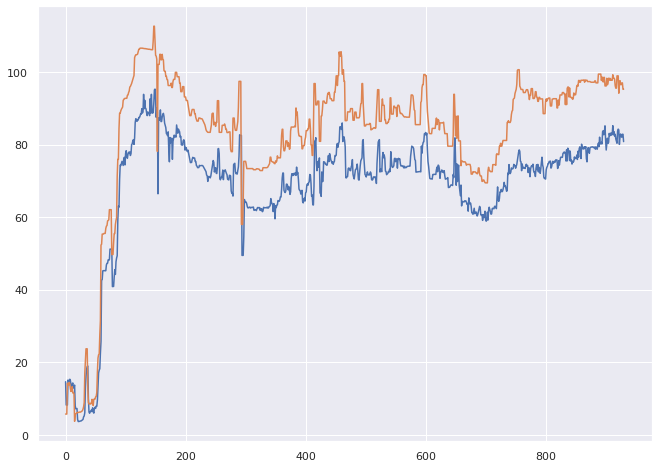

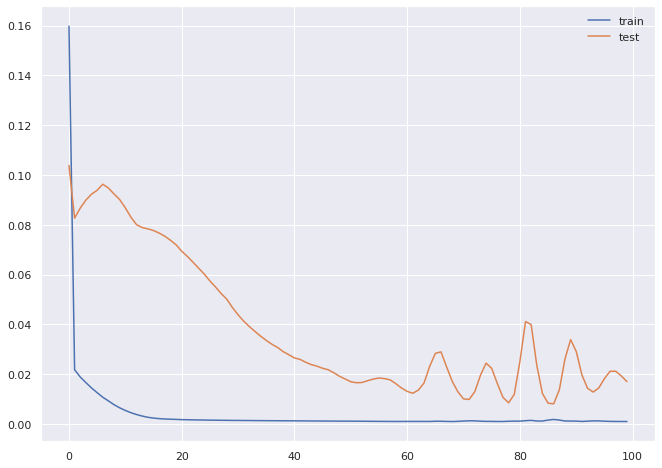

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.03202929  0.01818896 -0.01205745 -0.01919861 -0.01773918  0.00233144
  0.00260632  0.00963939 -0.00269967 -0.03042174  0.01115371  0.01477677
  0.01447021 -0.03393631 -0.00847415 -0.01022027  0.00266596 -0.01243831
 -0.01527681 -0.01564181  0.01179014 -0.02210657]
Mean: -0.0065735118
Standard Deviation: 0.015696395


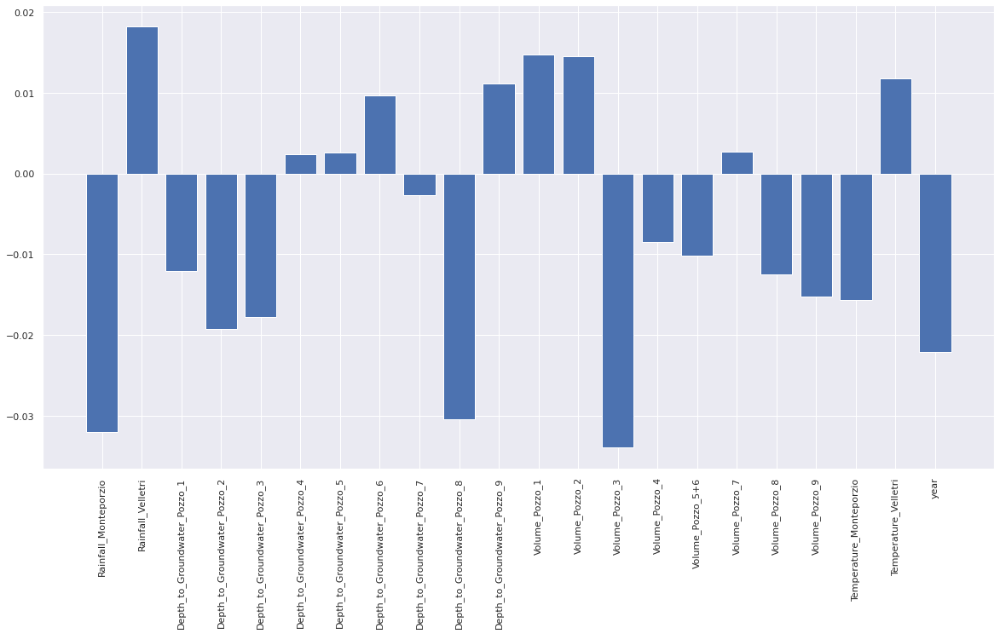

Selected Features - (array([ 0,  9, 13, 21]),)
foo shape - (2172, 1, 1, 4)
Train reshape - (2172, 1, 4)
foo shape - (931, 1, 1, 4)
Test reshape - (931, 1, 4)
Epoch 1/100
68/68 - 0s - loss: 0.5689 - val_loss: 0.1166
Epoch 2/100
68/68 - 0s - loss: 0.1673 - val_loss: 0.0214
Epoch 3/100
68/68 - 0s - loss: 0.0103 - val_loss: 0.0434
Epoch 4/100
68/68 - 0s - loss: 0.0075 - val_loss: 0.0387
Epoch 5/100
68/68 - 0s - loss: 0.0066 - val_loss: 0.0339
Epoch 6/100
68/68 - 0s - loss: 0.0059 - val_loss: 0.0285
Epoch 7/100
68/68 - 0s - loss: 0.0053 - val_loss: 0.0245
Epoch 8/100
68/68 - 0s - loss: 0.0049 - val_loss: 0.0221
Epoch 9/100
68/68 - 0s - loss: 0.0046 - val_loss: 0.0176
Epoch 10/100
68/68 - 0s - loss: 0.0043 - val_loss: 0.0171
Epoch 11/100
68/68 - 0s - loss: 0.0041 - val_loss: 0.0157
Epoch 12/100
68/68 - 0s - loss: 0.0040 - val_loss: 0.0130
Epoch 13/100
68/68 - 0s - loss: 0.0039 - val_loss: 0.0118
Epoch 14/100
68/68 - 0s - loss: 0.0038 - val_loss: 0.0102
Epoch 15/100
68/68 - 0s - loss: 0.0038 

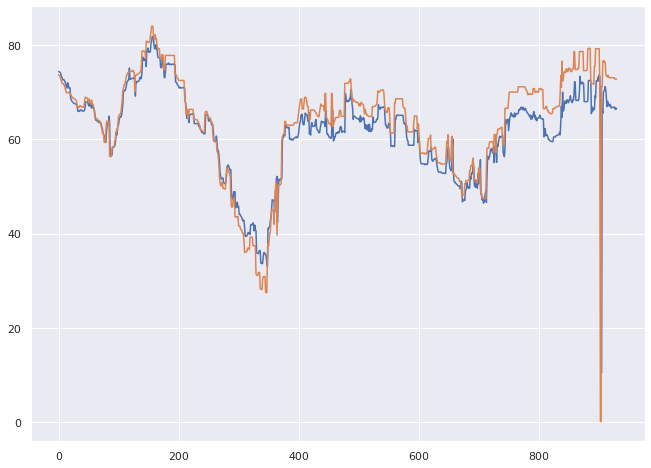

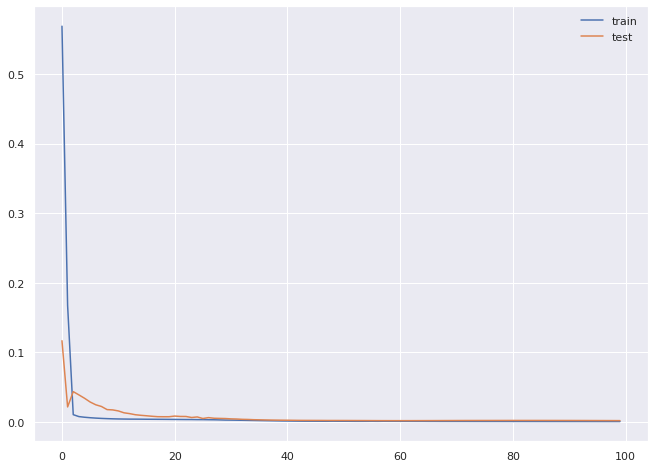

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.01191656 -0.03817294  0.02296565  0.00754087  0.00010125  0.0124356
  0.01533623  0.03435149  0.00746846 -0.00635123  0.01200638 -0.02294557
  0.01027524 -0.00860478 -0.01768745  0.01579341 -0.00405956 -0.01313202
  0.01313046 -0.02953637  0.03053406  0.0459933 ]
Mean: 0.0034329963
Standard Deviation: 0.020542838


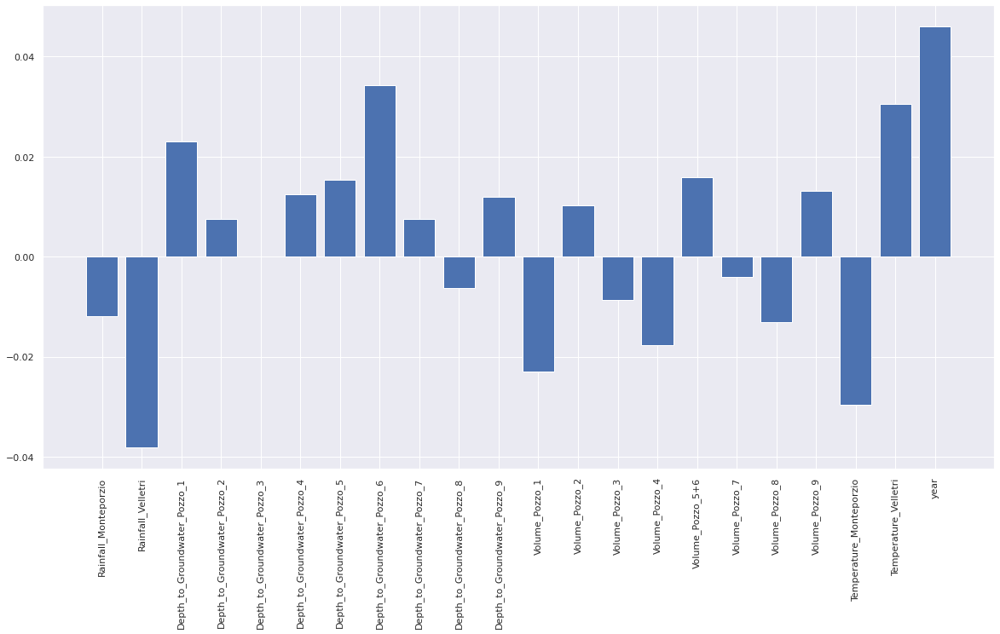

Selected Features - (array([ 1,  2,  7, 11, 19, 20, 21]),)
foo shape - (2172, 1, 1, 7)
Train reshape - (2172, 1, 7)
foo shape - (931, 1, 1, 7)
Test reshape - (931, 1, 7)
Epoch 1/100
68/68 - 0s - loss: 0.1983 - val_loss: 0.0193
Epoch 2/100
68/68 - 0s - loss: 0.1399 - val_loss: 0.0313
Epoch 3/100
68/68 - 0s - loss: 0.1177 - val_loss: 0.0330
Epoch 4/100
68/68 - 0s - loss: 0.1095 - val_loss: 0.0305
Epoch 5/100
68/68 - 0s - loss: 0.1045 - val_loss: 0.0274
Epoch 6/100
68/68 - 0s - loss: 0.1005 - val_loss: 0.0245
Epoch 7/100
68/68 - 0s - loss: 0.0971 - val_loss: 0.0225
Epoch 8/100
68/68 - 0s - loss: 0.0937 - val_loss: 0.0209
Epoch 9/100
68/68 - 0s - loss: 0.0905 - val_loss: 0.0199
Epoch 10/100
68/68 - 0s - loss: 0.0875 - val_loss: 0.0196
Epoch 11/100
68/68 - 0s - loss: 0.0846 - val_loss: 0.0200
Epoch 12/100
68/68 - 0s - loss: 0.0817 - val_loss: 0.0214
Epoch 13/100
68/68 - 0s - loss: 0.0797 - val_loss: 0.0227
Epoch 14/100
68/68 - 0s - loss: 0.0771 - val_loss: 0.0246
Epoch 15/100
68/68 - 0s - l

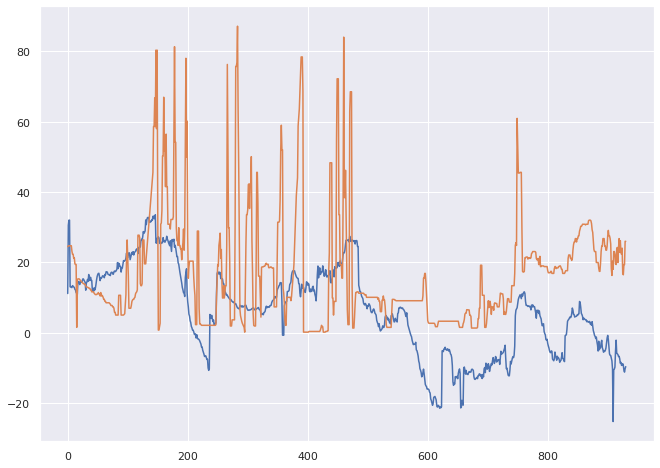

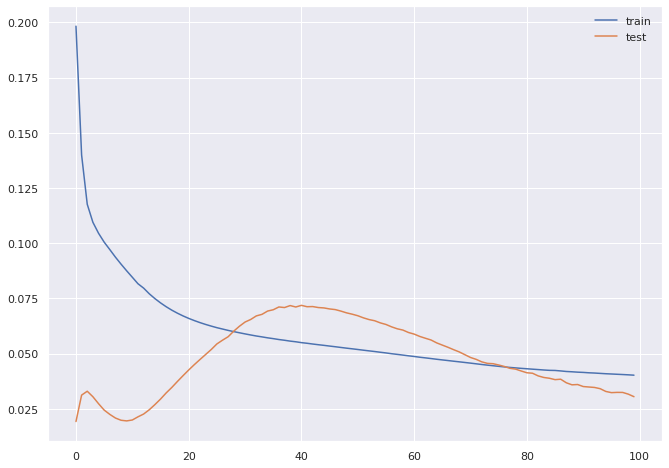

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.01644581  0.02865679  0.00278373 -0.00373471 -0.03531431 -0.03105027
 -0.00355188 -0.01788437 -0.00078451 -0.00902437  0.02149894 -0.01734245
  0.0312515  -0.03295582  0.03371665 -0.01850867 -0.00303238  0.02017581
  0.00473614 -0.00768668 -0.01695757 -0.00963621]
Mean: -0.0021908565
Standard Deviation: 0.02001908


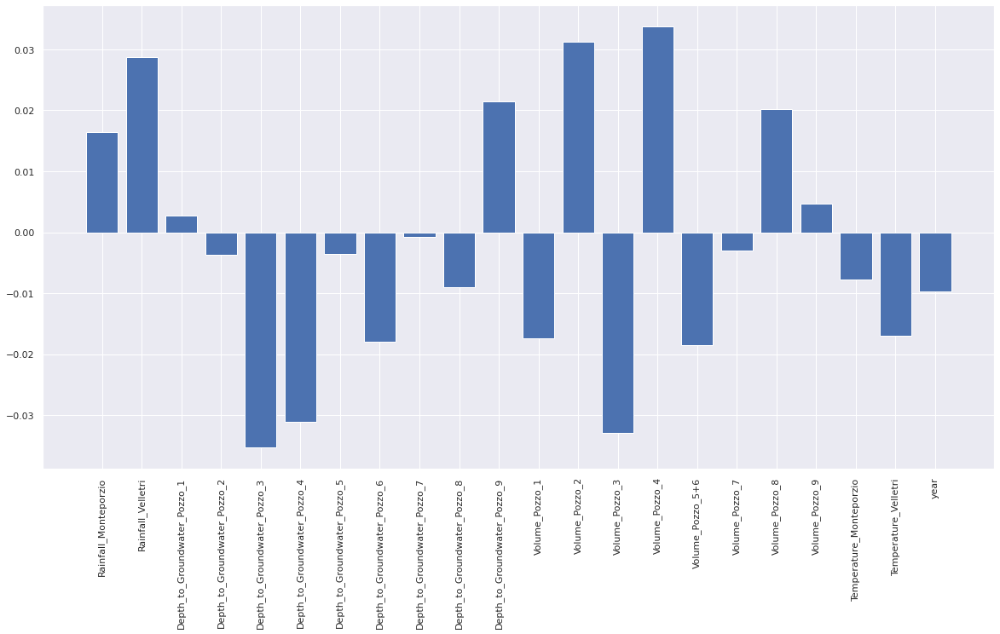

Selected Features - (array([ 1,  4,  5, 10, 12, 13, 14, 17]),)
foo shape - (2172, 1, 1, 8)
Train reshape - (2172, 1, 8)
foo shape - (931, 1, 1, 8)
Test reshape - (931, 1, 8)
Epoch 1/100
68/68 - 0s - loss: 0.3614 - val_loss: 0.0507
Epoch 2/100
68/68 - 0s - loss: 0.0097 - val_loss: 0.1653
Epoch 3/100
68/68 - 0s - loss: 0.0204 - val_loss: 0.1635
Epoch 4/100
68/68 - 0s - loss: 0.0202 - val_loss: 0.1639
Epoch 5/100
68/68 - 0s - loss: 0.0198 - val_loss: 0.1653
Epoch 6/100
68/68 - 0s - loss: 0.0195 - val_loss: 0.1658
Epoch 7/100
68/68 - 0s - loss: 0.0191 - val_loss: 0.1656
Epoch 8/100
68/68 - 0s - loss: 0.0187 - val_loss: 0.1653
Epoch 9/100
68/68 - 0s - loss: 0.0184 - val_loss: 0.1647
Epoch 10/100
68/68 - 0s - loss: 0.0180 - val_loss: 0.1636
Epoch 11/100
68/68 - 0s - loss: 0.0176 - val_loss: 0.1632
Epoch 12/100
68/68 - 0s - loss: 0.0172 - val_loss: 0.1616
Epoch 13/100
68/68 - 0s - loss: 0.0168 - val_loss: 0.1620
Epoch 14/100
68/68 - 0s - loss: 0.0165 - val_loss: 0.1591
Epoch 15/100
68/68 - 0s

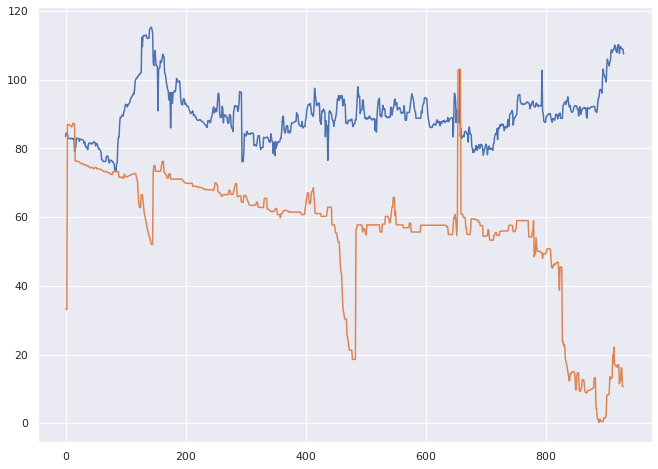

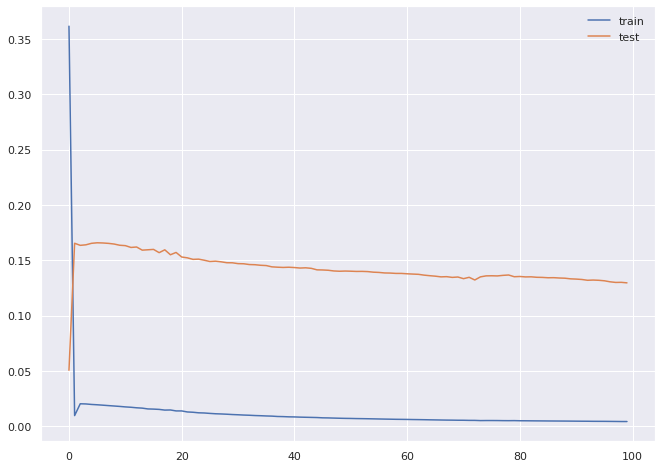

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.00274515 -0.03056223  0.00134442 -0.02875942 -0.01608355 -0.02123766
  0.02331098 -0.03826314 -0.0305065   0.01930093  0.01243497  0.04689694
 -0.0370015  -0.0187062   0.03538786 -0.01917775 -0.02000392  0.01735404
  0.00980848  0.01506113 -0.00916261  0.00084057]
Mean: -0.003862683
Standard Deviation: 0.023611156


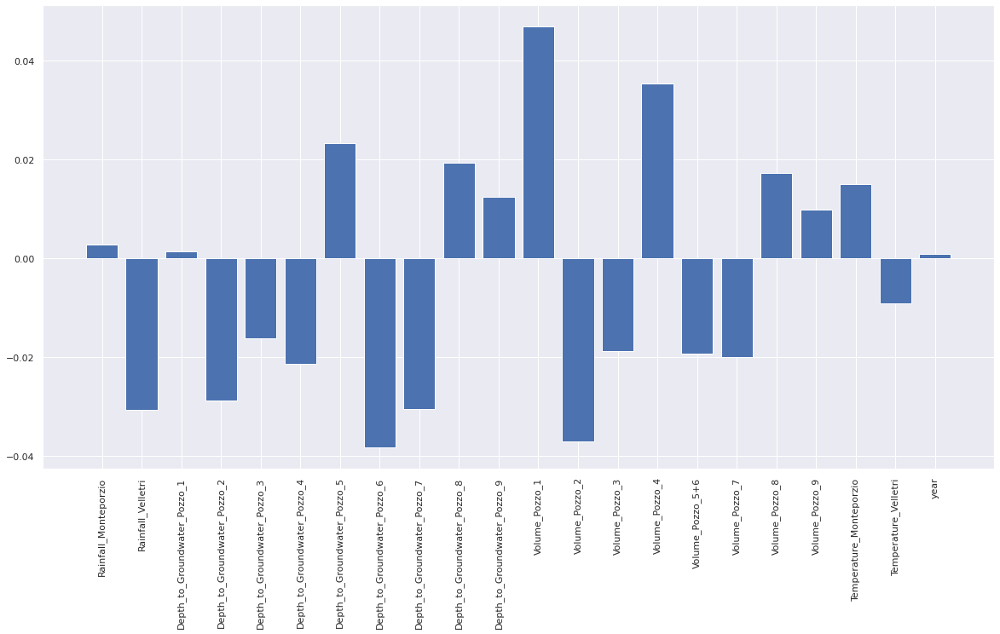

Selected Features - (array([ 1,  3,  5,  6,  7,  8, 11, 12, 14, 16]),)
foo shape - (2172, 1, 1, 10)
Train reshape - (2172, 1, 10)
foo shape - (931, 1, 1, 10)
Test reshape - (931, 1, 10)
Epoch 1/100
68/68 - 0s - loss: 0.2690 - val_loss: 0.0110
Epoch 2/100
68/68 - 0s - loss: 0.0681 - val_loss: 0.0089
Epoch 3/100
68/68 - 0s - loss: 0.0515 - val_loss: 0.0113
Epoch 4/100
68/68 - 0s - loss: 0.0371 - val_loss: 0.0153
Epoch 5/100
68/68 - 0s - loss: 0.0260 - val_loss: 0.0166
Epoch 6/100
68/68 - 0s - loss: 0.0182 - val_loss: 0.0150
Epoch 7/100
68/68 - 0s - loss: 0.0118 - val_loss: 0.0129
Epoch 8/100
68/68 - 0s - loss: 0.0077 - val_loss: 0.0070
Epoch 9/100
68/68 - 0s - loss: 0.0055 - val_loss: 0.0034
Epoch 10/100
68/68 - 0s - loss: 0.0044 - val_loss: 0.0021
Epoch 11/100
68/68 - 0s - loss: 0.0033 - val_loss: 0.0020
Epoch 12/100
68/68 - 0s - loss: 0.0023 - val_loss: 0.0023
Epoch 13/100
68/68 - 0s - loss: 0.0017 - val_loss: 0.0026
Epoch 14/100
68/68 - 0s - loss: 0.0013 - val_loss: 0.0028
Epoch 15/10

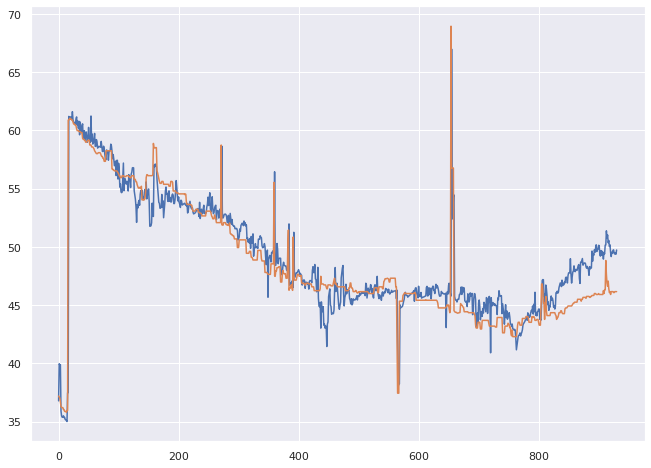

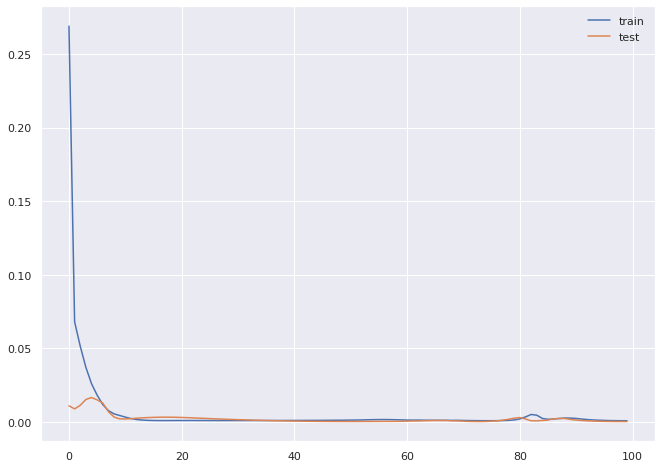

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.04450454  0.02279635  0.00494333 -0.00759992  0.01353518 -0.02326239
 -0.0316969   0.00938168  0.03082607  0.00564148  0.03460447  0.01094694
 -0.03548991  0.02047849 -0.00449222 -0.01571016  0.03012071 -0.00549206
  0.00221221  0.06293846  0.01847897 -0.01457318]
Mean: 0.0038219576
Standard Deviation: 0.025028069


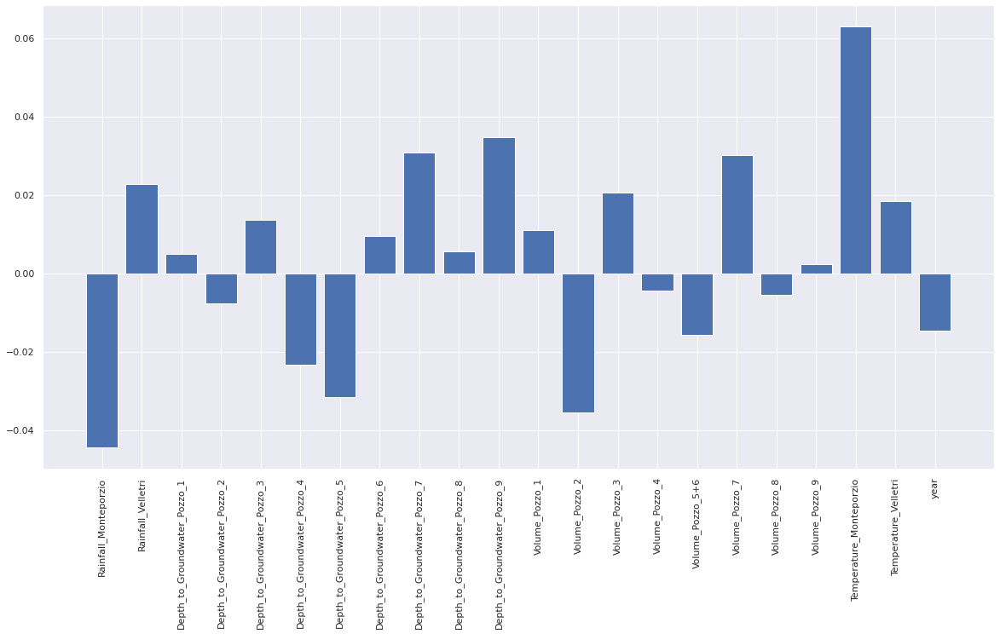

Selected Features - (array([ 0,  1,  5,  6,  8, 10, 12, 13, 16, 19]),)
foo shape - (2172, 1, 1, 10)
Train reshape - (2172, 1, 10)
foo shape - (931, 1, 1, 10)
Test reshape - (931, 1, 10)
Epoch 1/100
68/68 - 0s - loss: 0.1951 - val_loss: 0.0629
Epoch 2/100
68/68 - 0s - loss: 0.0173 - val_loss: 0.0836
Epoch 3/100
68/68 - 0s - loss: 0.0126 - val_loss: 0.0867
Epoch 4/100
68/68 - 0s - loss: 0.0096 - val_loss: 0.0874
Epoch 5/100
68/68 - 0s - loss: 0.0073 - val_loss: 0.0869
Epoch 6/100
68/68 - 0s - loss: 0.0057 - val_loss: 0.0858
Epoch 7/100
68/68 - 0s - loss: 0.0045 - val_loss: 0.0821
Epoch 8/100
68/68 - 0s - loss: 0.0041 - val_loss: 0.0890
Epoch 9/100
68/68 - 0s - loss: 0.0038 - val_loss: 0.0799
Epoch 10/100
68/68 - 0s - loss: 0.0037 - val_loss: 0.0780
Epoch 11/100
68/68 - 0s - loss: 0.0035 - val_loss: 0.0756
Epoch 12/100
68/68 - 0s - loss: 0.0034 - val_loss: 0.0732
Epoch 13/100
68/68 - 0s - loss: 0.0033 - val_loss: 0.0707
Epoch 14/100
68/68 - 0s - loss: 0.0032 - val_loss: 0.0759
Epoch 15/10

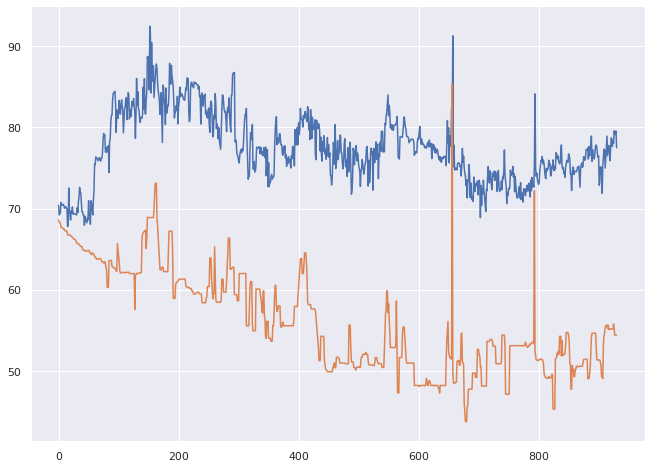

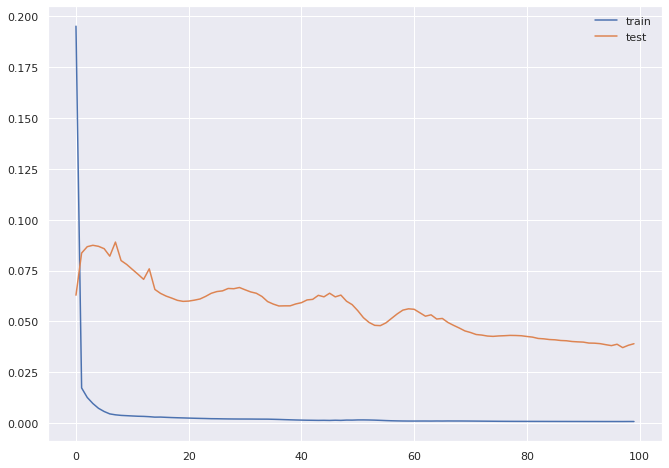

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.0730398   0.0505153   0.01259047 -0.02442315  0.03096675  0.03710942
  0.03146233  0.00385029 -0.02040309 -0.04280708  0.02960928  0.03023754
 -0.00876301  0.00857541  0.02577876  0.00917177  0.00159675 -0.05487436
  0.0252075  -0.01586889 -0.01719334  0.00603733]
Mean: 0.008700718
Standard Deviation: 0.029763235


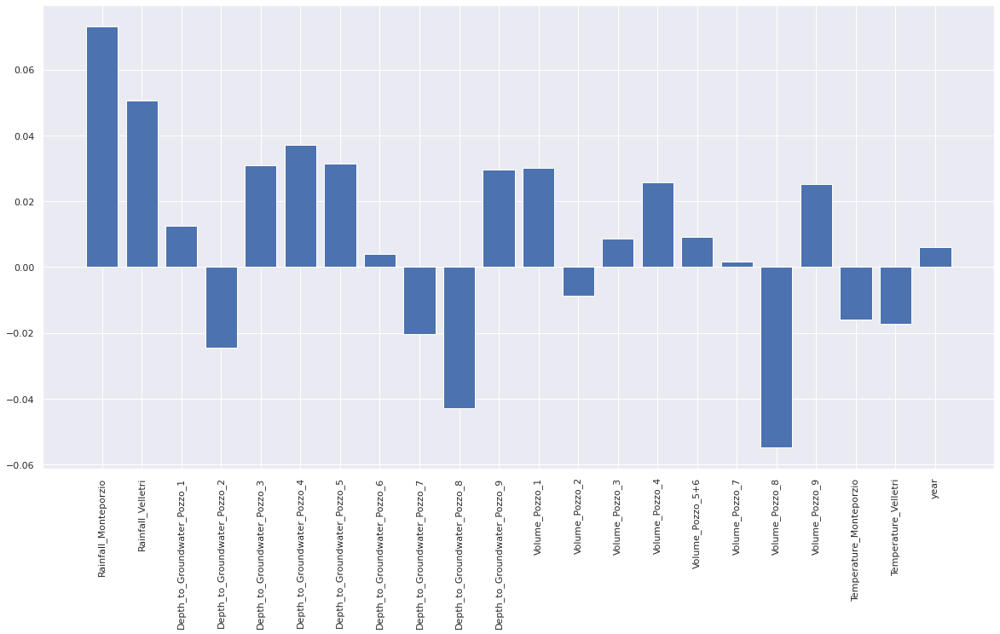

Selected Features - (array([ 0,  1,  3,  4,  5,  6,  8,  9, 10, 11, 14, 17, 18]),)
foo shape - (2172, 1, 1, 13)
Train reshape - (2172, 1, 13)
foo shape - (931, 1, 1, 13)
Test reshape - (931, 1, 13)
Epoch 1/100
68/68 - 0s - loss: 0.0874 - val_loss: 0.0422
Epoch 2/100
68/68 - 0s - loss: 0.0275 - val_loss: 0.0356
Epoch 3/100
68/68 - 0s - loss: 0.0234 - val_loss: 0.0307
Epoch 4/100
68/68 - 0s - loss: 0.0191 - val_loss: 0.0258
Epoch 5/100
68/68 - 0s - loss: 0.0156 - val_loss: 0.0233
Epoch 6/100
68/68 - 0s - loss: 0.0110 - val_loss: 0.0209
Epoch 7/100
68/68 - 0s - loss: 0.0073 - val_loss: 0.0209
Epoch 8/100
68/68 - 0s - loss: 0.0050 - val_loss: 0.0247
Epoch 9/100
68/68 - 0s - loss: 0.0036 - val_loss: 0.0278
Epoch 10/100
68/68 - 0s - loss: 0.0030 - val_loss: 0.0287
Epoch 11/100
68/68 - 0s - loss: 0.0028 - val_loss: 0.0266
Epoch 12/100
68/68 - 0s - loss: 0.0022 - val_loss: 0.0194
Epoch 13/100
68/68 - 0s - loss: 0.0022 - val_loss: 0.0147
Epoch 14/100
68/68 - 0s - loss: 0.0021 - val_loss: 0.0115

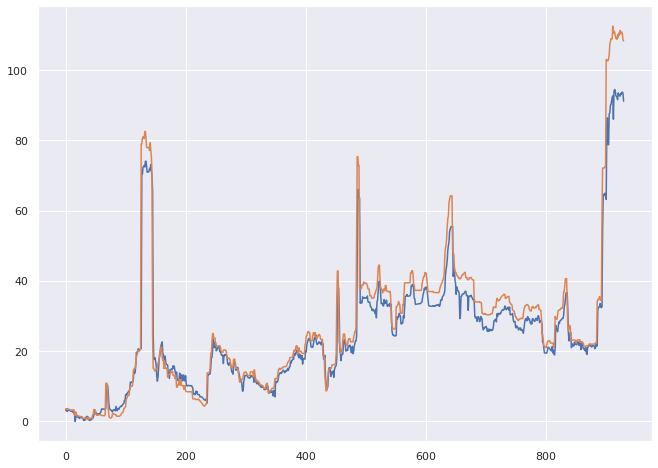

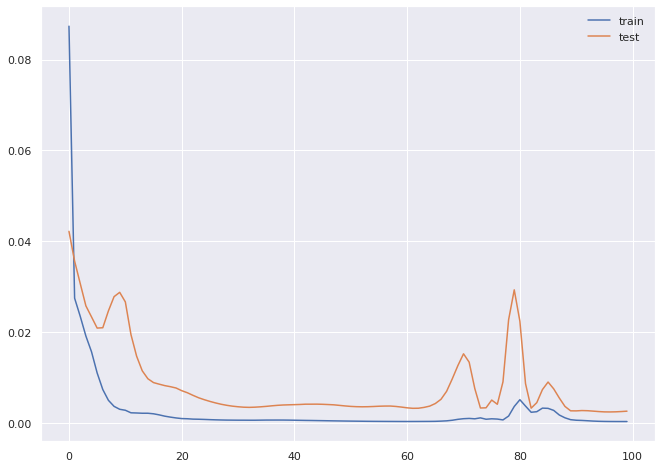

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.00117674 -0.01999924  0.03349414  0.0042097  -0.00147027  0.00652962
 -0.00548696  0.00546409 -0.03012634 -0.030873    0.0146978  -0.02583994
  0.00560971  0.01986416 -0.01108867 -0.00687042 -0.01341746  0.00517509
 -0.00517082 -0.00387173 -0.02133719  0.0018689 ]
Mean: -0.0035210035
Standard Deviation: 0.015697332


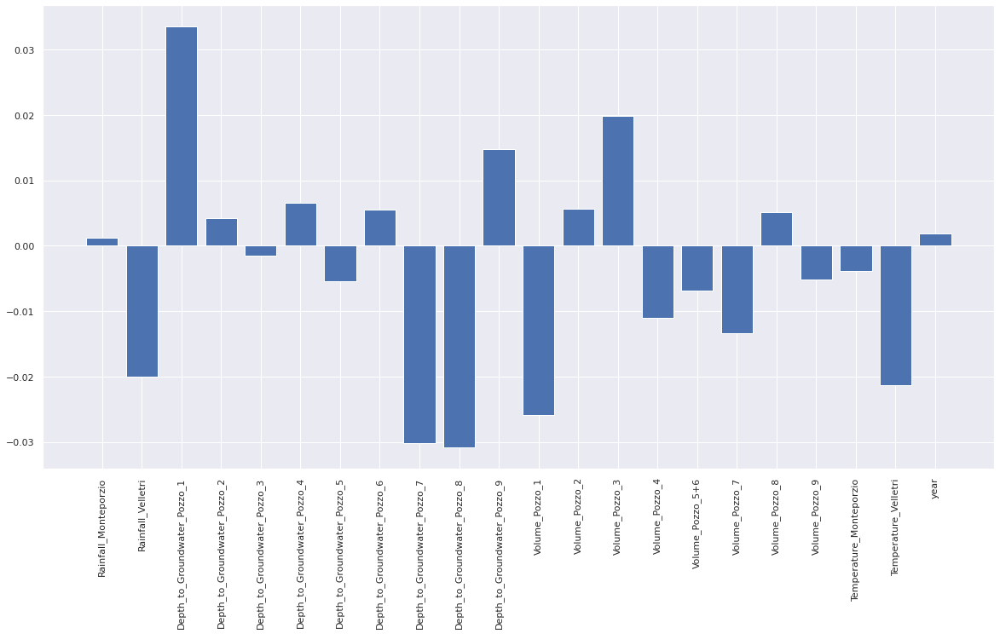

Selected Features - (array([ 2,  8,  9, 11, 20]),)
foo shape - (2172, 1, 1, 5)
Train reshape - (2172, 1, 5)
foo shape - (931, 1, 1, 5)
Test reshape - (931, 1, 5)
Epoch 1/100
68/68 - 0s - loss: 0.5123 - val_loss: 0.0278
Epoch 2/100
68/68 - 0s - loss: 0.0587 - val_loss: 0.1126
Epoch 3/100
68/68 - 0s - loss: 0.0316 - val_loss: 0.0952
Epoch 4/100
68/68 - 0s - loss: 0.0224 - val_loss: 0.0991
Epoch 5/100
68/68 - 0s - loss: 0.0166 - val_loss: 0.1000
Epoch 6/100
68/68 - 0s - loss: 0.0124 - val_loss: 0.0989
Epoch 7/100
68/68 - 0s - loss: 0.0095 - val_loss: 0.0962
Epoch 8/100
68/68 - 0s - loss: 0.0076 - val_loss: 0.0925
Epoch 9/100
68/68 - 0s - loss: 0.0062 - val_loss: 0.0885
Epoch 10/100
68/68 - 0s - loss: 0.0053 - val_loss: 0.0845
Epoch 11/100
68/68 - 0s - loss: 0.0046 - val_loss: 0.0807
Epoch 12/100
68/68 - 0s - loss: 0.0040 - val_loss: 0.0770
Epoch 13/100
68/68 - 0s - loss: 0.0035 - val_loss: 0.0737
Epoch 14/100
68/68 - 0s - loss: 0.0030 - val_loss: 0.0706
Epoch 15/100
68/68 - 0s - loss: 0.0

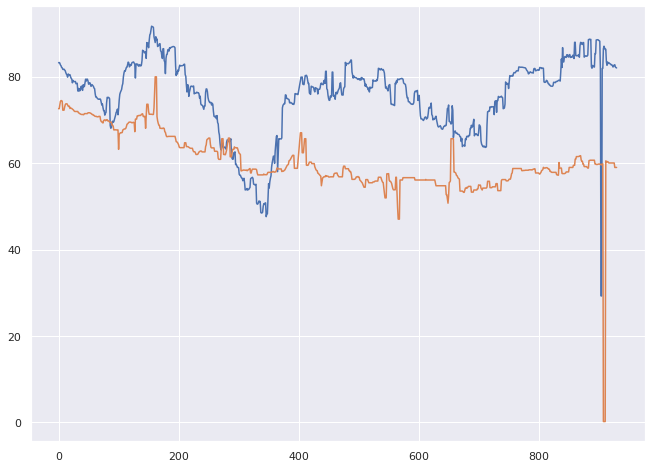

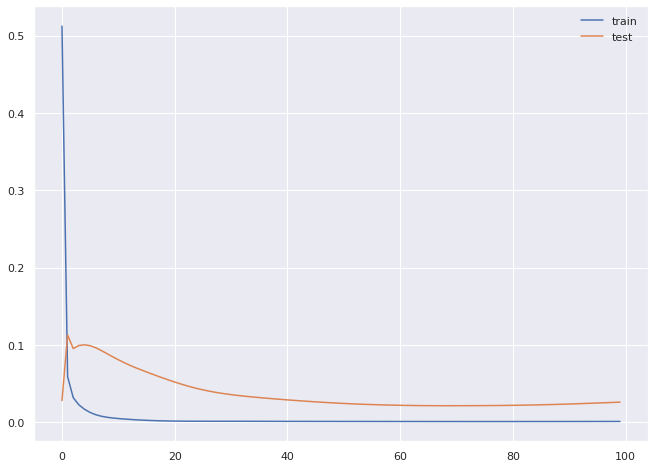

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.04055464 -0.07330623 -0.0134506   0.00421976  0.00989044  0.00110519
 -0.00426863 -0.04779587  0.05776305 -0.01440504 -0.01542503 -0.00371295
  0.01331974  0.02023505 -0.01693161 -0.00665797 -0.00978127 -0.05199222
 -0.02951914 -0.00347836 -0.03076533  0.01970389]
Mean: -0.010718536
Standard Deviation: 0.027652197


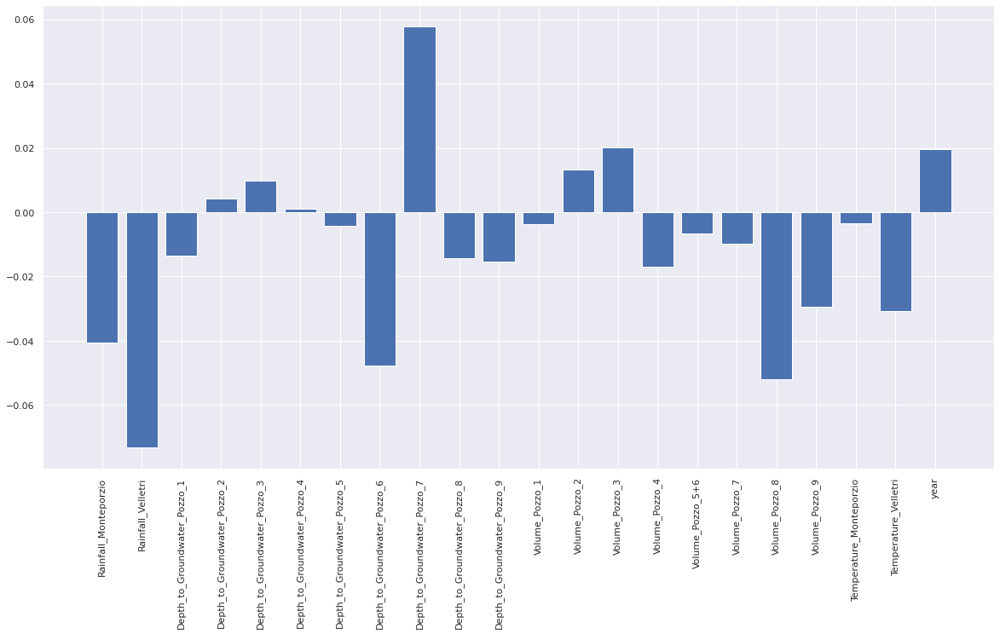

Selected Features - (array([ 0,  1,  7,  8, 13, 17, 18, 20]),)
foo shape - (2172, 1, 1, 8)
Train reshape - (2172, 1, 8)
foo shape - (931, 1, 1, 8)
Test reshape - (931, 1, 8)
Epoch 1/100
68/68 - 0s - loss: 0.2789 - val_loss: 0.0356
Epoch 2/100
68/68 - 0s - loss: 0.0751 - val_loss: 0.0355
Epoch 3/100
68/68 - 0s - loss: 0.0733 - val_loss: 0.0352
Epoch 4/100
68/68 - 0s - loss: 0.0716 - val_loss: 0.0350
Epoch 5/100
68/68 - 0s - loss: 0.0707 - val_loss: 0.0349
Epoch 6/100
68/68 - 0s - loss: 0.0701 - val_loss: 0.0349
Epoch 7/100
68/68 - 0s - loss: 0.0697 - val_loss: 0.0349
Epoch 8/100
68/68 - 0s - loss: 0.0695 - val_loss: 0.0349
Epoch 9/100
68/68 - 0s - loss: 0.0695 - val_loss: 0.0348
Epoch 10/100
68/68 - 0s - loss: 0.0694 - val_loss: 0.0348
Epoch 11/100
68/68 - 0s - loss: 0.0695 - val_loss: 0.0347
Epoch 12/100
68/68 - 0s - loss: 0.0695 - val_loss: 0.0347
Epoch 13/100
68/68 - 0s - loss: 0.0695 - val_loss: 0.0346
Epoch 14/100
68/68 - 0s - loss: 0.0694 - val_loss: 0.0345
Epoch 15/100
68/68 - 0s

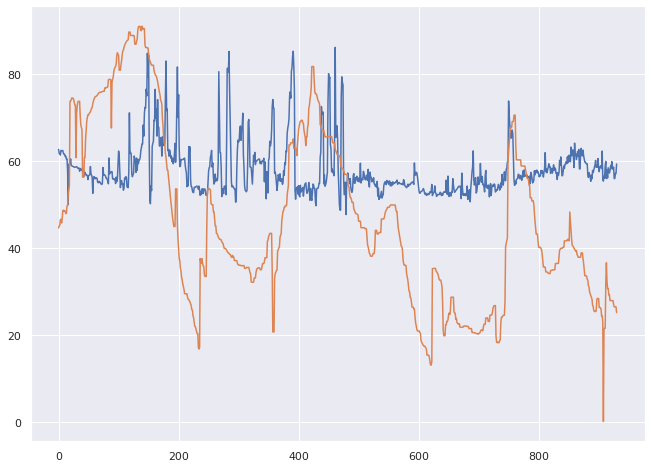

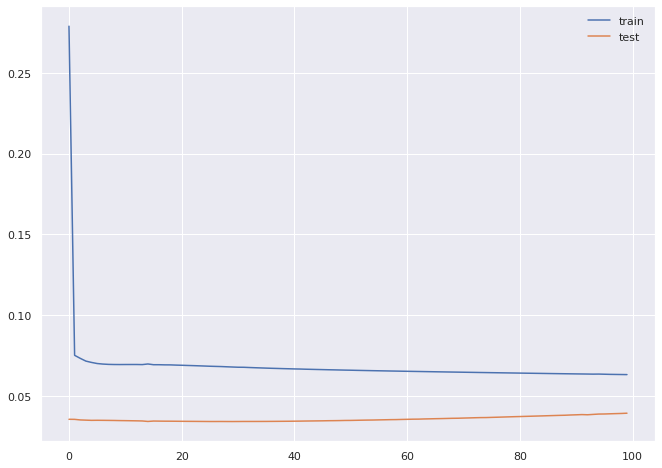

Dataset for imputation -            Date  Rainfall_Simignano  ...  year  month
2922 2008-01-01                 NaN  ...  2008    Jan
2923 2008-01-02                 NaN  ...  2008    Jan
2924 2008-01-03                 NaN  ...  2008    Jan
2925 2008-01-04                 4.0  ...  2008    Jan
2926 2008-01-05                 2.2  ...  2008    Jan
...         ...                 ...  ...   ...    ...
7482 2020-06-26                 NaN  ...  2020    Jun
7483 2020-06-27                 NaN  ...  2020    Jun
7484 2020-06-28                 NaN  ...  2020    Jun
7485 2020-06-29                 NaN  ...  2020    Jun
7486 2020-06-30                 NaN  ...  2020    Jun

[4565 rows x 24 columns]
(1522, 8)
(1522,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


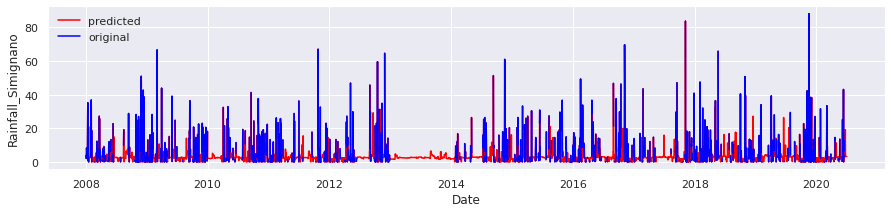

(339, 8)
(339,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


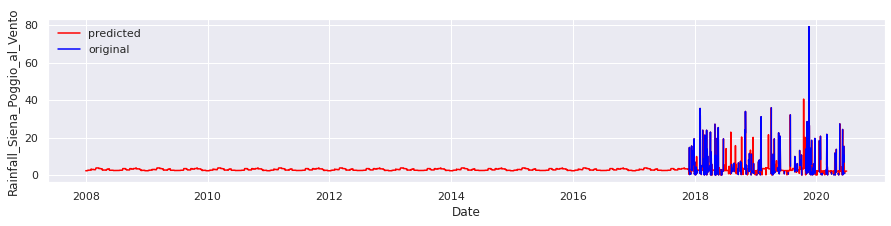

(611, 8)
(611,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


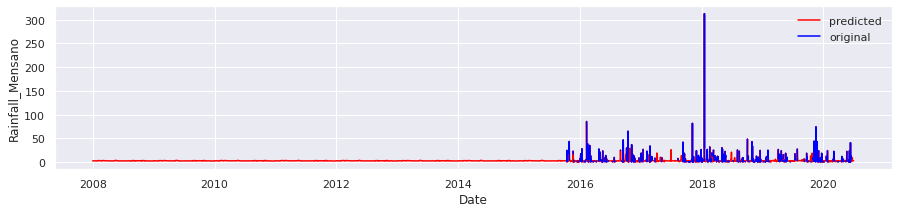

(1826, 8)
(1826,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


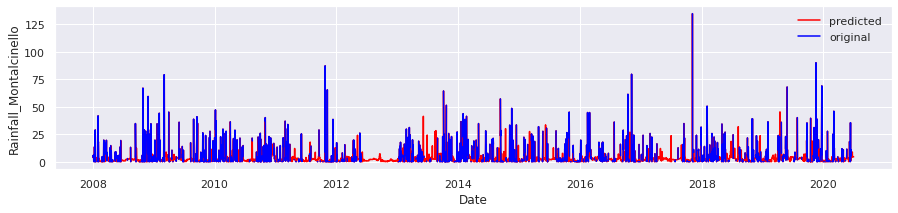

(938, 8)
(938,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


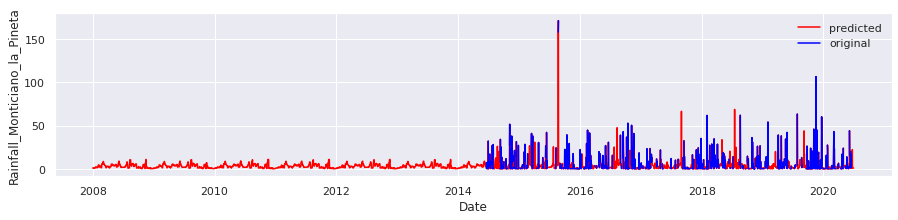

(1764, 8)
(1764,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


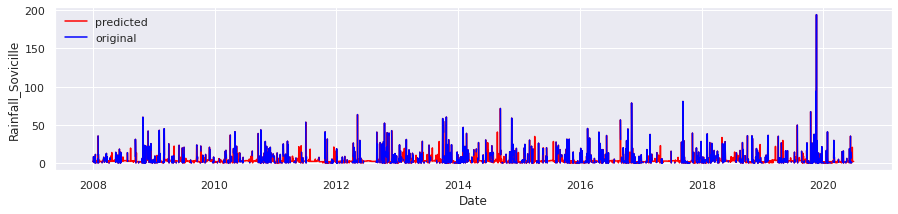

(555, 8)
(555,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


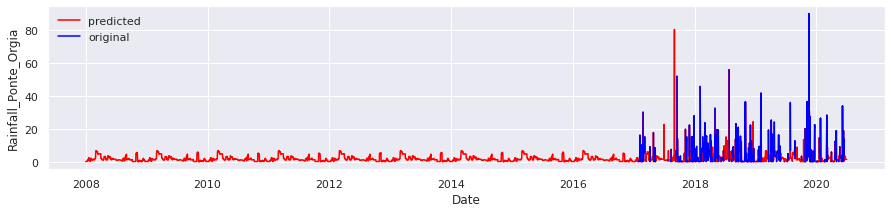

(1235, 8)
(1235,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


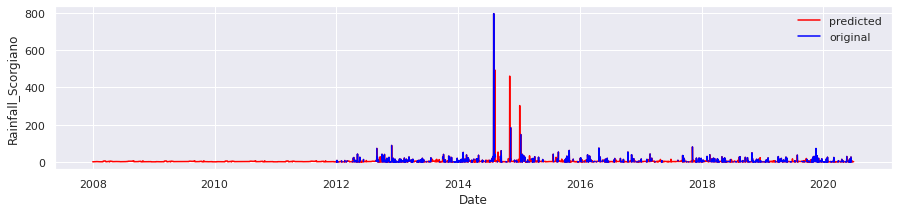

(983, 8)
(983,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


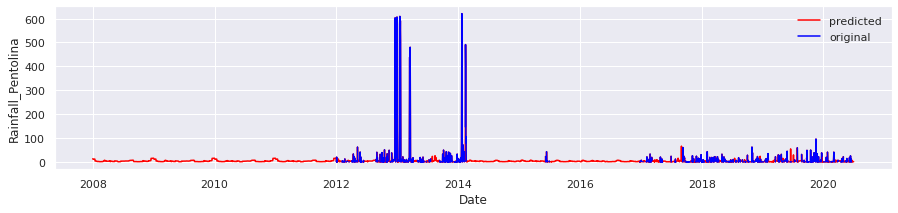

(1263, 8)
(1263,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


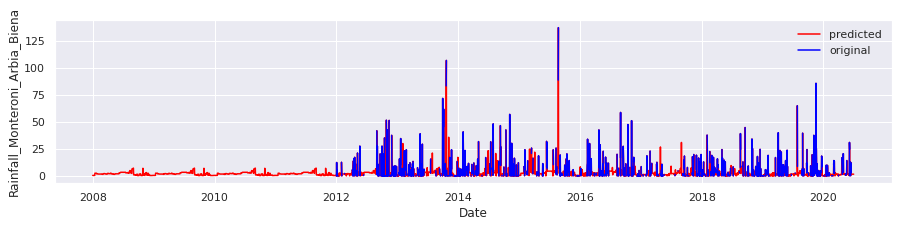

(3346, 8)
(3346,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


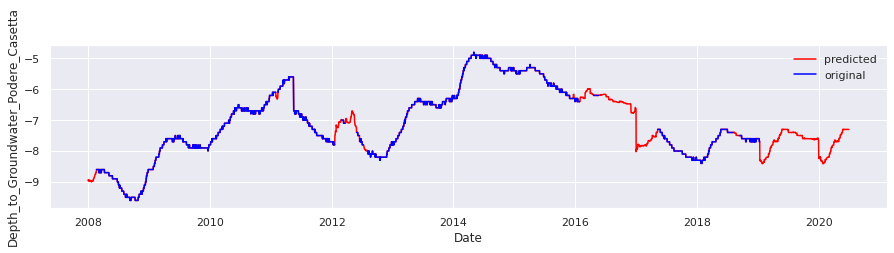

(1012, 8)
(1012,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


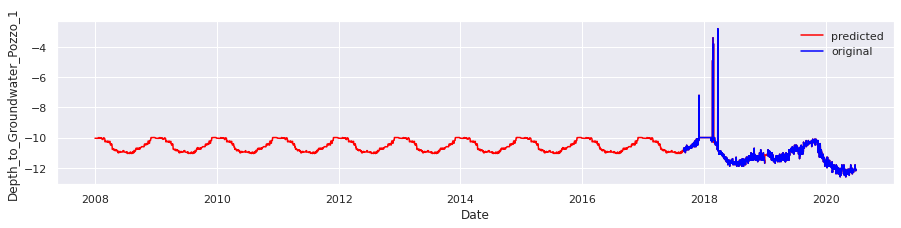

(920, 8)
(920,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


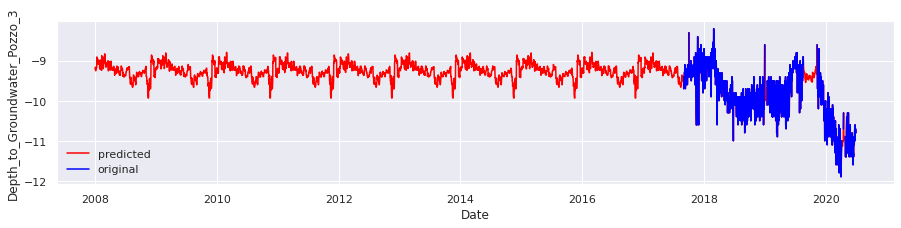

(965, 8)
(965,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


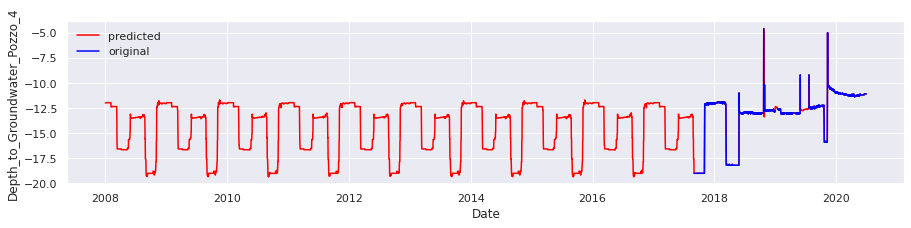

(953, 8)
(953,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


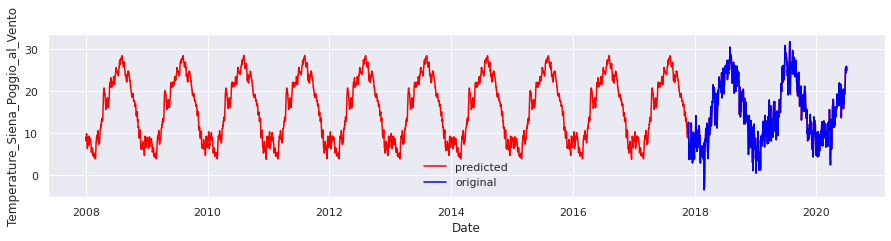

(1720, 8)
(1720,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


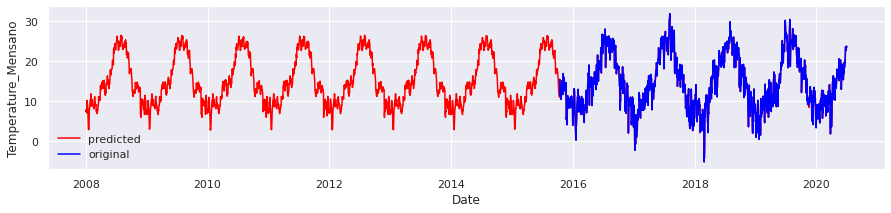

(4375, 8)
(4375,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


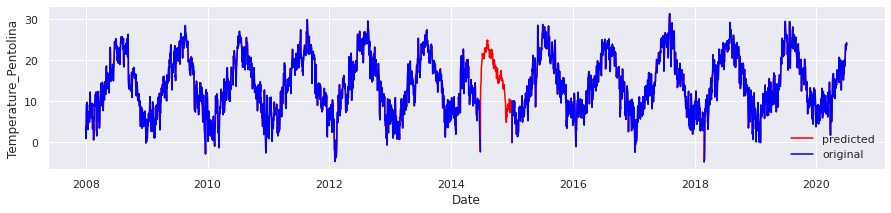

(4522, 8)
(4522,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


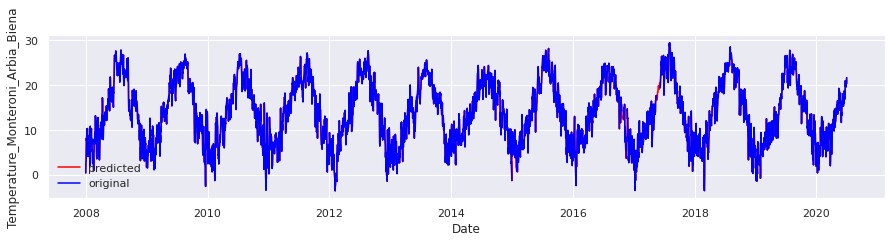

(2008, 8)
(2008,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


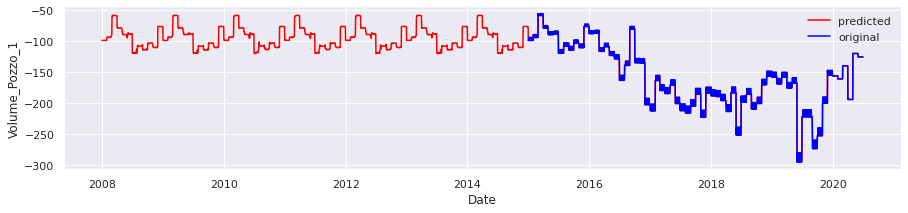

(1947, 8)
(1947,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


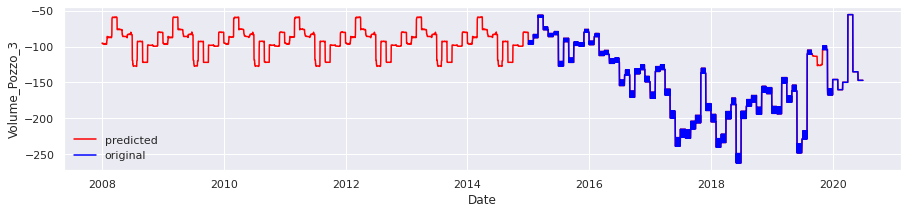

(2008, 8)
(2008,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


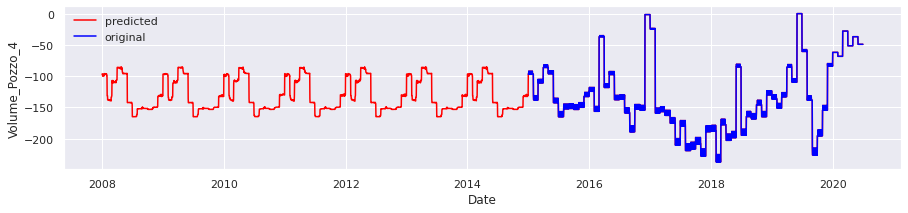


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Depth_to_Groundwater_Podere_Casetta']
Index(['Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4', 'year'],
      dtype='object')
-0.002283105 0.011415524
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', '

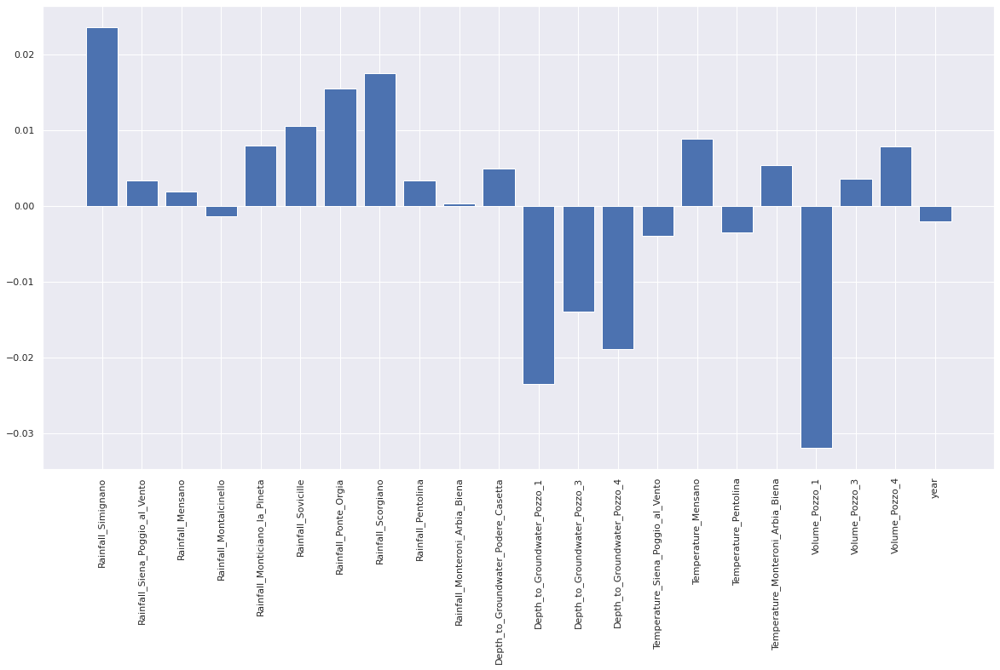

Selected Features - (array([ 0, 11, 18]),)
foo shape - (3194, 1, 1, 3)
Train reshape - (3194, 1, 3)
foo shape - (1370, 1, 1, 3)
Test reshape - (1370, 1, 3)
Epoch 1/100
100/100 - 0s - loss: 0.1265 - val_loss: 0.0126
Epoch 2/100
100/100 - 0s - loss: 0.0647 - val_loss: 0.0282
Epoch 3/100
100/100 - 0s - loss: 0.0766 - val_loss: 0.0265
Epoch 4/100
100/100 - 0s - loss: 0.0756 - val_loss: 0.0257
Epoch 5/100
100/100 - 0s - loss: 0.0750 - val_loss: 0.0253
Epoch 6/100
100/100 - 0s - loss: 0.0746 - val_loss: 0.0251
Epoch 7/100
100/100 - 0s - loss: 0.0743 - val_loss: 0.0249
Epoch 8/100
100/100 - 0s - loss: 0.0741 - val_loss: 0.0248
Epoch 9/100
100/100 - 0s - loss: 0.0739 - val_loss: 0.0248
Epoch 10/100
100/100 - 0s - loss: 0.0737 - val_loss: 0.0247
Epoch 11/100
100/100 - 0s - loss: 0.0735 - val_loss: 0.0247
Epoch 12/100
100/100 - 0s - loss: 0.0733 - val_loss: 0.0248
Epoch 13/100
100/100 - 0s - loss: 0.0732 - val_loss: 0.0248
Epoch 14/100
100/100 - 0s - loss: 0.0730 - val_loss: 0.0248
Epoch 15/100


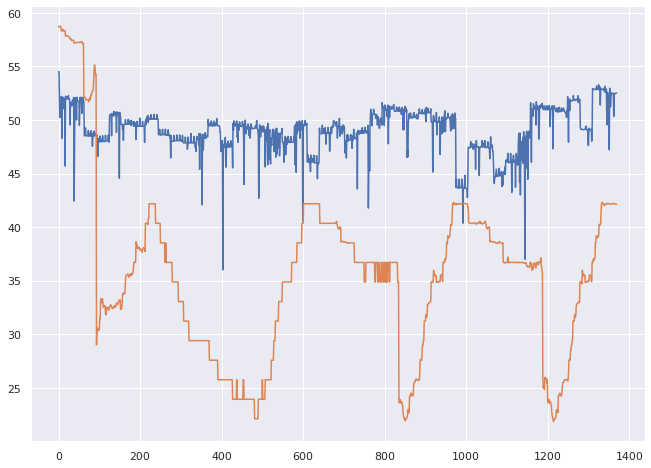

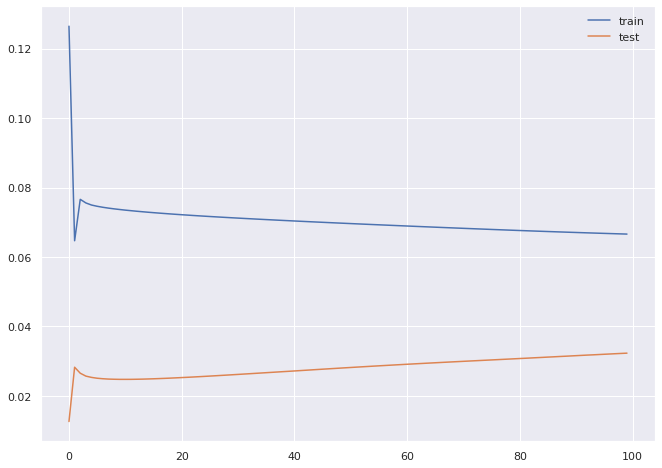

Dataset for imputation -            Date  Rainfall_Bastia_Umbra  ...  year  month
0    2006-03-14                    NaN  ...  2006    Mar
1    2006-03-15                    NaN  ...  2006    Mar
2    2006-03-16                    NaN  ...  2006    Mar
3    2006-03-17                    NaN  ...  2006    Mar
4    2006-03-18                    NaN  ...  2006    Mar
...         ...                    ...  ...   ...    ...
5218 2020-06-26                    NaN  ...  2020    Jun
5219 2020-06-27                    NaN  ...  2020    Jun
5220 2020-06-28                    NaN  ...  2020    Jun
5221 2020-06-29                    NaN  ...  2020    Jun
5222 2020-06-30                    NaN  ...  2020    Jun

[5223 rows x 10 columns]
(1052, 8)
(1052,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


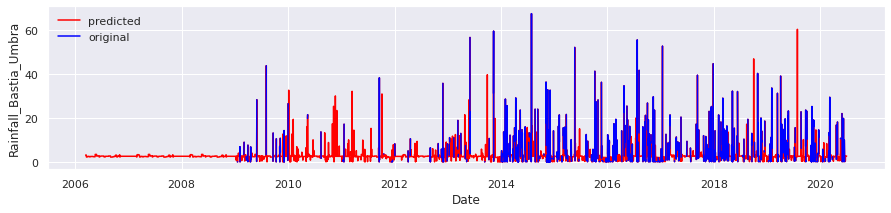

(5168, 8)
(5168,)


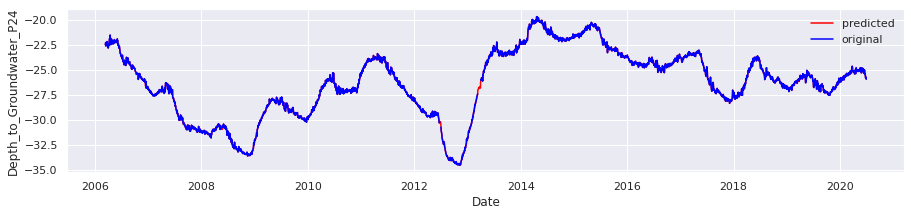

(5184, 8)
(5184,)


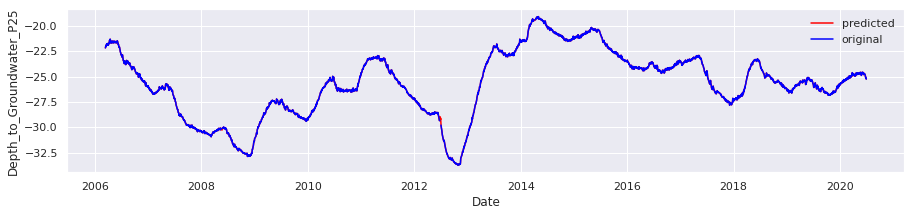

(4192, 8)
(4192,)


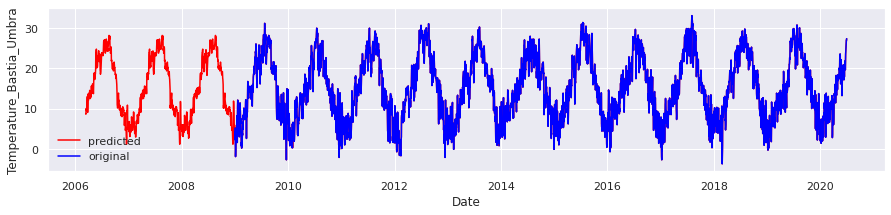

(4046, 8)
(4046,)


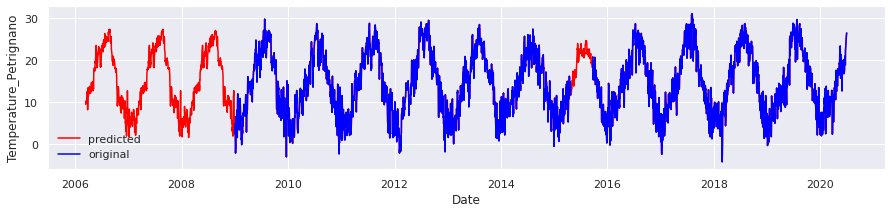

(4995, 8)
(4995,)


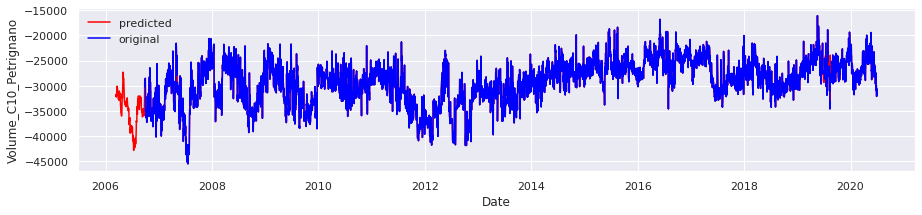

(4049, 8)
(4049,)


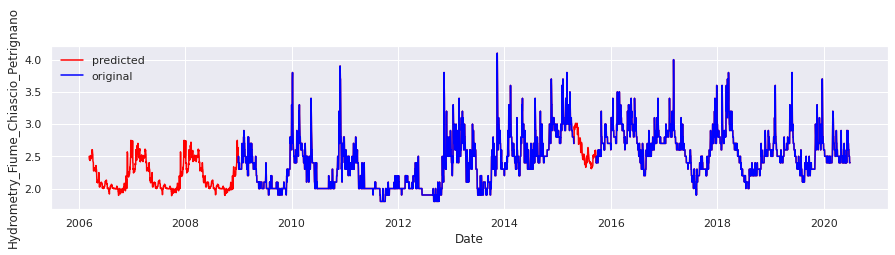

target Attributes - ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Index(['Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano', 'year'],
      dtype='object')
-0.0014880951 0.0148809515
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var2(t)', 'var3(t)'],
      dtype='object')
3655 1567
(3655, 1, 8) (3655,) (1567, 1, 8) (1567,)
[-0.03946851  0.00624471  0.00627605 -0.03004889  0.02798273 -0.00289273
  0.00137116 -0.05807522]
Mean: -0.011076337
Standard Deviation: 0.02674793


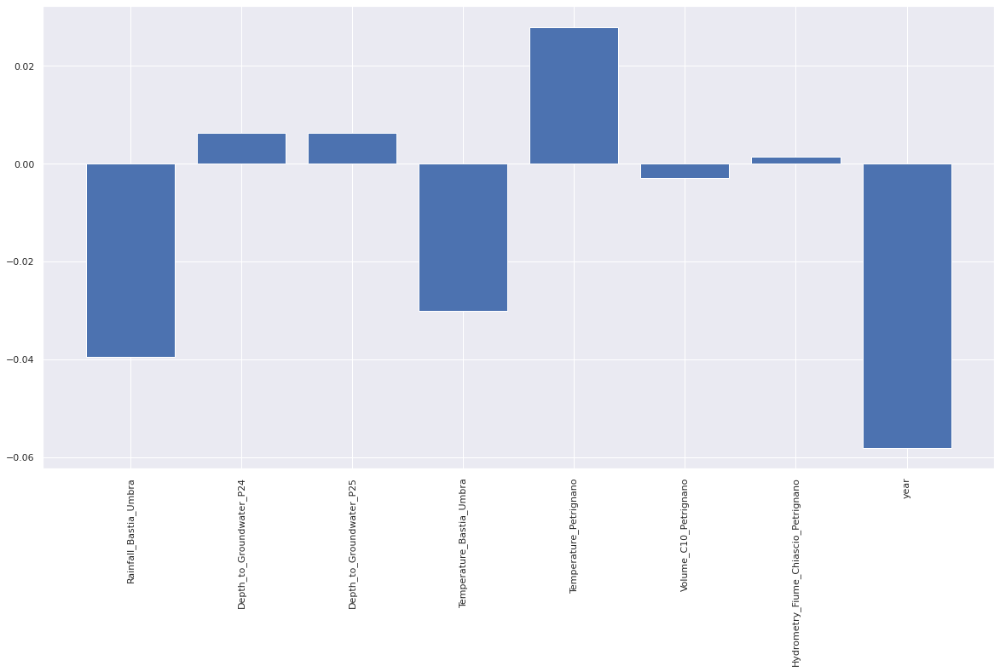

Selected Features - (array([0, 3, 4, 7]),)
foo shape - (3655, 1, 1, 4)
Train reshape - (3655, 1, 4)
foo shape - (1567, 1, 1, 4)
Test reshape - (1567, 1, 4)
Epoch 1/100
115/115 - 0s - loss: 0.1555 - val_loss: 0.0347
Epoch 2/100
115/115 - 0s - loss: 0.0675 - val_loss: 0.0773
Epoch 3/100
115/115 - 0s - loss: 0.0649 - val_loss: 0.0893
Epoch 4/100
115/115 - 1s - loss: 0.0625 - val_loss: 0.1016
Epoch 5/100
115/115 - 0s - loss: 0.0608 - val_loss: 0.1139
Epoch 6/100
115/115 - 0s - loss: 0.0595 - val_loss: 0.1255
Epoch 7/100
115/115 - 0s - loss: 0.0586 - val_loss: 0.1363
Epoch 8/100
115/115 - 0s - loss: 0.0580 - val_loss: 0.1461
Epoch 9/100
115/115 - 0s - loss: 0.0575 - val_loss: 0.1549
Epoch 10/100
115/115 - 0s - loss: 0.0572 - val_loss: 0.1628
Epoch 11/100
115/115 - 0s - loss: 0.0569 - val_loss: 0.1697
Epoch 12/100
115/115 - 0s - loss: 0.0568 - val_loss: 0.1758
Epoch 13/100
115/115 - 0s - loss: 0.0566 - val_loss: 0.1812
Epoch 14/100
115/115 - 0s - loss: 0.0565 - val_loss: 0.1860
Epoch 15/100


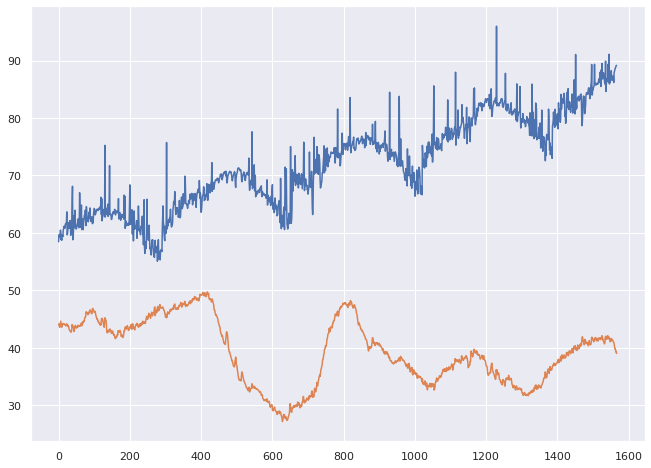

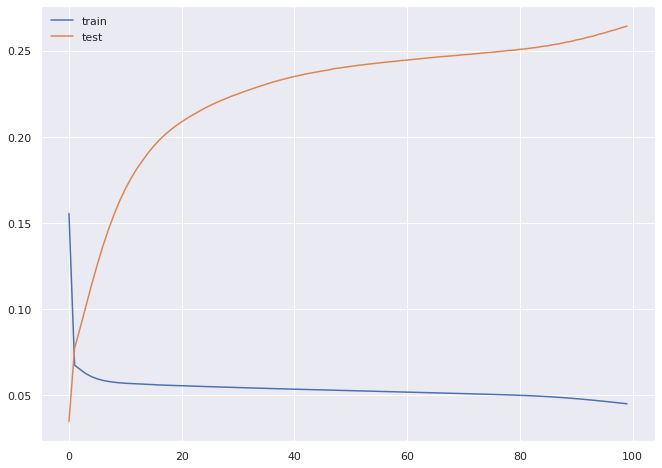

3655 1567
(3655, 1, 8) (3655,) (1567, 1, 8) (1567,)
[-0.00966291 -0.0334515  -0.00247046  0.0173707   0.00649783 -0.00206623
 -0.01216971 -0.00430548]
Mean: -0.005032221
Standard Deviation: 0.013832765


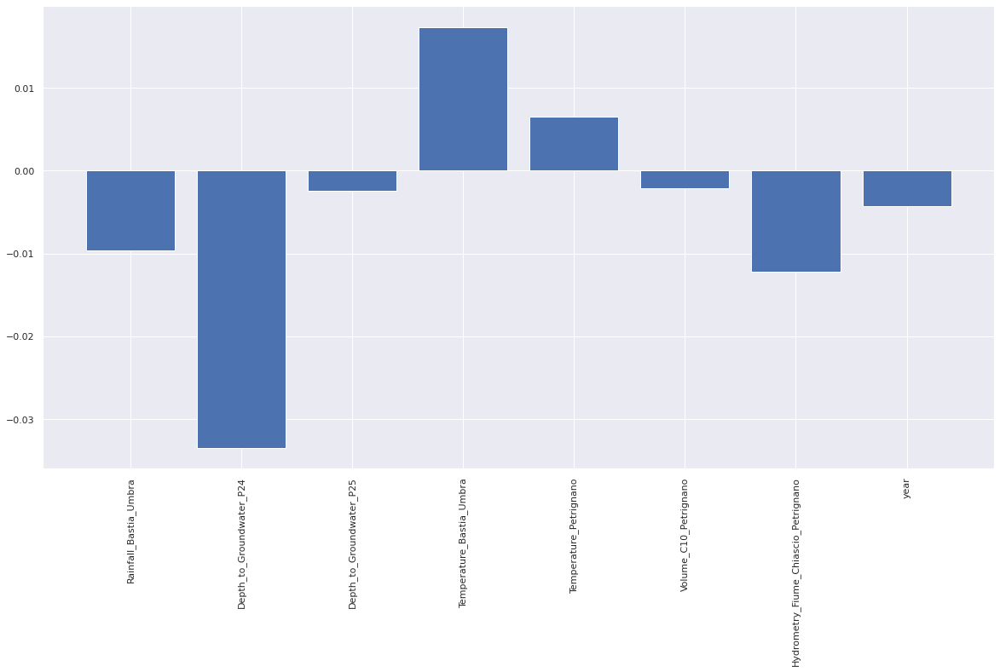

Selected Features - (array([1]),)
foo shape - (3655, 1, 1, 1)
Train reshape - (3655, 1, 1)
foo shape - (1567, 1, 1, 1)
Test reshape - (1567, 1, 1)
Epoch 1/100
115/115 - 0s - loss: 0.2071 - val_loss: 0.0809
Epoch 2/100
115/115 - 0s - loss: 0.0400 - val_loss: 0.0025
Epoch 3/100
115/115 - 0s - loss: 0.0243 - val_loss: 0.0037
Epoch 4/100
115/115 - 0s - loss: 0.0212 - val_loss: 0.0037
Epoch 5/100
115/115 - 0s - loss: 0.0170 - val_loss: 0.0034
Epoch 6/100
115/115 - 0s - loss: 0.0132 - val_loss: 0.0029
Epoch 7/100
115/115 - 0s - loss: 0.0099 - val_loss: 0.0023
Epoch 8/100
115/115 - 0s - loss: 0.0071 - val_loss: 0.0017
Epoch 9/100
115/115 - 0s - loss: 0.0049 - val_loss: 0.0010
Epoch 10/100
115/115 - 0s - loss: 0.0033 - val_loss: 4.9677e-04
Epoch 11/100
115/115 - 0s - loss: 0.0022 - val_loss: 1.9080e-04
Epoch 12/100
115/115 - 0s - loss: 0.0015 - val_loss: 9.7183e-05
Epoch 13/100
115/115 - 0s - loss: 0.0011 - val_loss: 1.7299e-04
Epoch 14/100
115/115 - 0s - loss: 7.8812e-04 - val_loss: 3.5304e-0

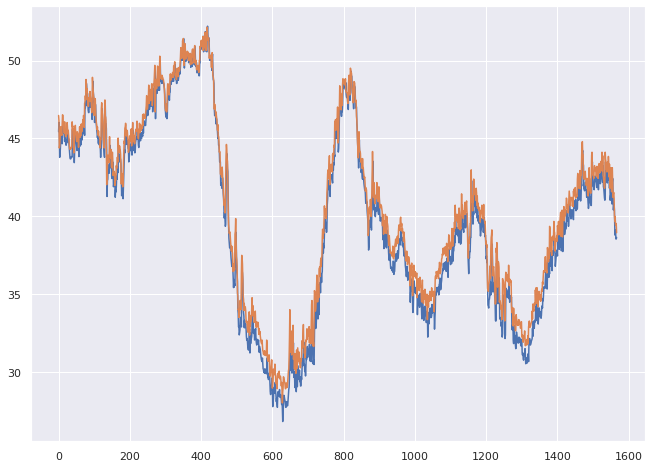

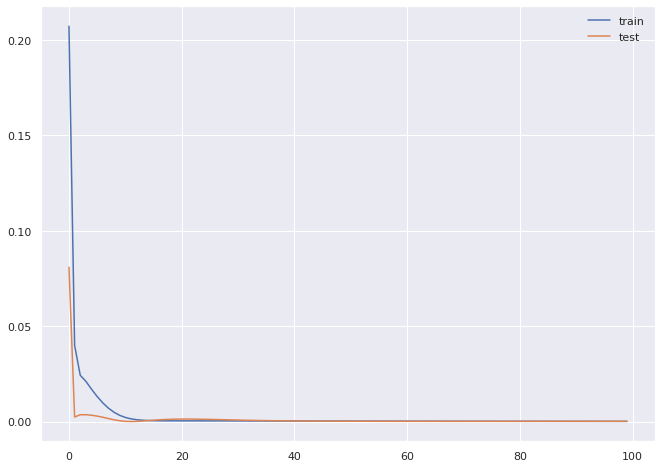

Dataset for imputation -            Date  Rainfall_S_Piero  Rainfall_Mangona  ...  Flow_Rate  year  month
0    2002-06-03               NaN               NaN  ...       0.31  2002    Jun
1    2002-06-04               NaN               NaN  ...       0.31  2002    Jun
2    2002-06-05               NaN               NaN  ...       0.31  2002    Jun
3    2002-06-06               NaN               NaN  ...       0.31  2002    Jun
4    2002-06-07               NaN               NaN  ...       0.31  2002    Jun
...         ...               ...               ...  ...        ...   ...    ...
6598 2020-06-26               NaN               NaN  ...       0.60  2020    Jun
6599 2020-06-27               NaN               NaN  ...       0.60  2020    Jun
6600 2020-06-28               NaN               NaN  ...       0.60  2020    Jun
6601 2020-06-29               NaN               NaN  ...       0.60  2020    Jun
6602 2020-06-30               NaN               NaN  ...       0.60  2020    Jun

[6

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


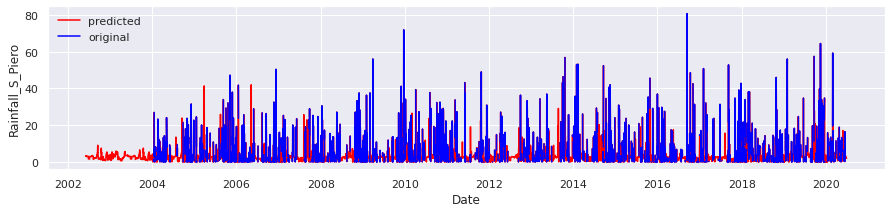

(2204, 8)
(2204,)


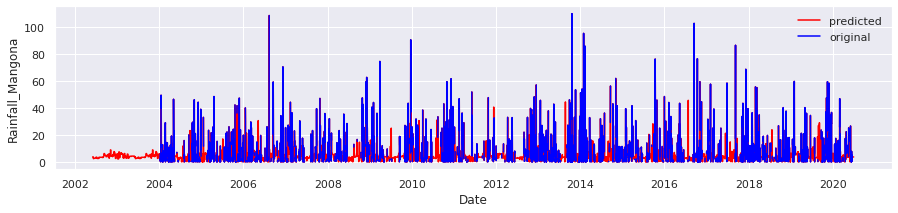

(2271, 8)
(2271,)


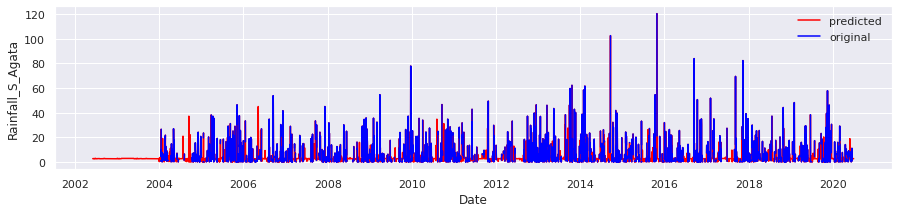

(1902, 8)
(1902,)


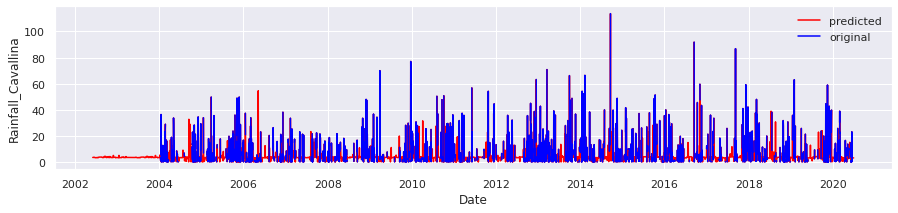

(2247, 8)
(2247,)


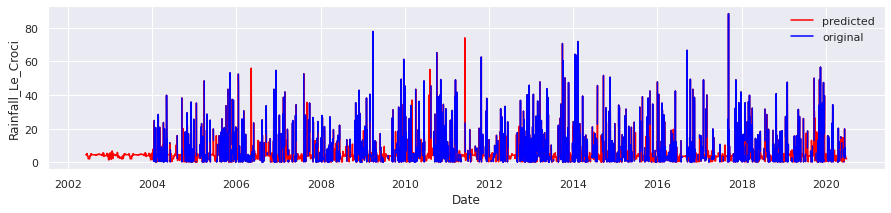

(6024, 8)
(6024,)


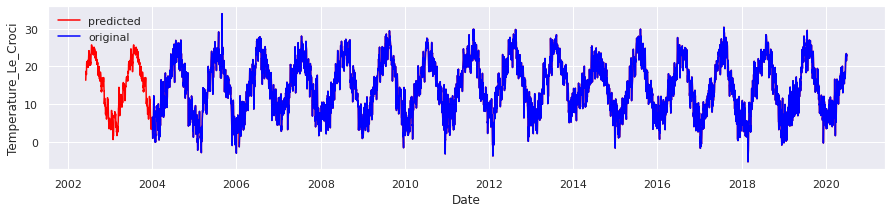

(6603, 8)
(6603,)


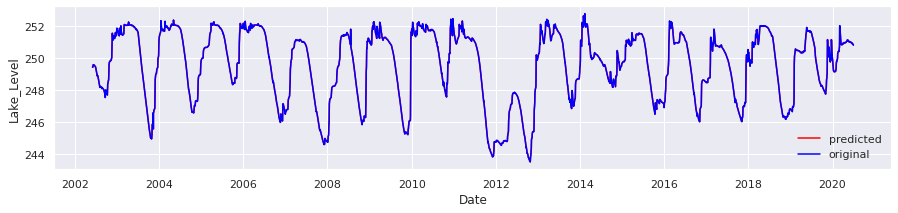

(6582, 8)
(6582,)


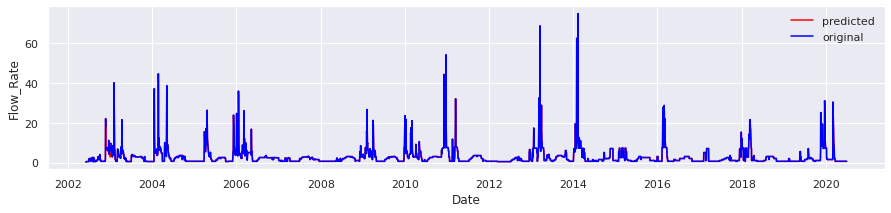

target Attributes - ['Lake_Level', 'Flow_Rate']
Index(['Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate', 'year'],
      dtype='object')
-0.0024875624 0.012437811
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var7(t)',
       'var8(t)'],
      dtype='object')
4621 1981
(4621, 1, 9) (4621,) (1981, 1, 9) (1981,)
[-0.01560217  0.04097411  0.00881895 -0.01093611  0.00957911  0.03846888
  0.02147423  0.01284693  0.01695988]
Mean: 0.013620423
Standard Deviation: 0.018059997


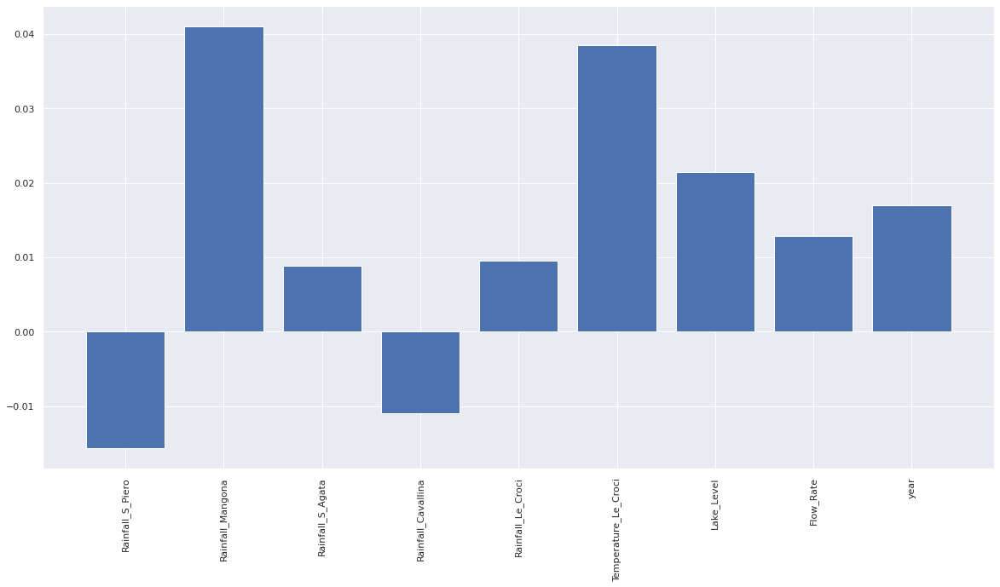

Selected Features - (array([1, 5, 6]),)
foo shape - (4621, 1, 1, 3)
Train reshape - (4621, 1, 3)
foo shape - (1981, 1, 1, 3)
Test reshape - (1981, 1, 3)
Epoch 1/100
145/145 - 1s - loss: 0.0032 - val_loss: 0.0024
Epoch 2/100
145/145 - 0s - loss: 0.0029 - val_loss: 0.0024
Epoch 3/100
145/145 - 0s - loss: 0.0027 - val_loss: 0.0023
Epoch 4/100
145/145 - 0s - loss: 0.0026 - val_loss: 0.0023
Epoch 5/100
145/145 - 0s - loss: 0.0026 - val_loss: 0.0023
Epoch 6/100
145/145 - 0s - loss: 0.0025 - val_loss: 0.0024
Epoch 7/100
145/145 - 0s - loss: 0.0024 - val_loss: 0.0024
Epoch 8/100
145/145 - 0s - loss: 0.0024 - val_loss: 0.0025
Epoch 9/100
145/145 - 0s - loss: 0.0023 - val_loss: 0.0025
Epoch 10/100
145/145 - 0s - loss: 0.0023 - val_loss: 0.0025
Epoch 11/100
145/145 - 0s - loss: 0.0023 - val_loss: 0.0026
Epoch 12/100
145/145 - 0s - loss: 0.0022 - val_loss: 0.0026
Epoch 13/100
145/145 - 0s - loss: 0.0022 - val_loss: 0.0026
Epoch 14/100
145/145 - 0s - loss: 0.0022 - val_loss: 0.0026
Epoch 15/100
145

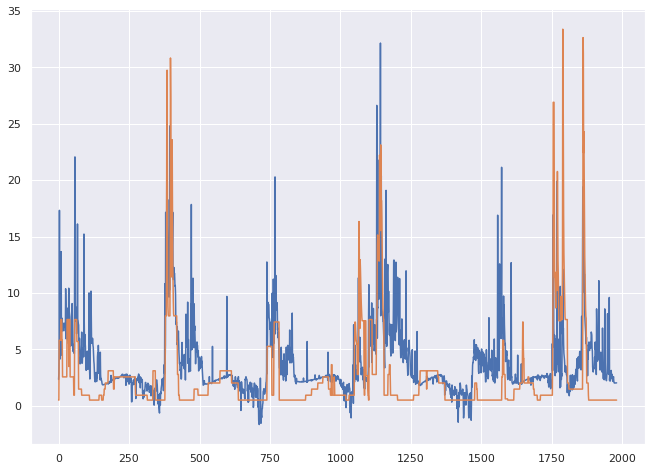

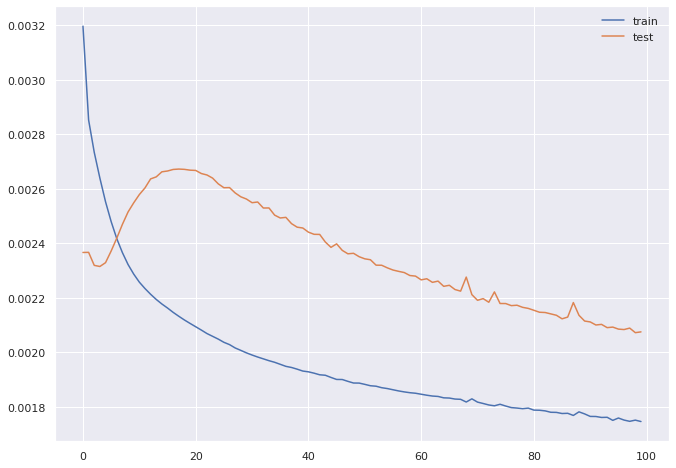

4621 1981
(4621, 1, 9) (4621,) (1981, 1, 9) (1981,)
[-1.4740327e-02  9.1083702e-03 -1.6288335e-02 -8.0090227e-05
 -8.7314453e-03  9.3518207e-03 -1.5044200e-02  3.4726601e-02
  6.2434939e-03]
Mean: 0.0005050987
Standard Deviation: 0.015628325


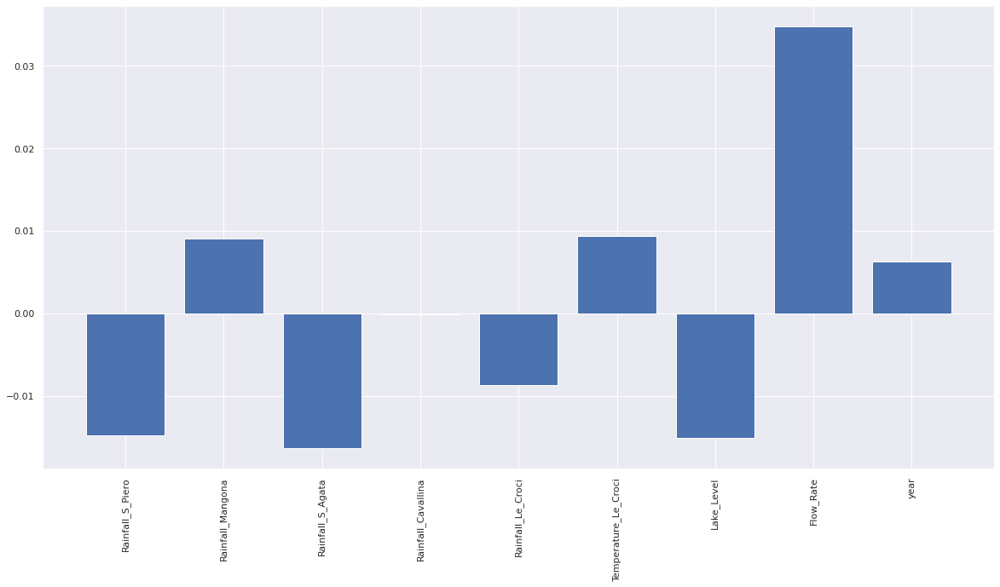

Selected Features - (array([7]),)
foo shape - (4621, 1, 1, 1)
Train reshape - (4621, 1, 1)
foo shape - (1981, 1, 1, 1)
Test reshape - (1981, 1, 1)
Epoch 1/100
145/145 - 1s - loss: 0.3254 - val_loss: 0.1507
Epoch 2/100
145/145 - 0s - loss: 0.0943 - val_loss: 0.0410
Epoch 3/100
145/145 - 0s - loss: 0.0624 - val_loss: 0.0377
Epoch 4/100
145/145 - 0s - loss: 0.0614 - val_loss: 0.0378
Epoch 5/100
145/145 - 0s - loss: 0.0611 - val_loss: 0.0379
Epoch 6/100
145/145 - 0s - loss: 0.0609 - val_loss: 0.0380
Epoch 7/100
145/145 - 0s - loss: 0.0607 - val_loss: 0.0381
Epoch 8/100
145/145 - 0s - loss: 0.0606 - val_loss: 0.0383
Epoch 9/100
145/145 - 0s - loss: 0.0605 - val_loss: 0.0384
Epoch 10/100
145/145 - 0s - loss: 0.0604 - val_loss: 0.0384
Epoch 11/100
145/145 - 0s - loss: 0.0602 - val_loss: 0.0385
Epoch 12/100
145/145 - 0s - loss: 0.0601 - val_loss: 0.0386
Epoch 13/100
145/145 - 0s - loss: 0.0599 - val_loss: 0.0386
Epoch 14/100
145/145 - 0s - loss: 0.0597 - val_loss: 0.0386
Epoch 15/100
145/145 -

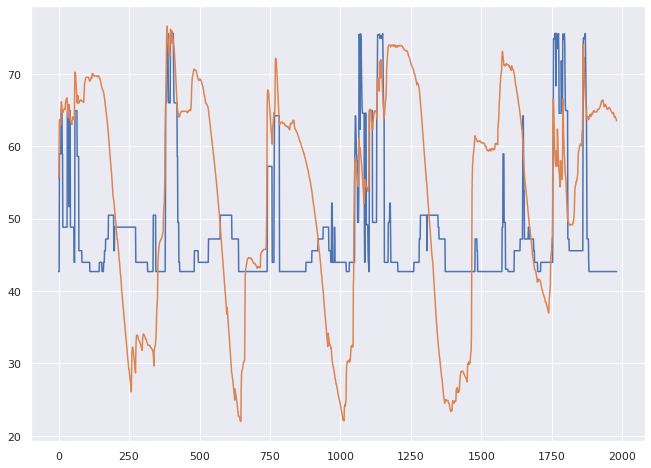

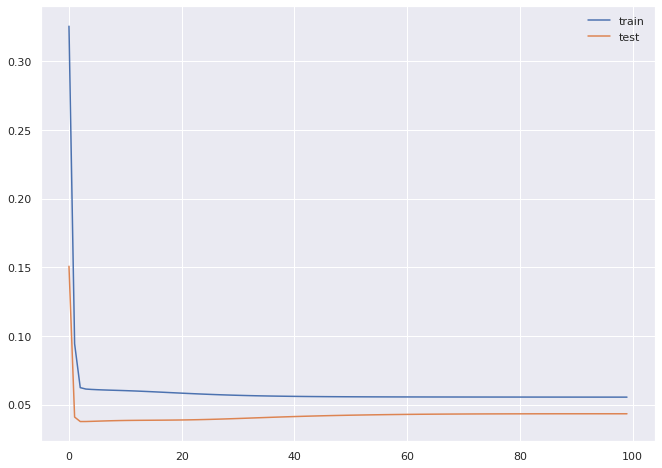

Dataset for imputation -            Date  Rainfall_Le_Croci  ...  year  month
0    1998-01-01                NaN  ...  1998    Jan
1    1998-01-02                NaN  ...  1998    Jan
2    1998-01-03                NaN  ...  1998    Jan
3    1998-01-04                NaN  ...  1998    Jan
4    1998-01-05                NaN  ...  1998    Jan
...         ...                ...  ...   ...    ...
8212 2020-06-26                NaN  ...  2020    Jun
8213 2020-06-27                NaN  ...  2020    Jun
8214 2020-06-28                NaN  ...  2020    Jun
8215 2020-06-29                NaN  ...  2020    Jun
8216 2020-06-30                NaN  ...  2020    Jun

[8217 rows x 19 columns]
(2247, 8)
(2247,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


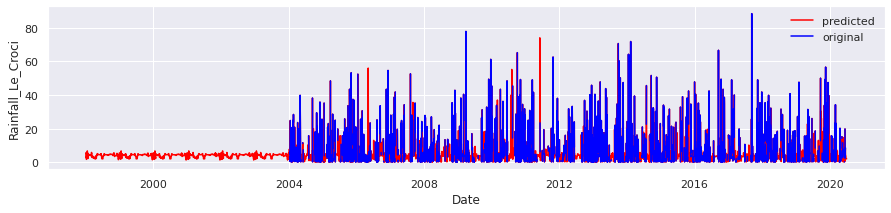

(1902, 8)
(1902,)


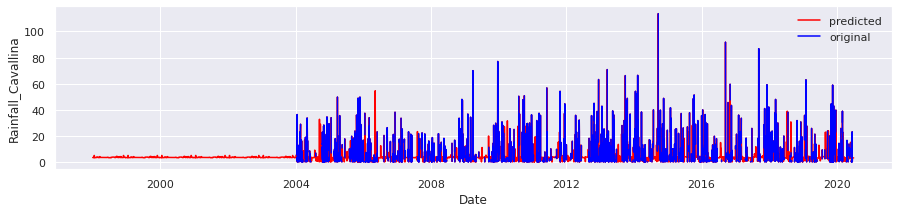

(2271, 8)
(2271,)


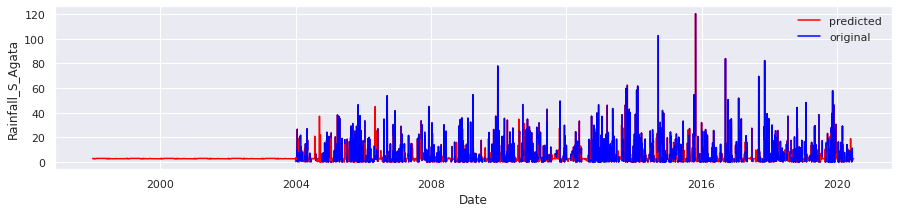

(2204, 8)
(2204,)


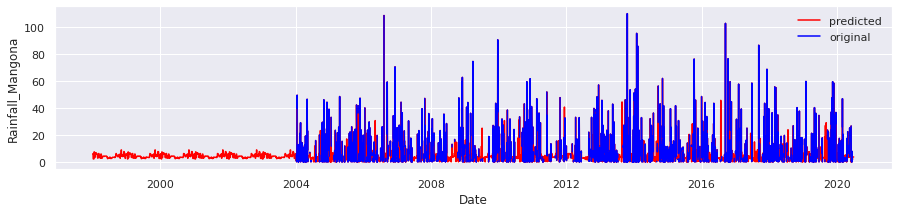

(2347, 8)
(2347,)


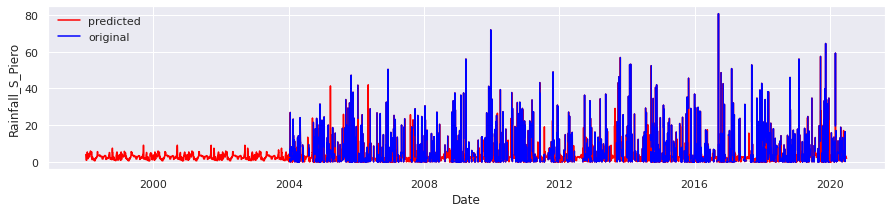

(1617, 8)
(1617,)


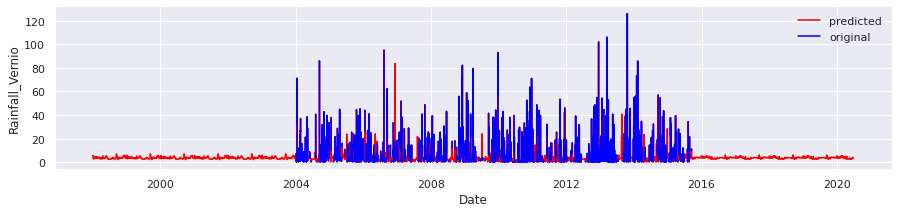

(478, 8)
(478,)


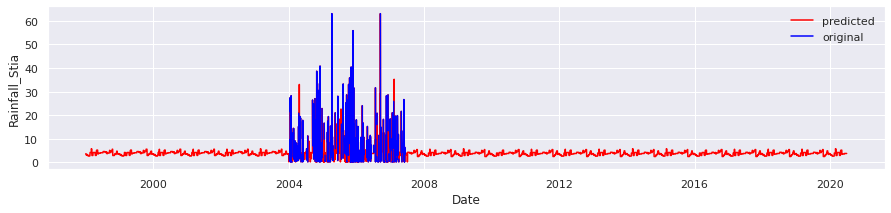

(549, 8)
(549,)


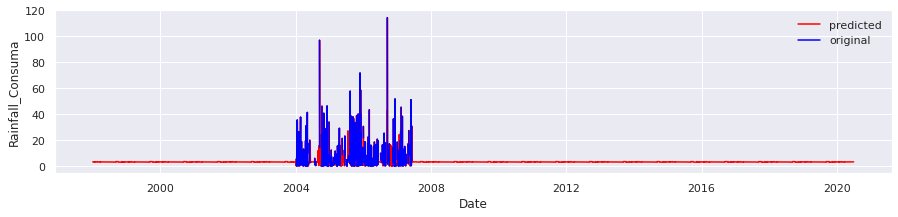

(1699, 8)
(1699,)


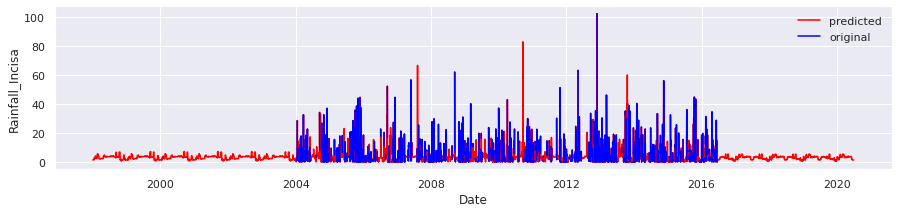

(565, 8)
(565,)


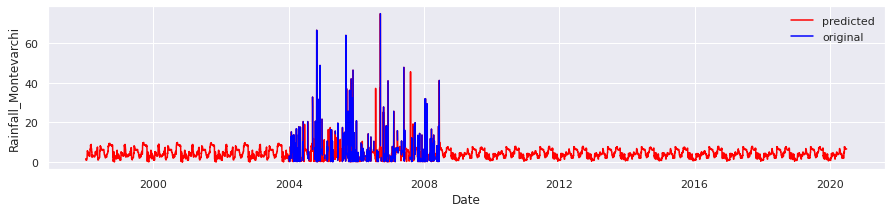

(520, 8)
(520,)


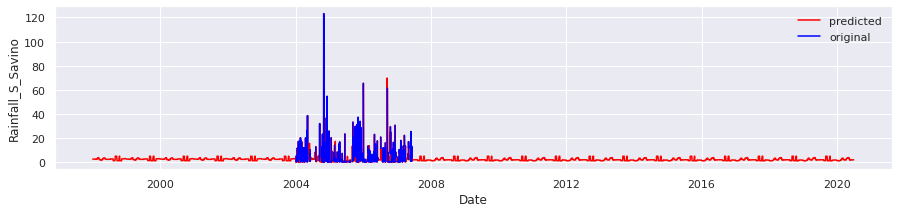

(441, 8)
(441,)


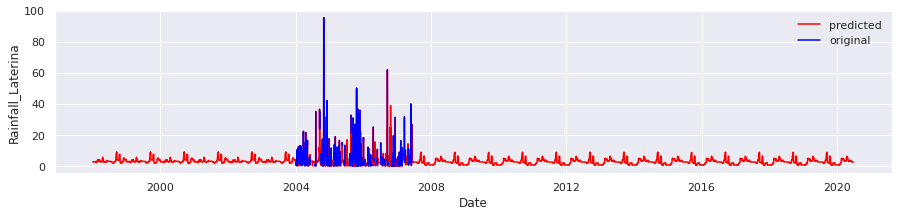

(876, 8)
(876,)


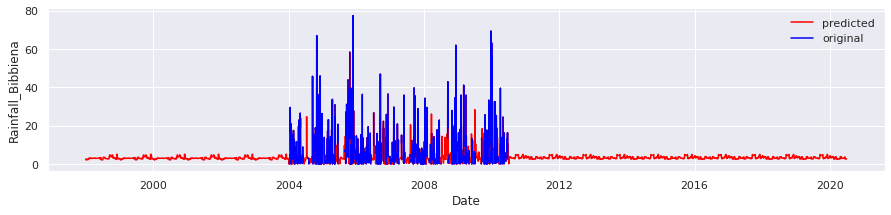

(540, 8)
(540,)


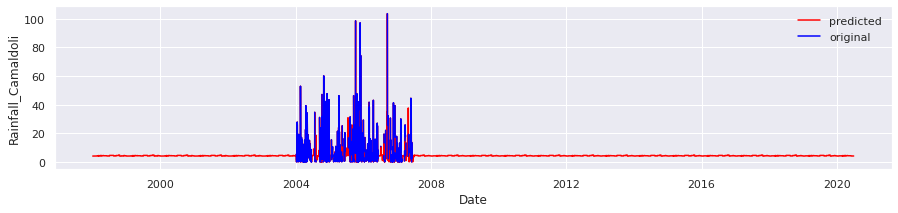

(6192, 8)
(6192,)


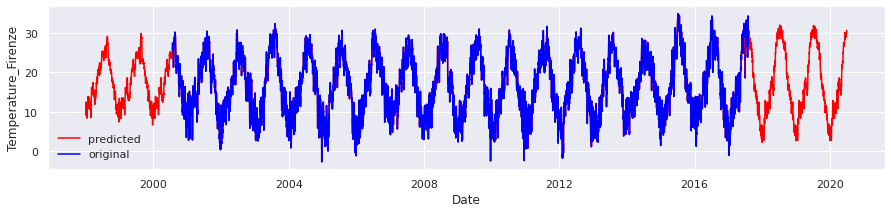

(7982, 8)
(7982,)


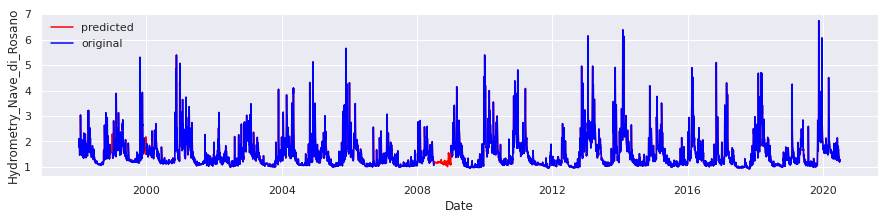

target Attributes - ['Hydrometry_Nave_di_Rosano']
Index(['Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano', 'year'],
      dtype='object')
-0.0022675737 0.011337868
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', 'var17(t-1)', 'var16(t)'],
      dtype='object')
5751 2465
(5751, 1, 17) (5751,) (2465, 1, 17) (2465,)
[-0.0097926  -0.01540878 -0.01078468 -0.01877826 -0.04504894 -0.01684956
 -0.01606426  0.04212834 -0.00096419 -0.03368314  0.01609776 -0.00789434
 -0.01186309 -0.0014

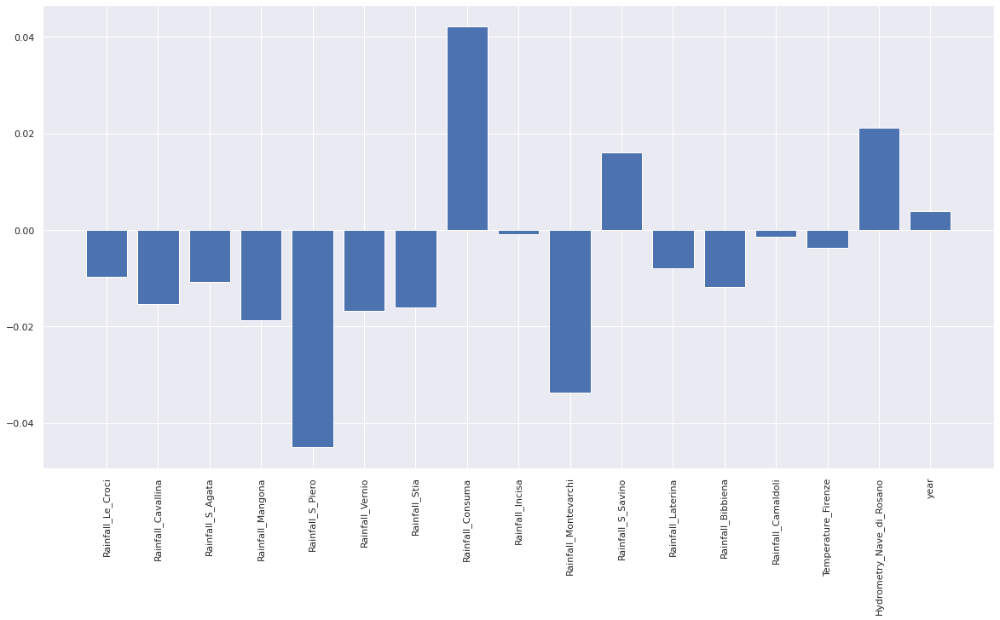

Selected Features - (array([ 4,  7,  9, 15]),)
foo shape - (5751, 1, 1, 4)
Train reshape - (5751, 1, 4)
foo shape - (2465, 1, 1, 4)
Test reshape - (2465, 1, 4)
Epoch 1/100
180/180 - 1s - loss: 0.0093 - val_loss: 0.0068
Epoch 2/100
180/180 - 0s - loss: 0.0045 - val_loss: 0.0037
Epoch 3/100
180/180 - 0s - loss: 0.0025 - val_loss: 0.0023
Epoch 4/100
180/180 - 0s - loss: 0.0019 - val_loss: 0.0021
Epoch 5/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 6/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 7/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 8/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 9/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 10/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 11/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 12/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 13/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0022
Epoch 14/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0022
Epoch 15/

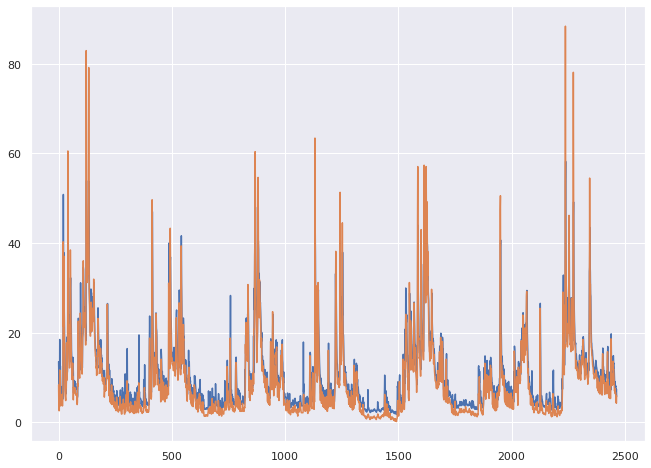

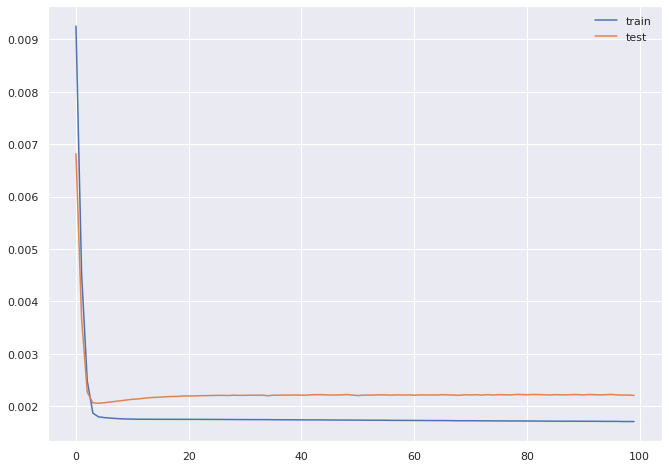

Dataset for imputation -            Date  Rainfall_Castel_del_Piano  ...  year  month
5479 2015-01-01                        NaN  ...  2015    Jan
5480 2015-01-02                        NaN  ...  2015    Jan
5481 2015-01-03                        NaN  ...  2015    Jan
5482 2015-01-04                        NaN  ...  2015    Jan
5483 2015-01-05                        NaN  ...  2015    Jan
...         ...                        ...  ...   ...    ...
7482 2020-06-26                        NaN  ...  2020    Jun
7483 2020-06-27                        NaN  ...  2020    Jun
7484 2020-06-28                        NaN  ...  2020    Jun
7485 2020-06-29                        NaN  ...  2020    Jun
7486 2020-06-30                        NaN  ...  2020    Jun

[2008 rows x 18 columns]
(613, 8)
(613,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


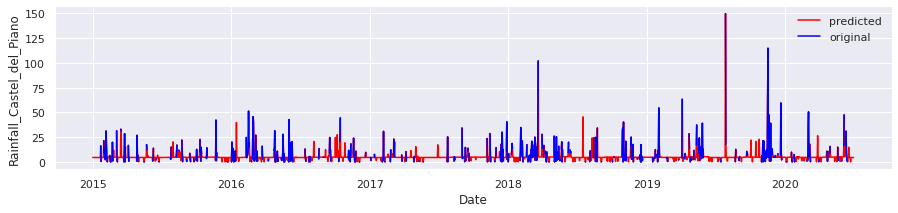

(610, 8)
(610,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


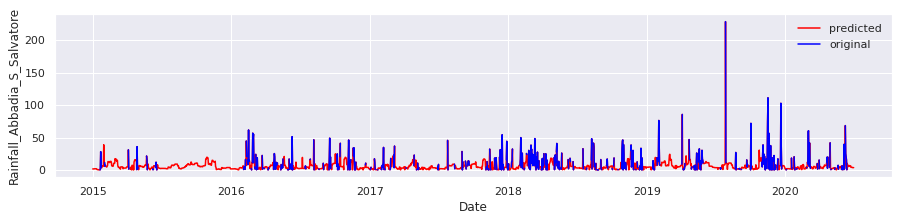

(643, 8)
(643,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


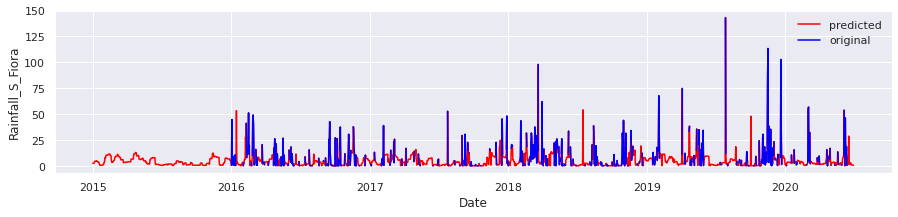

(889, 8)
(889,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


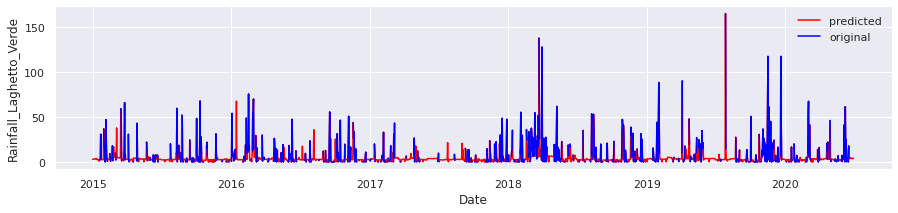

(863, 8)
(863,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


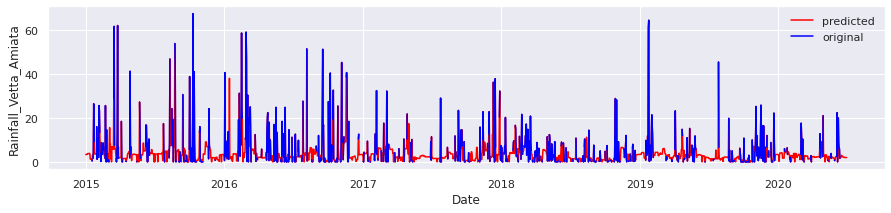

(1412, 8)
(1412,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


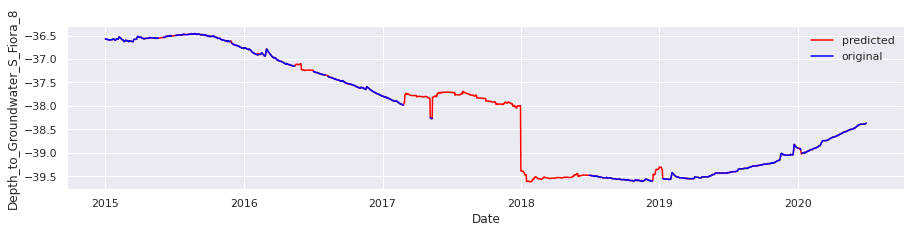

(1495, 8)
(1495,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


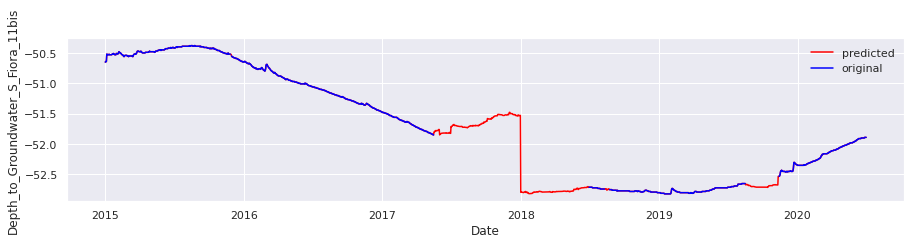

(1996, 8)
(1996,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


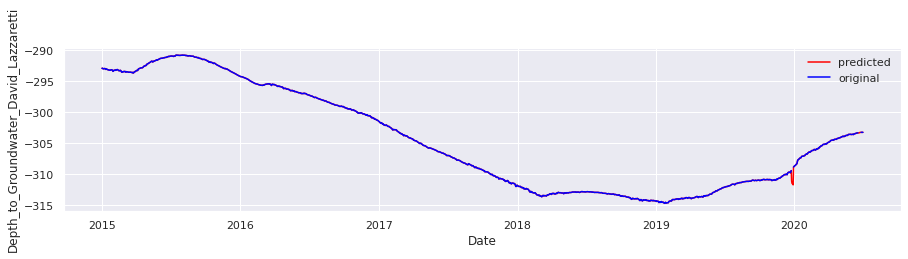

(1759, 8)
(1759,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


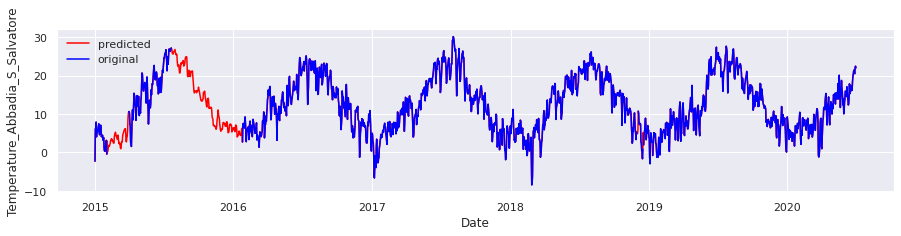

(2007, 8)
(2007,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


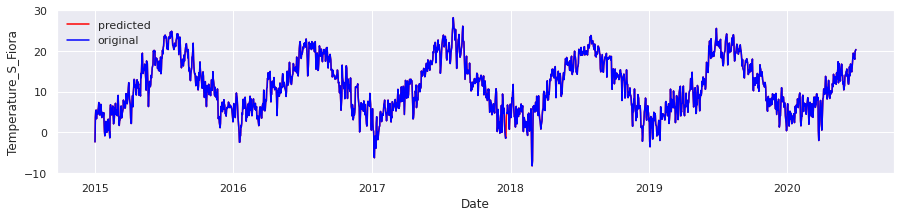

(2003, 8)
(2003,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


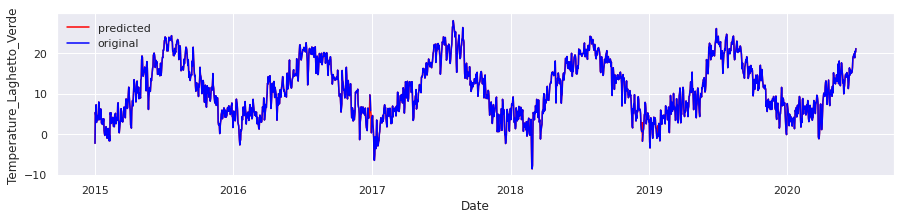

(1642, 8)
(1642,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


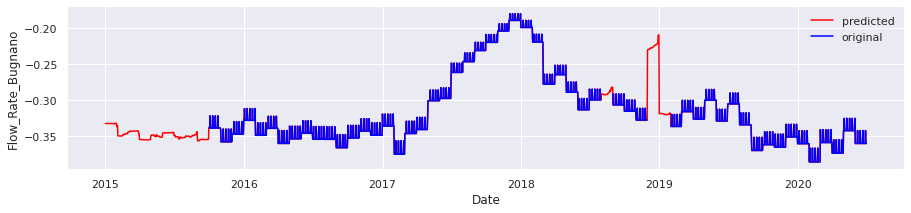

(1642, 8)
(1642,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


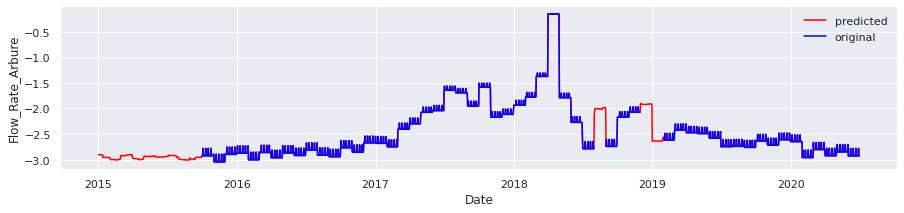

(1887, 8)
(1887,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


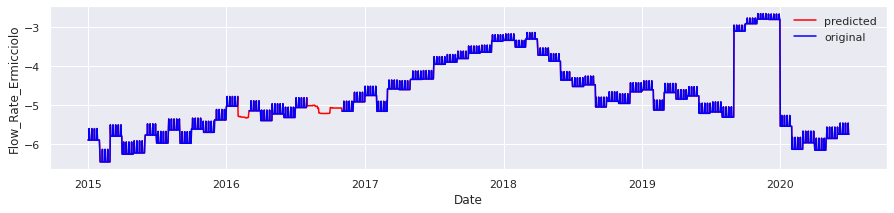

(2008, 8)
(2008,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


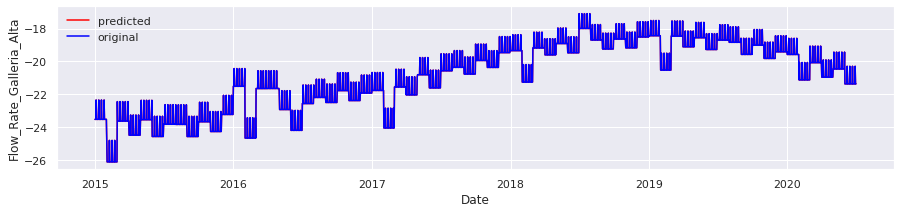


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Index(['Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta', 'year'],
      dtype='object')
-0.0013386881 0.00669344
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', 'var12(t)', 'var13(t)', 'var14(t)', 'var15(t)'],
      dtype='object')
1404 603
(1404, 1, 16) (1404,) (603, 1, 16

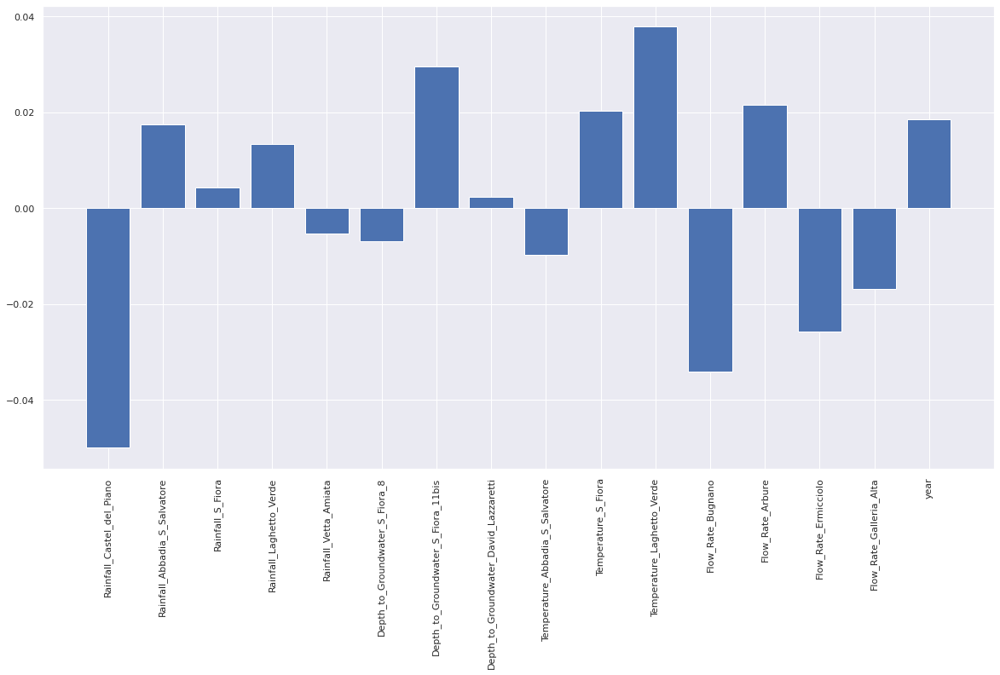

Selected Features - (array([ 0,  6,  9, 10, 11, 12, 13]),)
foo shape - (1404, 1, 1, 7)
Train reshape - (1404, 1, 7)
foo shape - (603, 1, 1, 7)
Test reshape - (603, 1, 7)
Epoch 1/100
44/44 - 0s - loss: 0.1897 - val_loss: 0.3307
Epoch 2/100
44/44 - 0s - loss: 0.0601 - val_loss: 0.1468
Epoch 3/100
44/44 - 0s - loss: 0.0388 - val_loss: 0.1008
Epoch 4/100
44/44 - 0s - loss: 0.0339 - val_loss: 0.0921
Epoch 5/100
44/44 - 0s - loss: 0.0265 - val_loss: 0.0877
Epoch 6/100
44/44 - 0s - loss: 0.0226 - val_loss: 0.0844
Epoch 7/100
44/44 - 0s - loss: 0.0206 - val_loss: 0.0813
Epoch 8/100
44/44 - 0s - loss: 0.0195 - val_loss: 0.0778
Epoch 9/100
44/44 - 0s - loss: 0.0188 - val_loss: 0.0744
Epoch 10/100
44/44 - 0s - loss: 0.0181 - val_loss: 0.0711
Epoch 11/100
44/44 - 0s - loss: 0.0176 - val_loss: 0.0680
Epoch 12/100
44/44 - 0s - loss: 0.0170 - val_loss: 0.0650
Epoch 13/100
44/44 - 0s - loss: 0.0165 - val_loss: 0.0622
Epoch 14/100
44/44 - 0s - loss: 0.0161 - val_loss: 0.0595
Epoch 15/100
44/44 - 0s - l

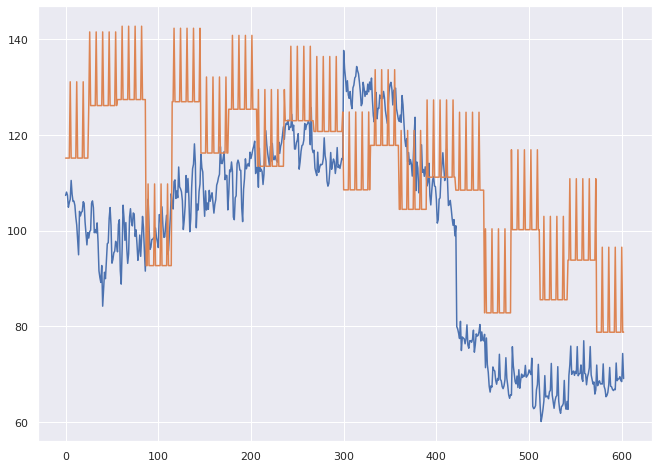

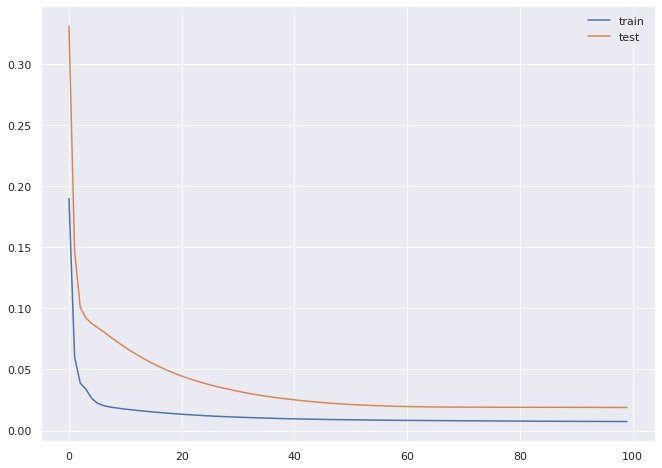

1404 603
(1404, 1, 16) (1404,) (603, 1, 16) (603,)
[ 2.6498400e-02  2.0664588e-03 -3.2621108e-02 -7.6714978e-03
  4.8737481e-02  2.3637574e-02 -2.7994389e-02 -3.7948489e-02
 -3.4505412e-02  4.6034683e-03  5.3116764e-05  1.4841008e-03
 -2.5393043e-02  1.5009426e-02  4.0813252e-02 -1.3792574e-02]
Mean: -0.0010639522
Standard Deviation: 0.026111815


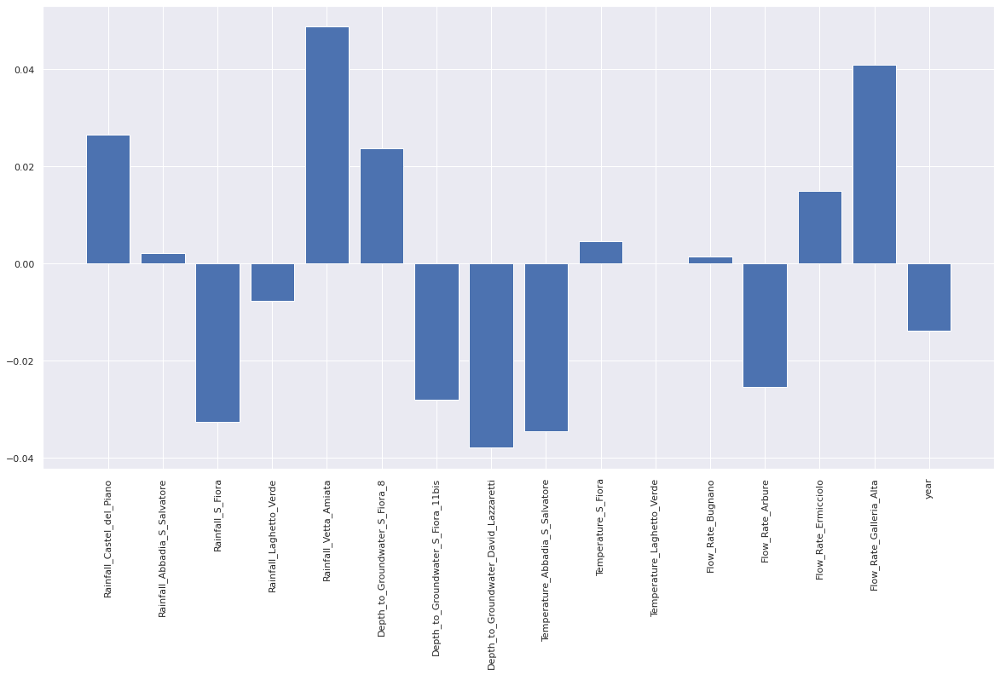

Selected Features - (array([ 0,  2,  4,  5,  6,  7,  8, 12, 14]),)
foo shape - (1404, 1, 1, 9)
Train reshape - (1404, 1, 9)
foo shape - (603, 1, 1, 9)
Test reshape - (603, 1, 9)
Epoch 1/100
44/44 - 0s - loss: 0.1432 - val_loss: 0.1398
Epoch 2/100
44/44 - 0s - loss: 0.0643 - val_loss: 0.0927
Epoch 3/100
44/44 - 0s - loss: 0.0563 - val_loss: 0.0805
Epoch 4/100
44/44 - 0s - loss: 0.0409 - val_loss: 0.0755
Epoch 5/100
44/44 - 0s - loss: 0.0296 - val_loss: 0.0757
Epoch 6/100
44/44 - 0s - loss: 0.0222 - val_loss: 0.0781
Epoch 7/100
44/44 - 0s - loss: 0.0176 - val_loss: 0.0811
Epoch 8/100
44/44 - 0s - loss: 0.0153 - val_loss: 0.0825
Epoch 9/100
44/44 - 0s - loss: 0.0139 - val_loss: 0.0832
Epoch 10/100
44/44 - 0s - loss: 0.0133 - val_loss: 0.0833
Epoch 11/100
44/44 - 0s - loss: 0.0127 - val_loss: 0.0831
Epoch 12/100
44/44 - 0s - loss: 0.0123 - val_loss: 0.0828
Epoch 13/100
44/44 - 0s - loss: 0.0119 - val_loss: 0.0824
Epoch 14/100
44/44 - 0s - loss: 0.0116 - val_loss: 0.0819
Epoch 15/100
44/44 

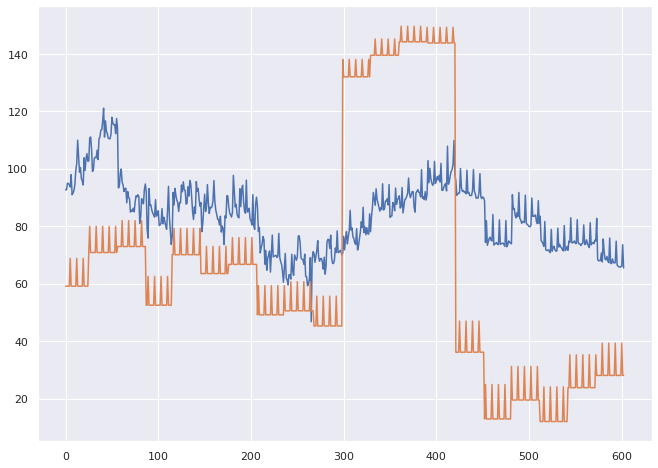

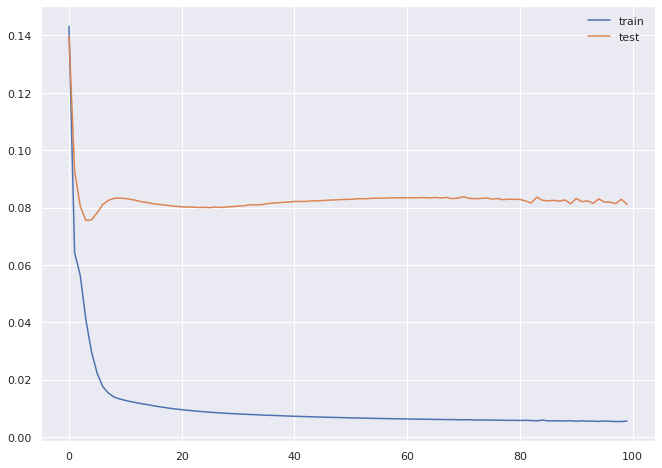

1404 603
(1404, 1, 16) (1404,) (603, 1, 16) (603,)
[-0.04882442 -0.01793138  0.02150743  0.01273569  0.00046598  0.01021492
  0.01090857  0.00081132  0.01017533  0.01047416 -0.01410014  0.0147552
 -0.00144238  0.01469415  0.00251469 -0.01881768]
Mean: 0.000508841
Standard Deviation: 0.017245295


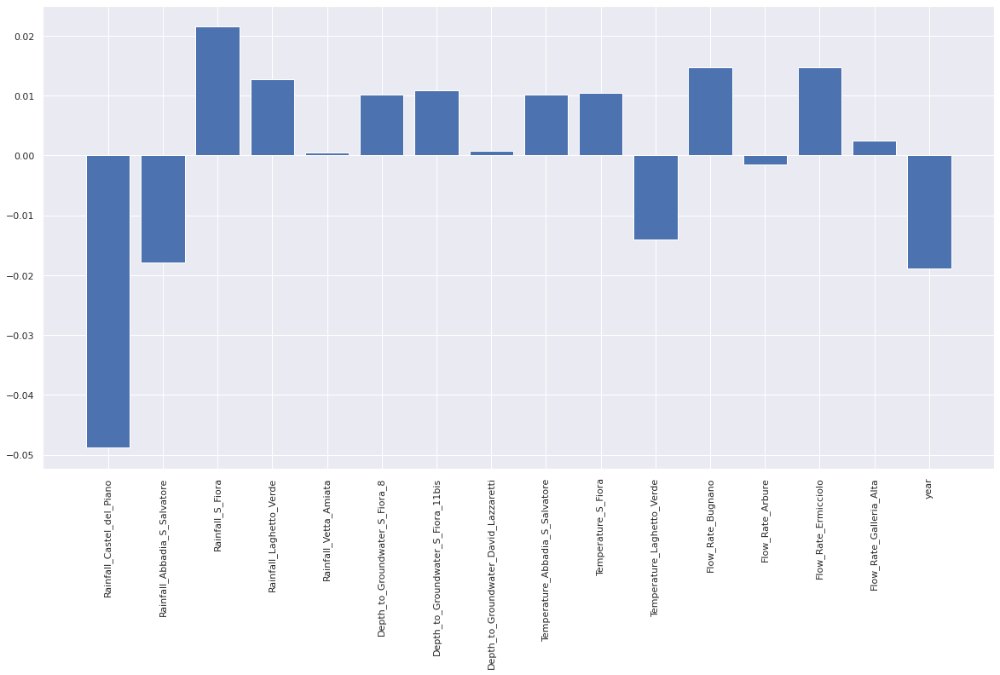

Selected Features - (array([0, 2]),)
foo shape - (1404, 1, 1, 2)
Train reshape - (1404, 1, 2)
foo shape - (603, 1, 1, 2)
Test reshape - (603, 1, 2)
Epoch 1/100
44/44 - 0s - loss: 0.0566 - val_loss: 0.0093
Epoch 2/100
44/44 - 0s - loss: 0.0457 - val_loss: 0.0079
Epoch 3/100
44/44 - 0s - loss: 0.0438 - val_loss: 0.0091
Epoch 4/100
44/44 - 0s - loss: 0.0437 - val_loss: 0.0103
Epoch 5/100
44/44 - 0s - loss: 0.0440 - val_loss: 0.0110
Epoch 6/100
44/44 - 0s - loss: 0.0442 - val_loss: 0.0113
Epoch 7/100
44/44 - 0s - loss: 0.0443 - val_loss: 0.0115
Epoch 8/100
44/44 - 0s - loss: 0.0443 - val_loss: 0.0116
Epoch 9/100
44/44 - 0s - loss: 0.0443 - val_loss: 0.0116
Epoch 10/100
44/44 - 0s - loss: 0.0443 - val_loss: 0.0116
Epoch 11/100
44/44 - 0s - loss: 0.0442 - val_loss: 0.0116
Epoch 12/100
44/44 - 0s - loss: 0.0442 - val_loss: 0.0116
Epoch 13/100
44/44 - 0s - loss: 0.0442 - val_loss: 0.0116
Epoch 14/100
44/44 - 0s - loss: 0.0442 - val_loss: 0.0116
Epoch 15/100
44/44 - 0s - loss: 0.0442 - val_loss

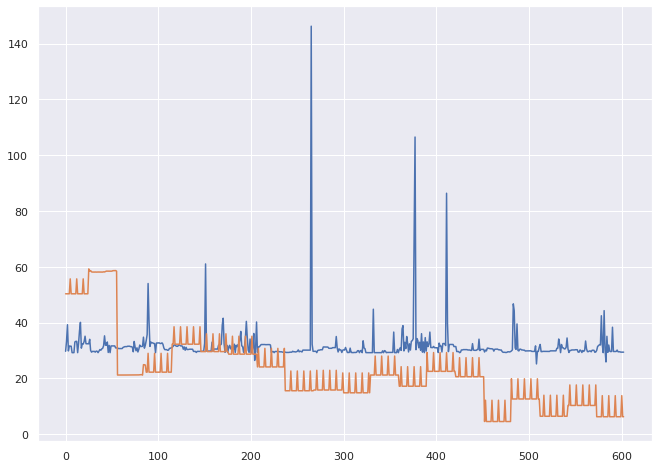

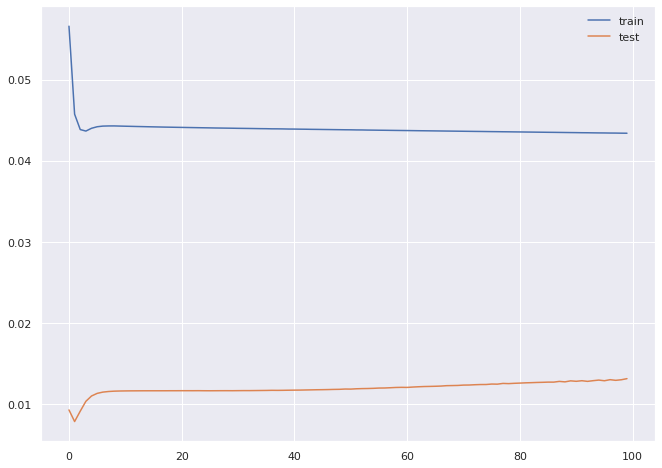

1404 603
(1404, 1, 16) (1404,) (603, 1, 16) (603,)
[ 0.03723798 -0.03051738 -0.04871691 -0.03513552 -0.02804471  0.00958636
  0.02602432  0.00094118 -0.02666275 -0.00705314  0.01241622 -0.02764574
  0.03317185  0.00417354 -0.00062436 -0.02065144]
Mean: -0.006343782
Standard Deviation: 0.025077676


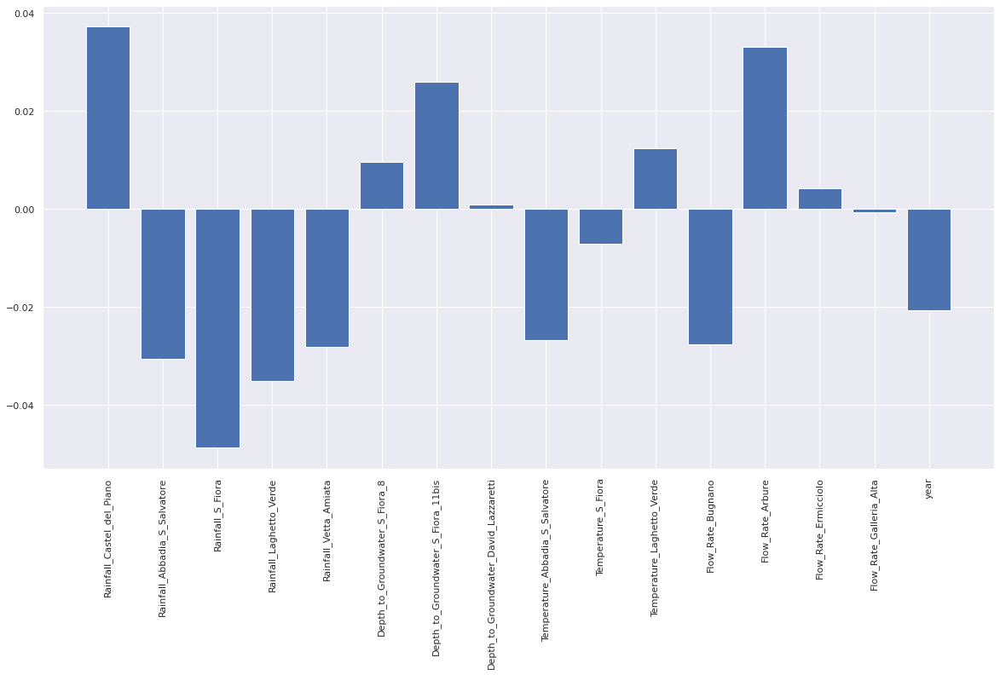

Selected Features - (array([ 0,  1,  2,  3,  4,  6,  8, 11, 12, 15]),)
foo shape - (1404, 1, 1, 10)
Train reshape - (1404, 1, 10)
foo shape - (603, 1, 1, 10)
Test reshape - (603, 1, 10)
Epoch 1/100
44/44 - 0s - loss: 0.1122 - val_loss: 0.0301
Epoch 2/100
44/44 - 0s - loss: 0.0535 - val_loss: 0.0389
Epoch 3/100
44/44 - 0s - loss: 0.0407 - val_loss: 0.0567
Epoch 4/100
44/44 - 0s - loss: 0.0339 - val_loss: 0.0673
Epoch 5/100
44/44 - 0s - loss: 0.0274 - val_loss: 0.0712
Epoch 6/100
44/44 - 0s - loss: 0.0223 - val_loss: 0.0715
Epoch 7/100
44/44 - 0s - loss: 0.0183 - val_loss: 0.0684
Epoch 8/100
44/44 - 0s - loss: 0.0158 - val_loss: 0.0620
Epoch 9/100
44/44 - 0s - loss: 0.0138 - val_loss: 0.0541
Epoch 10/100
44/44 - 0s - loss: 0.0121 - val_loss: 0.0463
Epoch 11/100
44/44 - 0s - loss: 0.0104 - val_loss: 0.0381
Epoch 12/100
44/44 - 0s - loss: 0.0089 - val_loss: 0.0314
Epoch 13/100
44/44 - 0s - loss: 0.0075 - val_loss: 0.0248
Epoch 14/100
44/44 - 0s - loss: 0.0064 - val_loss: 0.0195
Epoch 15/10

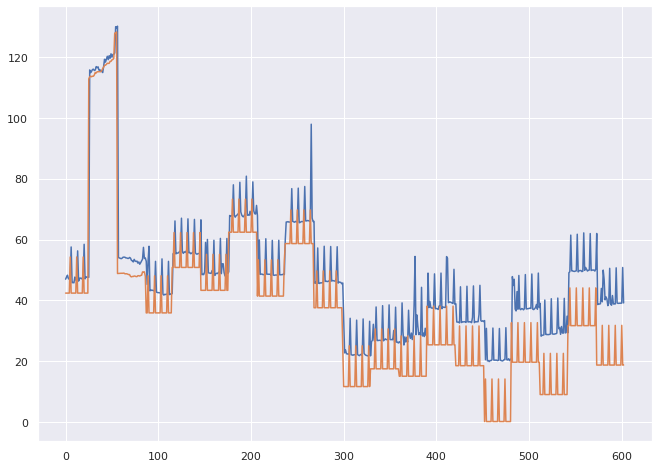

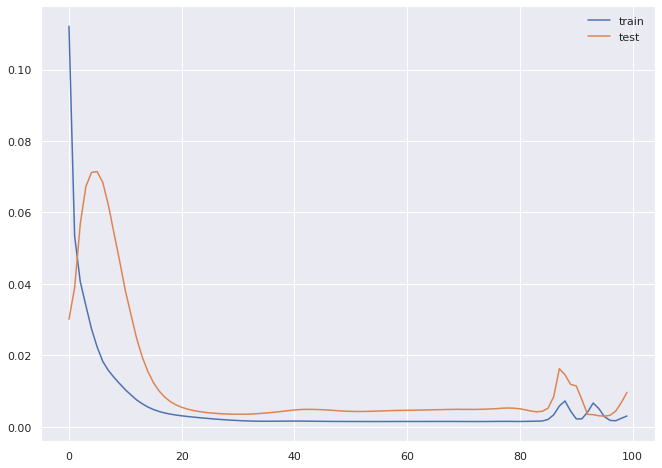

Dataset for imputation -            Date  Rainfall_Terni  Flow_Rate_Lupa  year month
0    2009-01-01           2.797             NaN  2009   Jan
1    2009-01-02           2.797             NaN  2009   Jan
2    2009-01-03           2.797             NaN  2009   Jan
3    2009-01-04           2.797             NaN  2009   Jan
4    2009-01-05           2.797             NaN  2009   Jan
...         ...             ...             ...   ...   ...
4194 2020-06-26             NaN          -73.93  2020   Jun
4195 2020-06-27             NaN          -73.60  2020   Jun
4196 2020-06-28             NaN          -73.14  2020   Jun
4197 2020-06-29             NaN          -72.88  2020   Jun
4198 2020-06-30             NaN          -72.55  2020   Jun

[4199 rows x 5 columns]
(4096, 8)
(4096,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


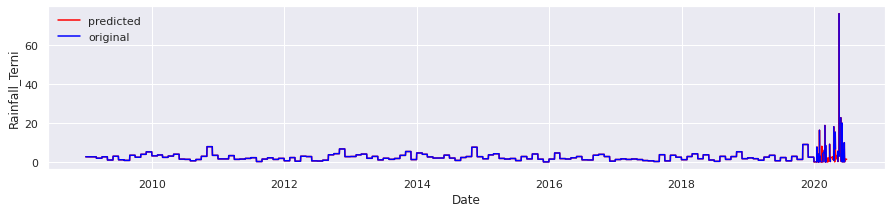

(3816, 8)
(3816,)


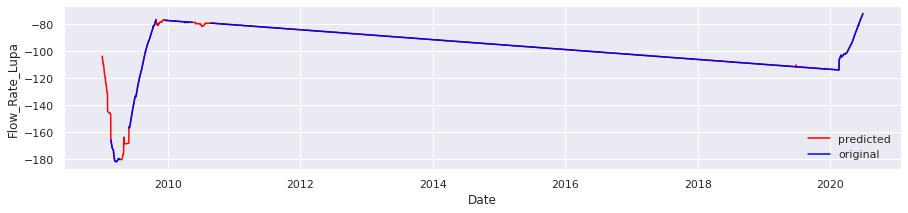

target Attributes - ['Flow_Rate_Lupa']
Index(['Rainfall_Terni', 'Flow_Rate_Lupa', 'year'], dtype='object')
-0.0024269284 0.013189828
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var2(t)'], dtype='object')
2938 1260
(2938, 1, 3) (2938,) (1260, 1, 3) (1260,)
[-0.01826121  0.04220463 -0.01141843]
Mean: 0.004174995
Standard Deviation: 0.027035728


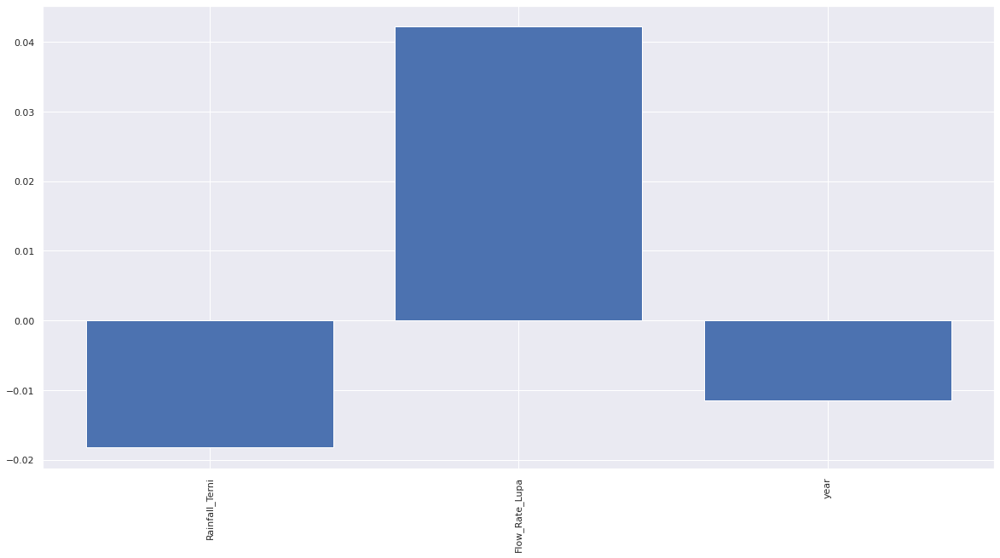

Selected Features - (array([1]),)
foo shape - (2938, 1, 1, 1)
Train reshape - (2938, 1, 1)
foo shape - (1260, 1, 1, 1)
Test reshape - (1260, 1, 1)
Epoch 1/100
92/92 - 0s - loss: 0.4951 - val_loss: 0.1886
Epoch 2/100
92/92 - 0s - loss: 0.1401 - val_loss: 0.0050
Epoch 3/100
92/92 - 0s - loss: 0.0110 - val_loss: 0.0034
Epoch 4/100
92/92 - 0s - loss: 0.0074 - val_loss: 0.0031
Epoch 5/100
92/92 - 0s - loss: 0.0072 - val_loss: 0.0027
Epoch 6/100
92/92 - 0s - loss: 0.0069 - val_loss: 0.0023
Epoch 7/100
92/92 - 0s - loss: 0.0066 - val_loss: 0.0020
Epoch 8/100
92/92 - 0s - loss: 0.0062 - val_loss: 0.0018
Epoch 9/100
92/92 - 0s - loss: 0.0058 - val_loss: 0.0015
Epoch 10/100
92/92 - 0s - loss: 0.0055 - val_loss: 0.0013
Epoch 11/100
92/92 - 0s - loss: 0.0051 - val_loss: 0.0011
Epoch 12/100
92/92 - 0s - loss: 0.0047 - val_loss: 9.6567e-04
Epoch 13/100
92/92 - 0s - loss: 0.0044 - val_loss: 8.2843e-04
Epoch 14/100
92/92 - 0s - loss: 0.0040 - val_loss: 7.0928e-04
Epoch 15/100
92/92 - 0s - loss: 0.0037

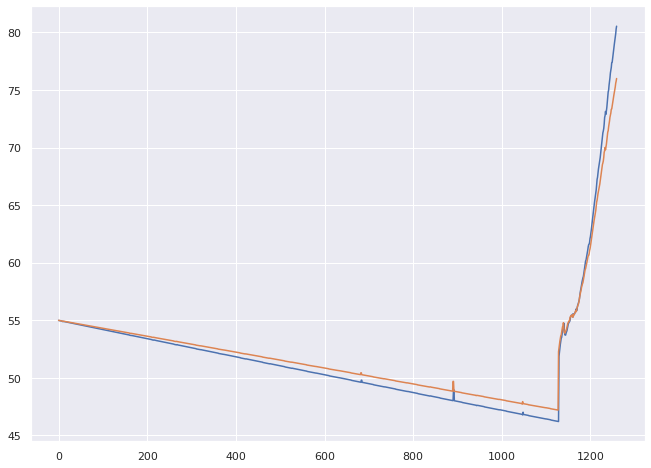

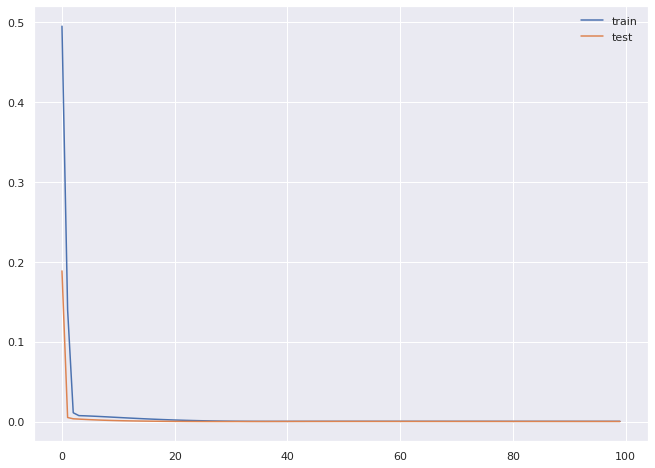

Dataset for imputation -            Date  Rainfall_Settefrati  ...  year  month
1096 2015-01-01                  5.2  ...  2015    Jan
1097 2015-01-02                  1.8  ...  2015    Jan
1098 2015-01-03                  NaN  ...  2015    Jan
1099 2015-01-04                  0.4  ...  2015    Jan
1100 2015-01-05                  NaN  ...  2015    Jan
...         ...                  ...  ...   ...    ...
3099 2020-06-26                  NaN  ...  2020    Jun
3100 2020-06-27                  NaN  ...  2020    Jun
3101 2020-06-28                  NaN  ...  2020    Jun
3102 2020-06-29                  NaN  ...  2020    Jun
3103 2020-06-30                  NaN  ...  2020    Jun

[2008 rows x 6 columns]
(627, 8)
(627,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


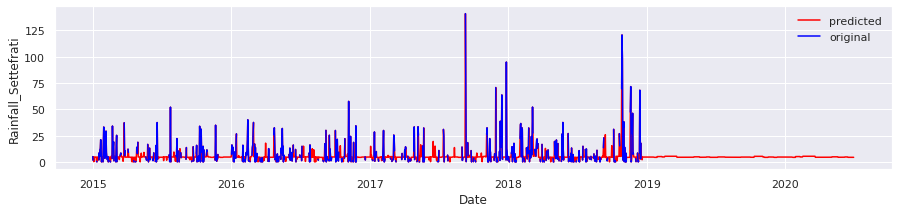

(1461, 8)
(1461,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


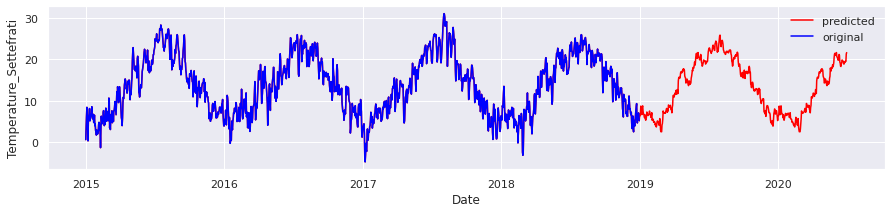

(1387, 8)
(1387,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


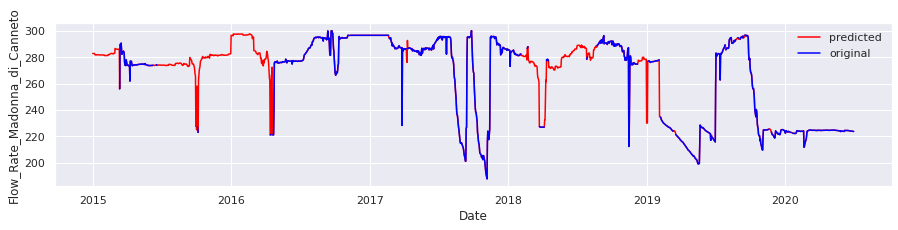


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Flow_Rate_Madonna_di_Canneto']
Index(['Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto', 'year'],
      dtype='object')
-0.001422475 0.007112375
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var3(t)'], dtype='object')
1404 603
(1404, 1, 4) (1404,) (603, 1, 4) (603,)
[-0.02291274 -0.01206371 -0.01179484  0.02218218]
Mean: -0.0061472775
Standard Deviation: 0.016959792


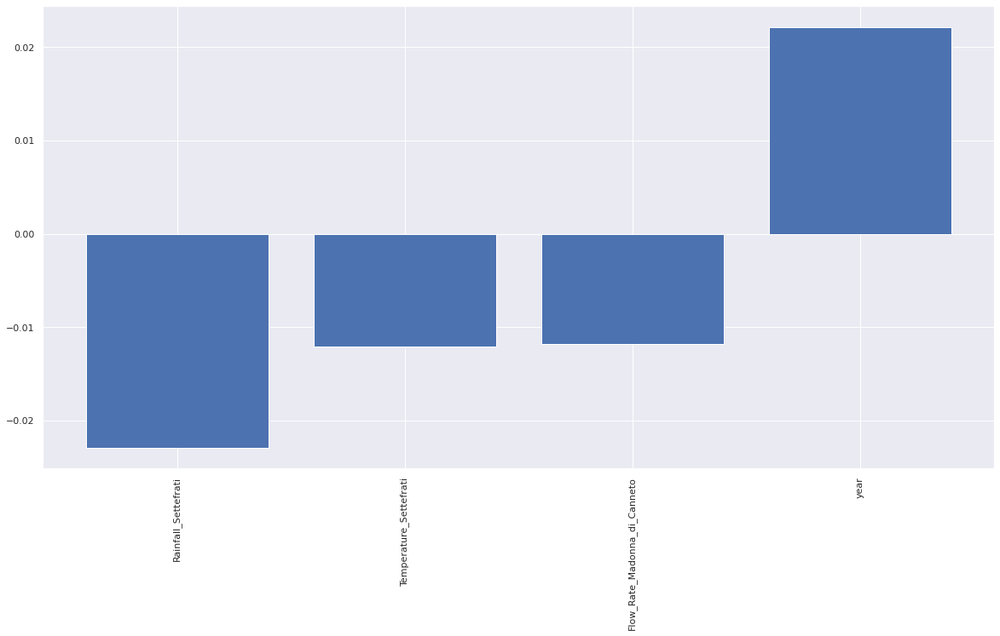

Selected Features - (array([0, 3]),)
foo shape - (1404, 1, 1, 2)
Train reshape - (1404, 1, 2)
foo shape - (603, 1, 1, 2)
Test reshape - (603, 1, 2)
Epoch 1/100
44/44 - 0s - loss: 0.6256 - val_loss: 0.1850
Epoch 2/100
44/44 - 0s - loss: 0.4512 - val_loss: 0.0883
Epoch 3/100
44/44 - 0s - loss: 0.2442 - val_loss: 0.1108
Epoch 4/100
44/44 - 0s - loss: 0.1038 - val_loss: 0.3011
Epoch 5/100
44/44 - 0s - loss: 0.0605 - val_loss: 0.4065
Epoch 6/100
44/44 - 0s - loss: 0.0509 - val_loss: 0.4000
Epoch 7/100
44/44 - 0s - loss: 0.0472 - val_loss: 0.3769
Epoch 8/100
44/44 - 0s - loss: 0.0446 - val_loss: 0.3553
Epoch 9/100
44/44 - 0s - loss: 0.0424 - val_loss: 0.3354
Epoch 10/100
44/44 - 0s - loss: 0.0404 - val_loss: 0.3145
Epoch 11/100
44/44 - 0s - loss: 0.0388 - val_loss: 0.2983
Epoch 12/100
44/44 - 0s - loss: 0.0371 - val_loss: 0.2780
Epoch 13/100
44/44 - 0s - loss: 0.0359 - val_loss: 0.2642
Epoch 14/100
44/44 - 0s - loss: 0.0347 - val_loss: 0.2485
Epoch 15/100
44/44 - 0s - loss: 0.0339 - val_loss

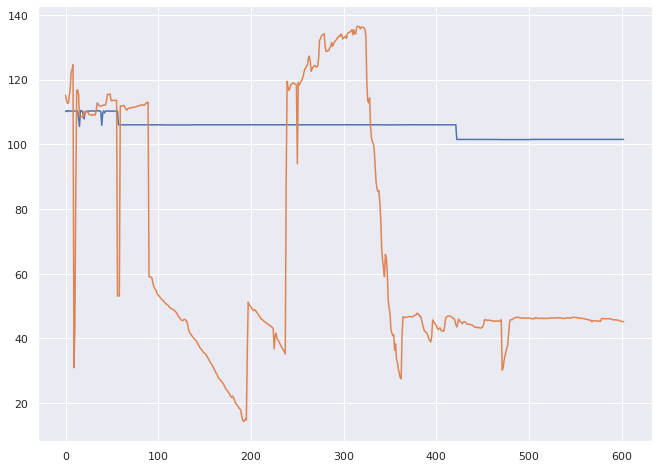

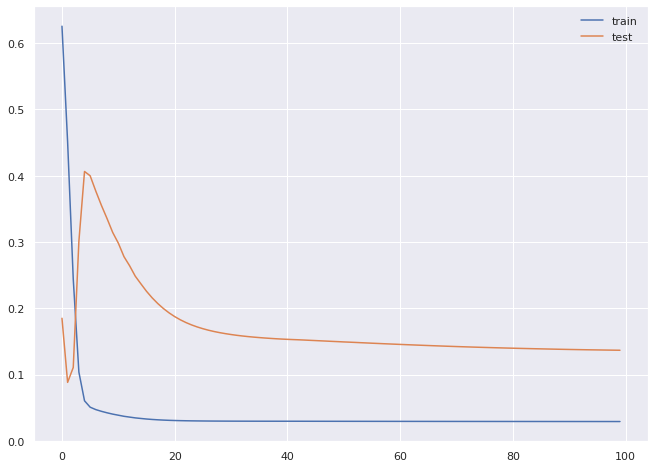

In [ ]:
for acea_df,acea_df_target in zip(all_data,all_data_target):
    print("Dataset for imputation - " + str(acea_df))
    acea_df = data_impute(acea_df)
    print("target Attributes - " + str(acea_df_target))
    forecast(acea_df,acea_df_target)


## XGBOOST

In [ ]:
# Aquifer_Doganella.columns

In [ ]:
# import xgboost as xgb
# from sklearn.model_selection import KFold, train_test_split, GridSearchCV

# # define model
# model = xgb.XGBRegressor()


In [ ]:
# from sklearn.metrics import mean_squared_error, mean_absolute_error

# print("Parameter optimization")
# xgb_model = xgb.XGBRegressor(n_jobs=1)
# clf = GridSearchCV(xgb_model,scoring = 'neg_mean_absolute_error',
#                    param_grid = {'max_depth': [2, 4, 6],
#                     'n_estimators': [50, 100, 200]}, verbose=1, n_jobs=1)
# clf.fit(X.values, y.values)
# print(clf.best_score_)
# print(clf.best_params_)
# param = clf.best_params_

In [ ]:
# xgb_model = xgb.XGBRegressor(max_depth=4,n_estimators=50).fit(X_train.values, y_train.values)
# predictions = xgb_model.predict(X_test.values)
# actuals = y_test.values
# print('MSE: ')
# print(mean_squared_error(actuals, predictions))
# print('MAE: ')
# print(mean_absolute_error(actuals,predictions))
    
# xgb.plot_importance(xgb_model) 

In [ ]:
# plt.plot(actuals)
# plt.plot(predictions)

## ARIMA

In [ ]:
"""!pip install chart_studio
import chart_studio.plotly as ply
import cufflinks as cf

!pip install pmdarima
import pmdarima as pm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from math import sqrt

from pandas import datetime
from sklearn.metrics import mean_squared_error"""

'!pip install chart_studio\nimport chart_studio.plotly as ply\nimport cufflinks as cf\n\n!pip install pmdarima\nimport pmdarima as pm\nfrom statsmodels.graphics.tsaplots import plot_acf, plot_pacf\nimport warnings\nfrom math import sqrt\n\nfrom pandas import datetime\nfrom sklearn.metrics import mean_squared_error'

In [ ]:
"""fig, axes = plt.subplots(3, 2, sharex=True)

axes[0, 0].plot(df.Depth_to_Groundwater_Pozzo_1); 
axes[0, 0].set_title('Original Series')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.squeeze(), ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().diff().dropna(), ax=axes[2, 1])

plt.show()"""

"fig, axes = plt.subplots(3, 2, sharex=True)\n\naxes[0, 0].plot(df.Depth_to_Groundwater_Pozzo_1); \naxes[0, 0].set_title('Original Series')\nplot_acf(df.Depth_to_Groundwater_Pozzo_1.squeeze(), ax=axes[0, 1])\n\n# 1st Differencing\naxes[1, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff()); \naxes[1, 0].set_title('1st Order Differencing')\nplot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().dropna(), ax=axes[1, 1])\n\n# 2nd Differencing\naxes[2, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff().diff()); \naxes[2, 0].set_title('2nd Order Differencing')\nplot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().diff().dropna(), ax=axes[2, 1])\n\nplt.show()"

In [ ]:
"""def evaluate_arima_model(X, arima_order):
	# prepare training dataset
	train_size = int(len(X) * 0.66)
	train, test = X[0:train_size], X[train_size:]
	history = [x for x in train]
	# make predictions
	predictions = list()
	for t in range(len(test)):
		model = ARIMA(history, order=arima_order)
		model_fit = model.fit()
		yhat = model_fit.forecast()[0]
		predictions.append(yhat)
		history.append(test[t])
	# calculate out of sample error
	rmse = sqrt(mean_squared_error(test, predictions))
	return rmse
 
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
	dataset = dataset.astype('float32')
	best_score, best_cfg = float("inf"), None
	for p in p_values:
		for d in d_values:
			for q in q_values:
				order = (p,d,q)
				try:
					rmse = evaluate_arima_model(dataset, order)
					if rmse < best_score:
						best_score, best_cfg = rmse, order
					print('ARIMA%s RMSE=%.3f' % (order,rmse))
				except:
					continue
	print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))
 
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(df.values, p_values, d_values, q_values)"""

'def evaluate_arima_model(X, arima_order):\n\t# prepare training dataset\n\ttrain_size = int(len(X) * 0.66)\n\ttrain, test = X[0:train_size], X[train_size:]\n\thistory = [x for x in train]\n\t# make predictions\n\tpredictions = list()\n\tfor t in range(len(test)):\n\t\tmodel = ARIMA(history, order=arima_order)\n\t\tmodel_fit = model.fit()\n\t\tyhat = model_fit.forecast()[0]\n\t\tpredictions.append(yhat)\n\t\thistory.append(test[t])\n\t# calculate out of sample error\n\trmse = sqrt(mean_squared_error(test, predictions))\n\treturn rmse\n \n# evaluate combinations of p, d and q values for an ARIMA model\ndef evaluate_models(dataset, p_values, d_values, q_values):\n\tdataset = dataset.astype(\'float32\')\n\tbest_score, best_cfg = float("inf"), None\n\tfor p in p_values:\n\t\tfor d in d_values:\n\t\t\tfor q in q_values:\n\t\t\t\torder = (p,d,q)\n\t\t\t\ttry:\n\t\t\t\t\trmse = evaluate_arima_model(dataset, order)\n\t\t\t\t\tif rmse < best_score:\n\t\t\t\t\t\tbest_score, best_cfg = rmse, orde

In [ ]:
"""model = pm.auto_arima(df.Depth_to_Groundwater_Pozzo_1, start_p=1, start_q=1,
                          test='adf',  # use adftest to find optimal 'd'
                          max_p=5, max_q=5,  # maximum p and q
                          m=4,  # frequency of series
                          d=None,  # let model determine 'd'
                          seasonal=True,  # No Seasonality
                          start_P=0,
                          D=0,
                          trace=True,
                          error_action='ignore',
                          suppress_warnings=True)"""

"model = pm.auto_arima(df.Depth_to_Groundwater_Pozzo_1, start_p=1, start_q=1,\n                          test='adf',  # use adftest to find optimal 'd'\n                          max_p=5, max_q=5,  # maximum p and q\n                          m=4,  # frequency of series\n                          d=None,  # let model determine 'd'\n                          seasonal=True,  # No Seasonality\n                          start_P=0,\n                          D=0,\n                          trace=True,\n                          error_action='ignore',\n                          suppress_warnings=True)"

In [ ]:
"""stepwise_model.summary()
stepwise_model.fit(train).fit(train)
pred = pd.DataFrame(stepwise_model.fit(train).predict(n_periods = len(test)),index=test.index)
pred.columns = ['pred']
pred
plt.plot(train,label="train")
plt.plot(test,label="test")
plt.plot(pred,label="pred")"""

'stepwise_model.summary()\nstepwise_model.fit(train).fit(train)\npred = pd.DataFrame(stepwise_model.fit(train).predict(n_periods = len(test)),index=test.index)\npred.columns = [\'pred\']\npred\nplt.plot(train,label="train")\nplt.plot(test,label="test")\nplt.plot(pred,label="pred")'